# Master Project: Predicting Strain Using Machine Learning

## Introduction

### Importing packages

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import sys
import time
import pickle

import xgboost as xgb
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import RobustScaler
import shap
import statistics as stat

from sklearn.neural_network import MLPRegressor
from sklearn import svm

np.random.seed(42)

## Method

### Loading data and defining key functions
In this section we set the config and define the functions for loading the data, training our models and testing.

In [2]:
def config():
    """
    CONFIG FUNCTION CONTAINING PARAMETERS AND OTHER MODEL DETAILS.
    """

    conf = {}

    conf['parameters'] = {'colsample_bytree':[0.9], 'alpha':[5], 'lambda':[0.1], 'learning_rate': [0.1],
                  'n_estimators': [50, 100, 200], 'max_depth':[3, 5, 7]}
    
    #conf['parameters'] = {'colsample_bytree':[0.9], 'alpha':[5], 'lambda':[0.1], 'learning_rate': [0.1],
    #              'n_estimators': [100, 200], 'max_depth':[5, 7]}
    
    #conf['parameters'] = {'colsample_bytree':[0.9], 'alpha':[5], 'lambda':[0.1], 'learning_rate': [0.1],
    #              'n_estimators': [200], 'max_depth':[7]}
    #^THIS CONFIG IS FOR TIMING PURPOSES
    
    conf['model_details'] = {'objective' : "reg:squarederror",
                            'test_size' : 0.2}

    return conf


#### Function for importing data

In [3]:
def get_experiment_data(folder, filename, features, target, scale=True, indices=False):
    """
    IMPORTS STRAIN DATASET FOR THE ROCK EXPERIMENTS FROM FOLDER AND
    CREATES DATAFRAME WITH FORMAT BASED ON TYPE OF TESTING.

    folder: The folder of the data
    filename: string with full name of file or list with string filenames
    experiment: Name of the experiment file             (not needed)
    features: Dataset features contained within the file
    target: String indicating which feature to predict
    scale: Determines if time array should be rescaled
    """
    
    if indices == True:
        flag = False #my stupid solution needs this
        for i in range(0,len(filename)):
            if filename[i-1][13] != filename[i][13]:
                flag = True
    
        if flag == False:
            indices = False
        

    if isinstance(filename,str):
        DF = pd.read_csv(folder+filename, delim_whitespace=True)
        DF = DF.dropna()

    elif isinstance(filename,list):
        #Scaling cannot be an option if you have multiple datasets
        DF = pd.read_csv(folder+filename[0], delim_whitespace=True)
        DF = DF.dropna()

        scaler = RobustScaler()
        DF[features] = scaler.fit_transform(DF[features].values)
        times = DF[target].values
        times = (times-min(times))/(max(times)-min(times))
        DF[target] = times

        for i in range(1,len(filename)):
            df = pd.read_csv(folder+filename[i], delim_whitespace=True)
            df = df.dropna()
            
            
            df[features] = scaler.fit_transform(df[features].values)
            times = df[target].values
            times = (times-min(times))/(max(times)-min(times))
            df[target] = times

            if indices == True:
                #print(filename[i-1][13])
                if filename[i-1][13] != filename[i][13]:
                    index_1 = len(DF) #Very quick fix this is horrendous!
                    
            DF = DF.append(df, ignore_index=True)#DF = DF.append(df)
            
                    

    else:
        print("filename variable must be valid type, string or list of strings")

    scaler = RobustScaler()# works better with outliers
    DF[features] = scaler.fit_transform(DF[features].values)


    if scale == True:
        times = DF[target].values
        times = (times-min(times))/(max(times)-min(times))
        DF[target] = times
        
        if indices == True:
            return DF, times, index_1
    
        else:
            return DF, times

    else:
        times = DF[target].values
        
        if indices == True:
            return DF, times, index_1
        
        else:
            return DF, times

In [4]:
def remove_outliers(dataset, target, feature_list, threshold=0.95, verbose=False):
    """
    Removing the top threshold percentile from the list of values within each feature but also within each different
    value of target
    dataset: The full dataset to be evaluated
    target: 
    feature_list: List of features to remove outliers from. Do not use same type of features multiple times
    i.e dp50 and dp70, because if an outlier is removed from dp50 it will also be removed from dp70.
    threshold: The percentile of data that qualifies as an outlier.
    """
        
    l = len(dataset[feature_list[0]])
    
    k = [key for key,val in target.items()]
    counter = [0]
    xvals = []
    
    
    for j in range(len(k)-1):
            if target[k[j]] != target[k[j+1]]: #j+1 doesnt work but need next element, but that returns list index OORange
                counter.append(k[j])
    
     
    for i in range(len(feature_list)):
        
        df_list = []
        for j in range(len(counter)-1):
            
            if dataset[feature_list[i]][counter[j]:counter[j+1]].empty == False:
                p = np.percentile( dataset[feature_list[i]][counter[j]:counter[j+1]], threshold ) #Want to find all threshold percentile keys within this subset and remove them
            
                kept = dataset[feature_list[i]][counter[j]:counter[j+1]]>p
                t = dataset[counter[j]:counter[j+1]][kept]
                
                df_list.append(t)
            else:
                break
    
        dataset = pd.concat(df_list)
        dataset.dropna()
    
    if verbose == True:
        print(f"datapoints in full dataframe {l},\ndatapoints without outliers {len(dataset)},\noutliers removed {l-len(dataset)}")
    
    return dataset


In [5]:
def remove_outliers_nointervals(dataset, target, feature_list, threshold=0.95, verbose=False):
    """
    Removing the top threshold percentile from the list of values within each feature
    dataset: The full dataset to be evaluated
    target: 
    feature_list: List of features to remove outliers from. Do not use same type of features multiple times
    i.e dp50 and dp70, because if an outlier is removed from dp50 it will also be removed from dp70.
    threshold: The percentile of data that qualifies as an outlier.
    """
        
    l = len(dataset[feature_list[0]])
    
    for i in range(len(feature_list)):
        p = np.percentile( dataset[feature_list[i]], threshold )
        dataset = dataset[dataset[feature_list[i]]>p]
    
    if verbose == True:
        print(f"datapoints in full dataframe {l},\ndatapoints without outliers {len(dataset)},\noutliers removed {l-len(dataset)}")
    
    return dataset


#### Functions for training models

In [6]:
def train_xgb_model(dataframe, target, features, config):
    """
    TRAINS AN XGBOOST MODEL ON A (PORTION OF) DATAFRAME
    dataframe: the data to train on
    target: String indicating which feature to predict
    features: Dataset features for the model to train on
    config: Dictionary that contains parameters, test_size and objective
    """
    xgb_model = xgb.XGBRegressor(objective=config['model_details']['objective'])  #regression
    grid_search = GridSearchCV(estimator=xgb_model, param_grid=config['parameters'], cv=10, n_jobs=-1)

    grid_search.fit(dataframe[features], dataframe[target])
    final_model = grid_search.best_estimator_

    return final_model

In [7]:
def train_nn_model(dataframe, target, features):
    """
    SOME OTHER MODEL TO TRAIN AND COMPARE
    """

    #NN_model = MLPRegressor(hidden_layer_sizes=(128,64,), max_iter=1000, activation='logistic', alpha=0.0005)  #regression
    #NN_model = MLPRegressor(hidden_layer_sizes=(128,64,), max_iter=1000, activation='relu', alpha=0.0005)  #regression
    NN_model = MLPRegressor(hidden_layer_sizes=(128,64,), max_iter=1500, activation='tanh', alpha=0.0005)  #regression
    
    #grid_search = GridSearchCV(estimator=NN_model, )
    #grid_search.fit(dataframe[features], dataframe[target])
    #final_model = grid_search.best_estimator_
    final_model = NN_model.fit(dataframe[features], dataframe[target])

    return final_model

In [8]:
def train_svm_model(dataframe, target, features):
    """
    SOME OTHER MODEL TO TRAIN AND COMPARE
    """

    svm_model = svm.SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)  #regression
    #grid_search = GridSearchCV(estimator=NN_model, )
    #grid_search.fit(dataframe[features], dataframe[target])
    #final_model = grid_search.best_estimator_
    final_model = svm_model.fit(dataframe[features], dataframe[target])
    
    return final_model

#### Test function

In [9]:
def test_regression_model(model, features, target, dataset):
    """
    FUNCTION TESTS MODEL ON TEST SET
    model: Trained model to test on test set
    features: Features/Predictors in the dataset
    target: String indicating which feature to predict
    dataset: The data to test on (can send in either train, test or different set)
    """

    predicts = model.predict(dataset[features])
    rmse = np.sqrt(mean_squared_error(dataset[target], predicts))
    r2 = r2_score(dataset[target], predicts)

    scores = [len(dataset[target]), rmse, r2]
    return scores

In [10]:
def save_test_data(model, features, target, dataframe, location, filename):
    predicts = model.predict(dataframe[features].sort_index())
    data = dataframe[target].sort_index()
    #print(data)
    #print(predicts)
    x = np.linspace(0,len(data)-1,len(data))
    #plt.plot(x,predicts)
    #plt.plot(x,data)
    #plt.show()
    pred_vs_observed = np.column_stack((x,data,predicts))
    print(pred_vs_observed)
    np.savetxt(location+filename,pred_vs_observed)
    
    
    return

#### Plotting functions

In [11]:
def plot_data_time_evolutions(DataFrame, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    feature:
    plot_strings:
    """
    x = np.linspace(0,len(DataFrame)-1,len(DataFrame))
    y = []
    for i in range(len(features)):
        y.append(DataFrame[features[i]])
    
        plt.plot(x, y[i]) #plt.plot(x , y, 'ro')
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    
    return

In [12]:
def plot_data_evolutions(DataFrame, xfeature, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    xfeature: The feature along the x-axis that the other feater will be plotted against
    feature:
    plot_strings:
    """
    y = []
    for i in range(len(features)):
        y.append(DataFrame[features[i]])
    
        plt.plot(xfeature , y[i]) #plt.plot(x , y, 'ro')
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return

In [13]:
def plot_data_errorbars(DataFrame, xfeature, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    xfeature: The feature along the x-axis that the other feater will be plotted against
    feature:
    plot_strings:
    """
    
    counter = [0]
    xvals = []
    
    k = [key for key,val in xfeature.items()]
    
    for j in range(len(k)-1):
            if xfeature[k[j]] != xfeature[k[j+1]]: #j+1 doesnt work but need next element, but that returns list index OORange
                counter.append(k[j])
                xvals.append(xfeature[k[j]])
        
    for i in range(len(features)):
        
        ymeans = []
        ydev = []
        
        for j in range(len(counter)-1):
            mean = stat.mean( DataFrame[features[i]][counter[j]:counter[j+1] ] )
            dev = stat.stdev( DataFrame[features[i]][counter[j]:counter[j+1] ] )
            ymeans.append( mean )
            ydev.append( dev )
            
        plt.errorbar(xvals,ymeans,yerr=ydev,fmt='-o',capsize=3,markeredgewidth=2)
    
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return


In [14]:
def plot_data_errorbars_edit(DataFrame, xfeature, features, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    xfeature: The feature along the x-axis that the other feater will be plotted against
    feature:
    plot_strings:
    """
    
    counter = [0]
    xvals = []
    
    k = [key for key,val in xfeature.items()]
    
    for j in range(len(k)-1):
            if xfeature[k[j]] != xfeature[k[j+1]]: #j+1 doesnt work but need next element, but that returns list index OORange
                counter.append(j)
                xvals.append(xfeature[j])
    
    for i in range(len(features)):
        
        ymeans = []
        ydev = []
        
        for j in range(len(counter)-1):
            mean = stat.mean( DataFrame[features[i]][counter[j]:counter[j+1] -1] )
            dev = stat.stdev( DataFrame[features[i]][counter[j]:counter[j+1] -1] )
            ymeans.append( mean )
            ydev.append( dev )
            
        plt.errorbar(xvals,ymeans,yerr=ydev,fmt='-o',capsize=3,markeredgewidth=2)
    
    plt.legend([features[i] for i in range(len(features))])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return

In [15]:
def plot_feature_vs_prediction(DataFrame, feature, prediction, plot_strings):
    """
    PLOTS THE GIVEN FEATURE AGAINST THE NUMBER OF DATAPOINTS OF THE FEATURE
    DataFrame:
    feature:
    plot_strings:
    """
    x = np.linspace(0,len(DataFrame)-1,len(DataFrame))
    y = DataFrame[feature]
    
    plt.plot(x, prediction, 'r')
    plt.plot(x, y,'b') #plt.plot(x , y, 'ro')
    
    plt.legend(['prediction',feature])
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()
    return

In [16]:
def plot_sns_score_matrix(score_matrix, train_list, test_list, plot_strings, figsize=(10,10), savename=None, diagonal=True):
    """
    SEABORN CALLS ORDERED FOR PLOTTING SCORE MATRIX
    Takes the score_matrix and plots it with a title and
    the experiment_list as axes.
    """
    
    
    plt.rcParams["axes.titlesize"] = 20
    plt.rcParams["axes.labelsize"] = 16

    fig, ax = plt.subplots(figsize=figsize)
    g = sns.heatmap(score_matrix, annot=True, ax=ax, cmap="viridis", fmt=".2f") #vmin=-0.5, vmax=1.0
    ax.set_title(plot_strings[0])
    g.set_xticklabels(test_list, rotation=45, horizontalalignment='right')
    g.set_yticklabels(train_list, rotation=45, horizontalalignment='right')
    ax.set_ylabel(plot_strings[2])
    ax.set_xlabel(plot_strings[1])
    
    #cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    #cbar.ax.tick_params(labelsize=16)
    
    if diagonal == True:
        [ax.add_patch(Rectangle((i,i),1,1,fill=False,edgecolor='red',lw=2)) for i in range(len(train_list))]
    plt.show()
    
    if savename != None:
        fig.savefig(savename+'.pdf',format='pdf')
        fig.savefig(savename+'.eps',format='eps')
    
    return

In [17]:
def plot_observed_vs_predicted(dataset, target, model, features, plot_strings):
    """
    PLOTS THE OBSERVED TARGET VS THE PREDICTION OF THE MODEL
    dataset:
    target:
    model:
    features:
    plot_strings: list containing strings for title 0, and labels 1, 2
    """
    preds = model.predict(dataset[features])

    plt.plot(dataset[target], preds, 'ko')
    plt.plot([0, max(dataset[target])], [0, max(preds)], 'r-')
    plt.ylabel(plot_strings[2])
    plt.xlabel(plot_strings[1])
    plt.title(plot_strings[0])
    plt.show()

In [18]:
def represent_model_results(model, dataset, features, target, title, savename):
    """
    STORES/PLOTS THE RESULTS OF THE MODEL ON TEST SET
    """

    plt.rcParams["axes.titlesize"] = 20
    plt.rcParams["axes.labelsize"] = 16
    
    shap_vals = shap.TreeExplainer(model).shap_values( dataset[features] ) # train[features]
    importances = list(zip(features,model.feature_importances_))
    
    fig = shap.summary_plot(shap_vals, dataset[features], plot_type="bar",show=False)
    plt.title(title)
    
    #if savename != None:
    #    plt.savefig(savename+'.pdf',format='pdf')
    #    plt.savefig(savename+'.eps',format='eps')
    plt.show()
    
    shap_meansT = np.zeros(len(features))
    shapT = shap_vals.transpose()
    for i in range(len(features)):
        shap_meansT[i] = stat.mean(abs(shapT[i]))
        
        
    shap_list = list(zip(features, shap_meansT))
    shap_string = "feature SHAP_val importance\n" 
    for i in range(len(features)):
        shap_string += shap_list[i][0]+" "+str(shap_list[i][1])+" "+str(importances[i][1])+"\n"
        
    if savename != None:
        file = open(savename+'.txt', "w")
        file.write(shap_string)
        file.close()
    
    return shap_list

In [19]:
def save_data_by_name(data, location, name, raw=False):
    """
    saves some data with a filename to a location
    """
    file = open(location+name, "w")
    file.write(data)
    file.close()
        
    return 

In [20]:
def save_plot():
    
    return

### Selecting datasets
We can now start treating our data. We start by defining the list of experiment and features for our model to train on. We then go on to plot the correlation matrix of each dataset. The correlation matrix is interesting to compare to the feature importance in the xgboost models to see if it selects the features with the highest correlation as the most important feature. <- REWRITE
I also initially expect matrices with more correlation to make better models.

I save the scaled data for further analysis.

In [21]:
folder = '../strain_data_MS/' #rename experiment_folder -> add result_folder

experiments = ['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
num_exps = len(experiments)
#features = ['dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum']
features = ['dn_p90', 'dn_p75', 'dn_p50', 'dn_mean', 'dn_p25', 'dn_p10', 'dn_std', 'dn_num', 'dn_sum', 'dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum', 'cur_p90', 'cur_p75', 'cur_p50', 'cur_mean', 'cur_p25', 'cur_p10', 'cur_std', 'cur_num', 'cur_sum']
rad = '5' #Experiment resolutions 5 and 2
target = "ep" #"sigD2" #save as strain if ep, stress elif sigD2, else dont save

filenames = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in experiments]

result_folder = '../strain_model_output_MS/'
scaled_data_folder = '../scaled_strain_data/'
model_scores = 'model_scores_xgb_g'+rad+'0.txt'
score_str = "experiment mse r2 time\n"
model_score_matrix = 'transfer_learning_score_matrix_xgb_g'+rad+'0.txt'
model_preds = ['result_xgb_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
saved_models = ['../stored_models/model_xgb_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle


conf = config()

models = []
r2_train_vector = np.zeros(num_exps)
r2_test_matrix = np.zeros((num_exps,num_exps))

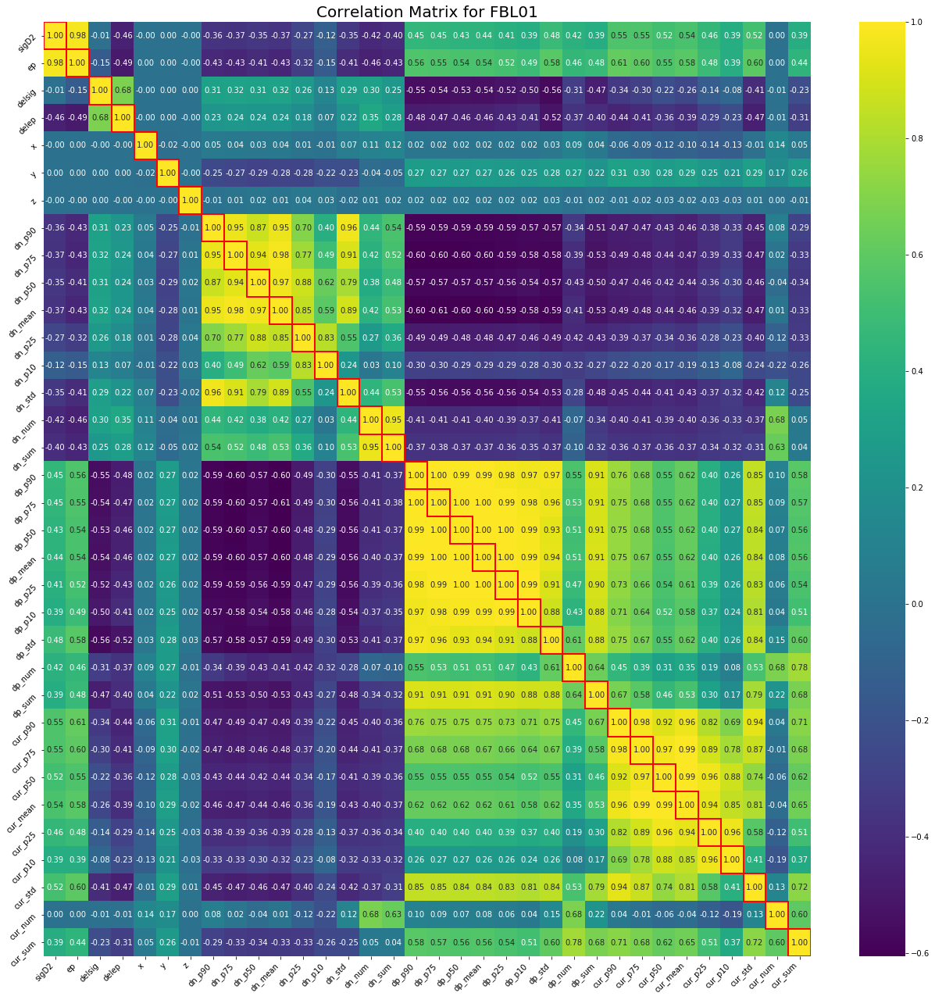

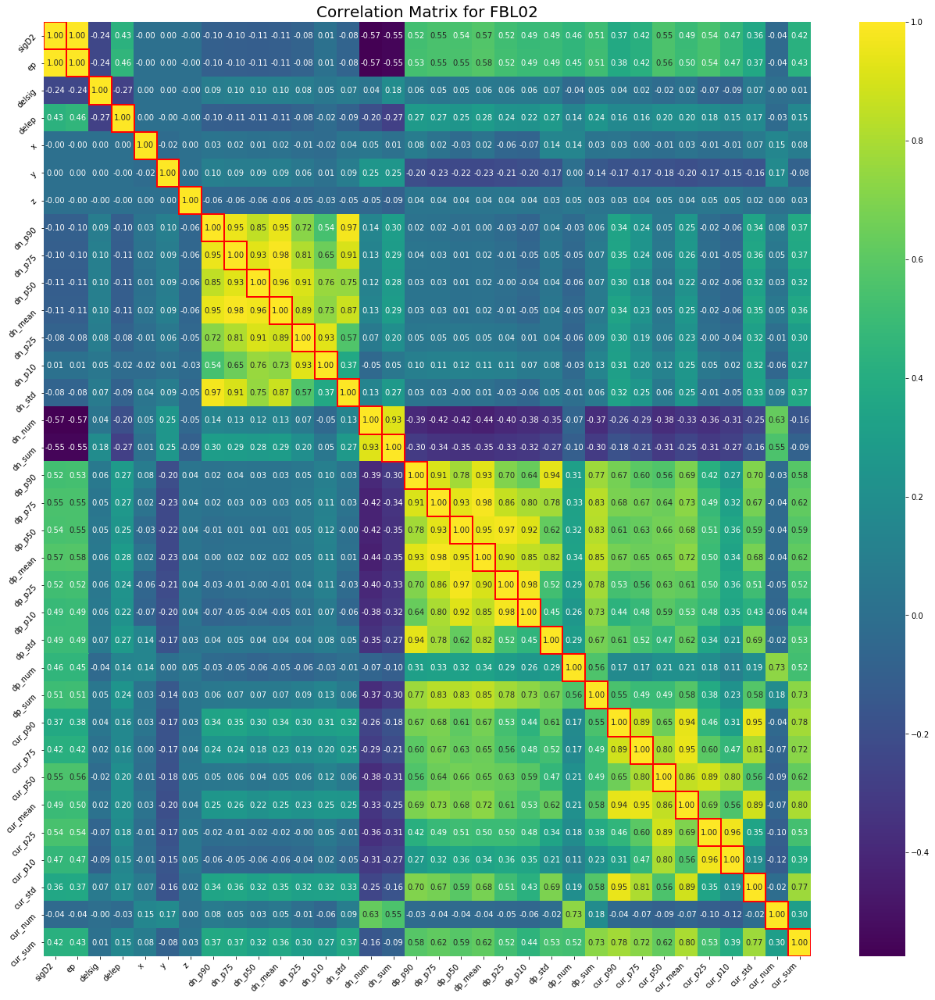

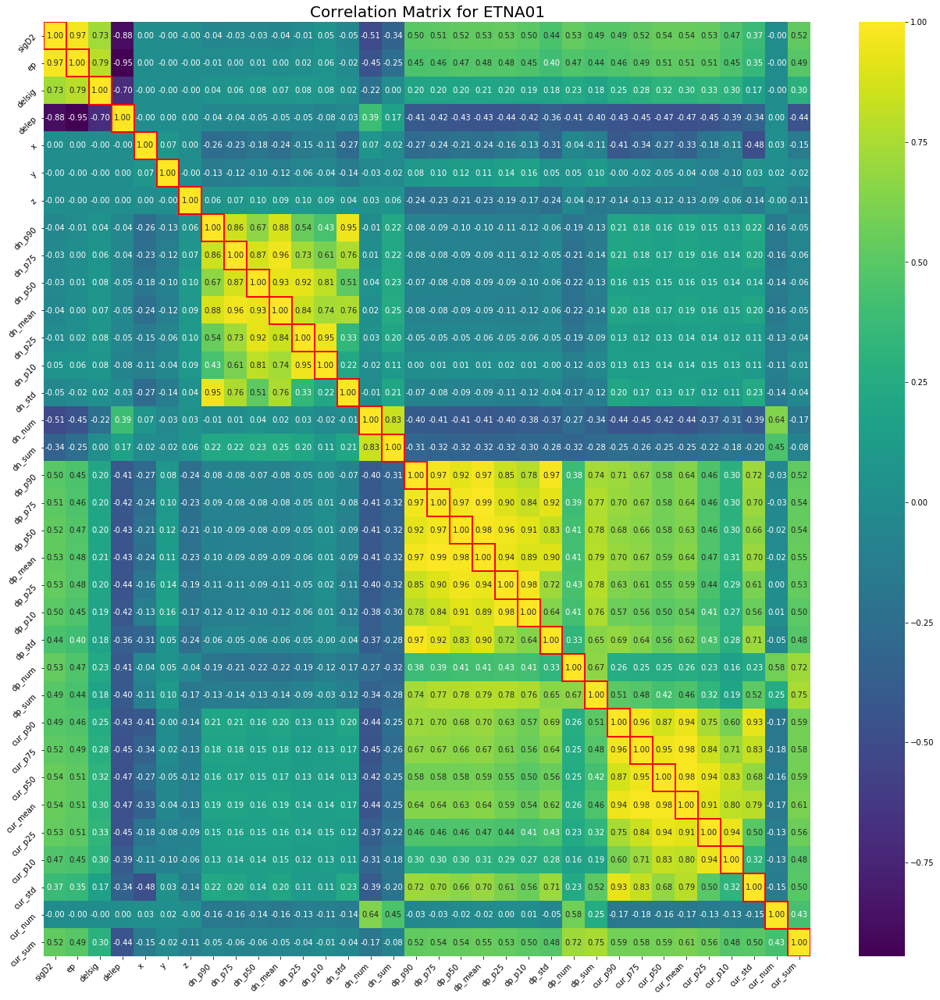

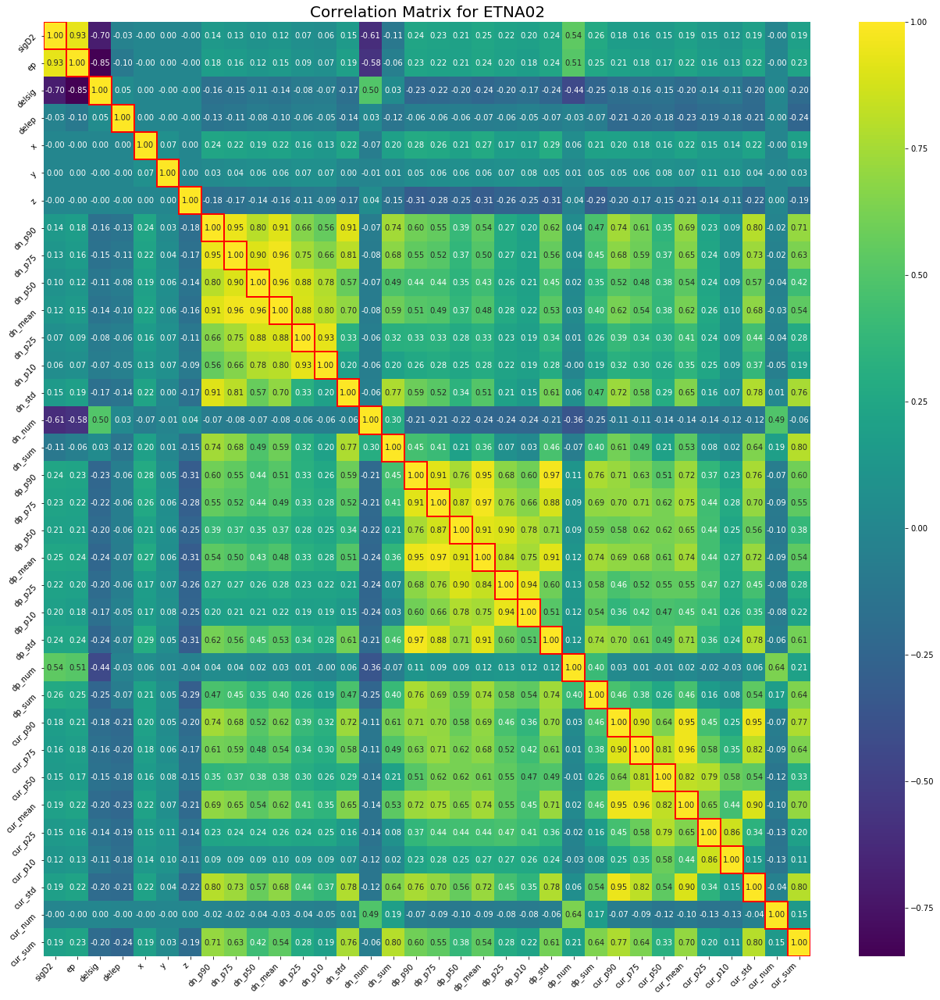

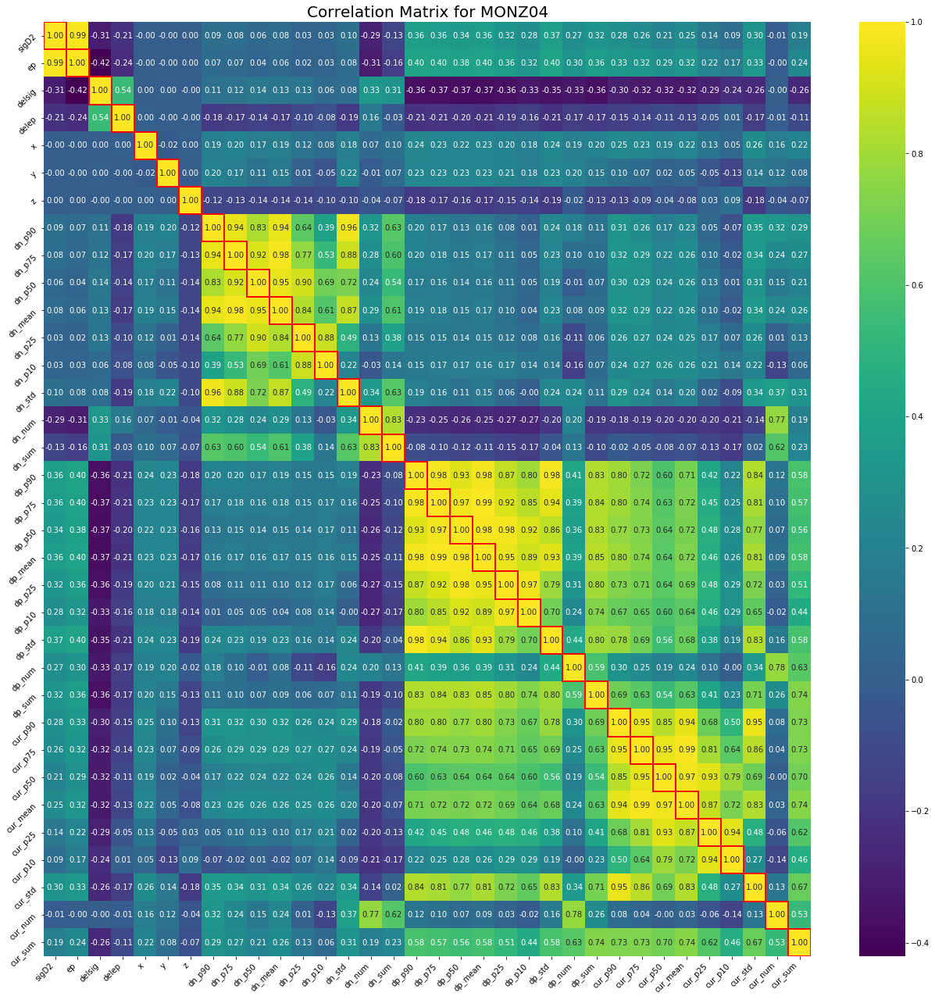

...

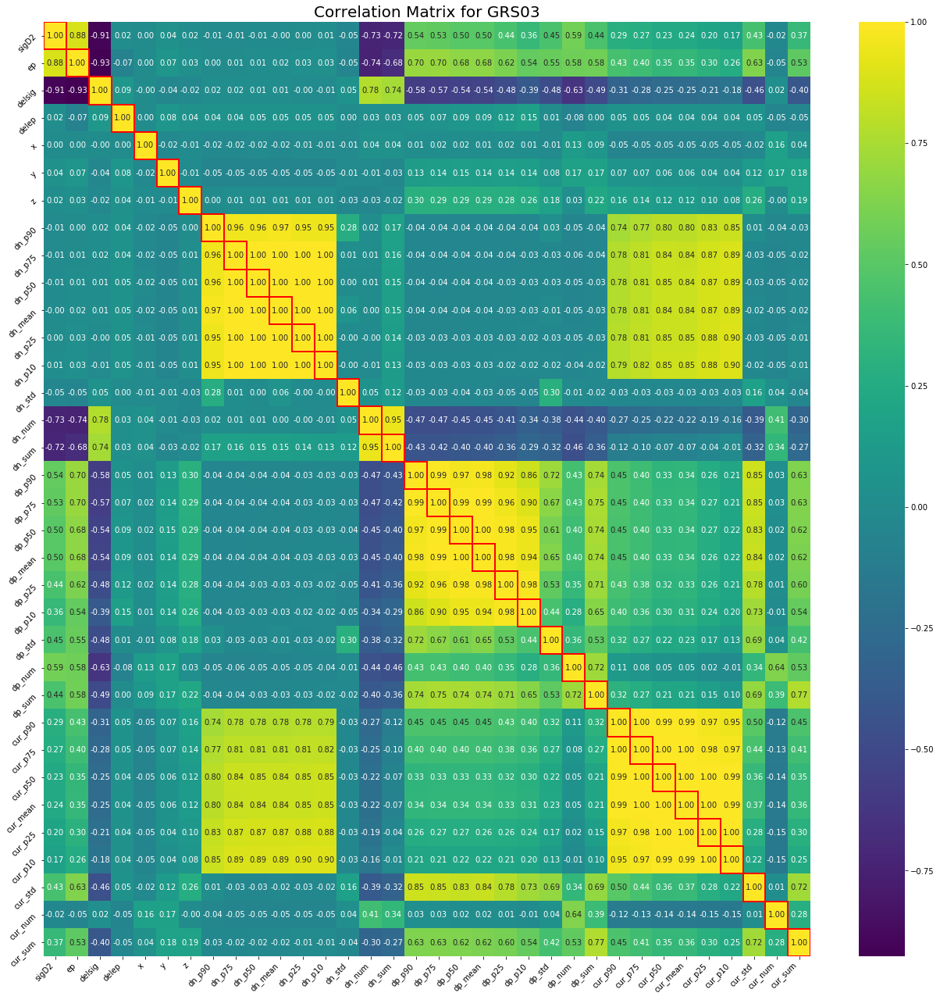

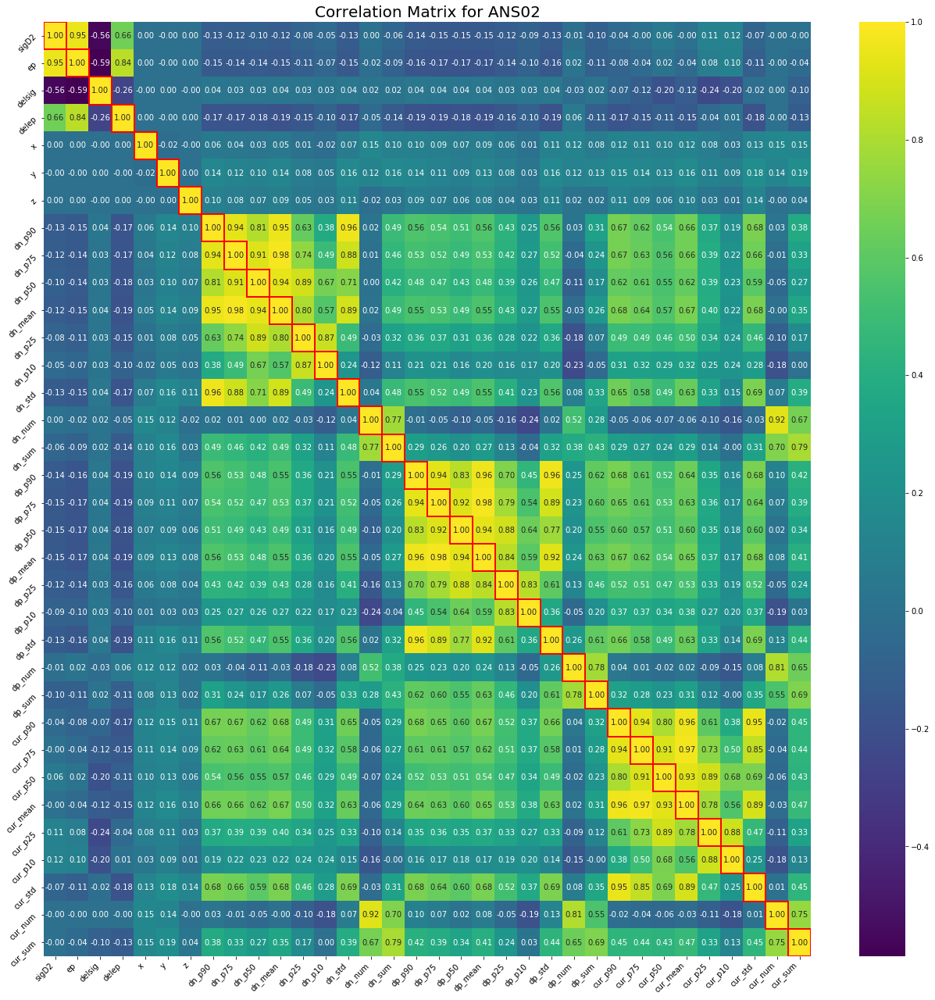

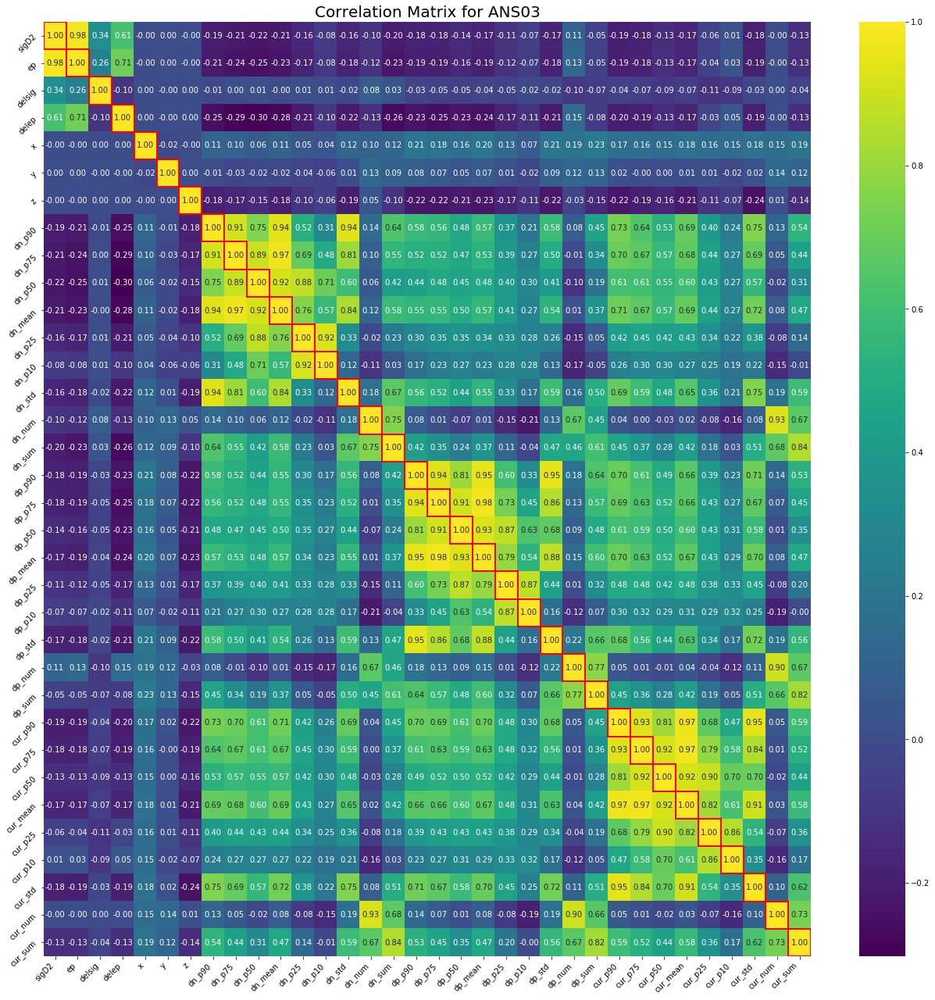

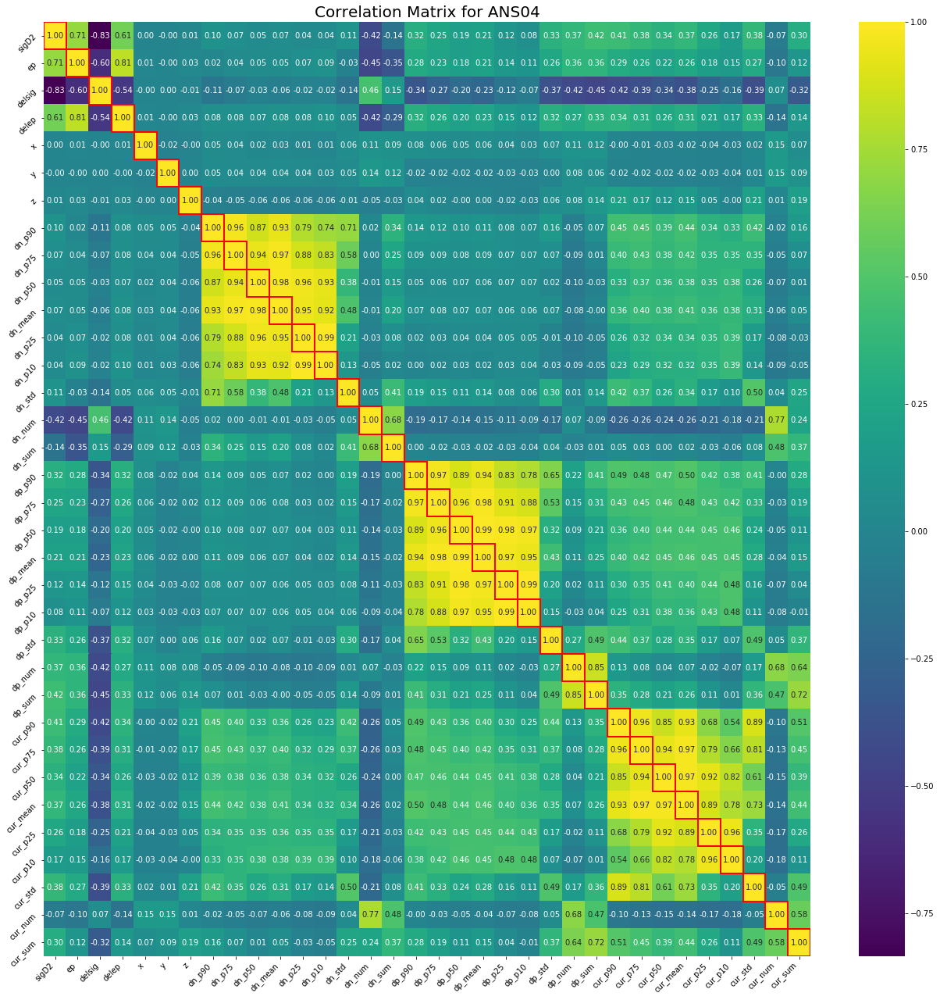

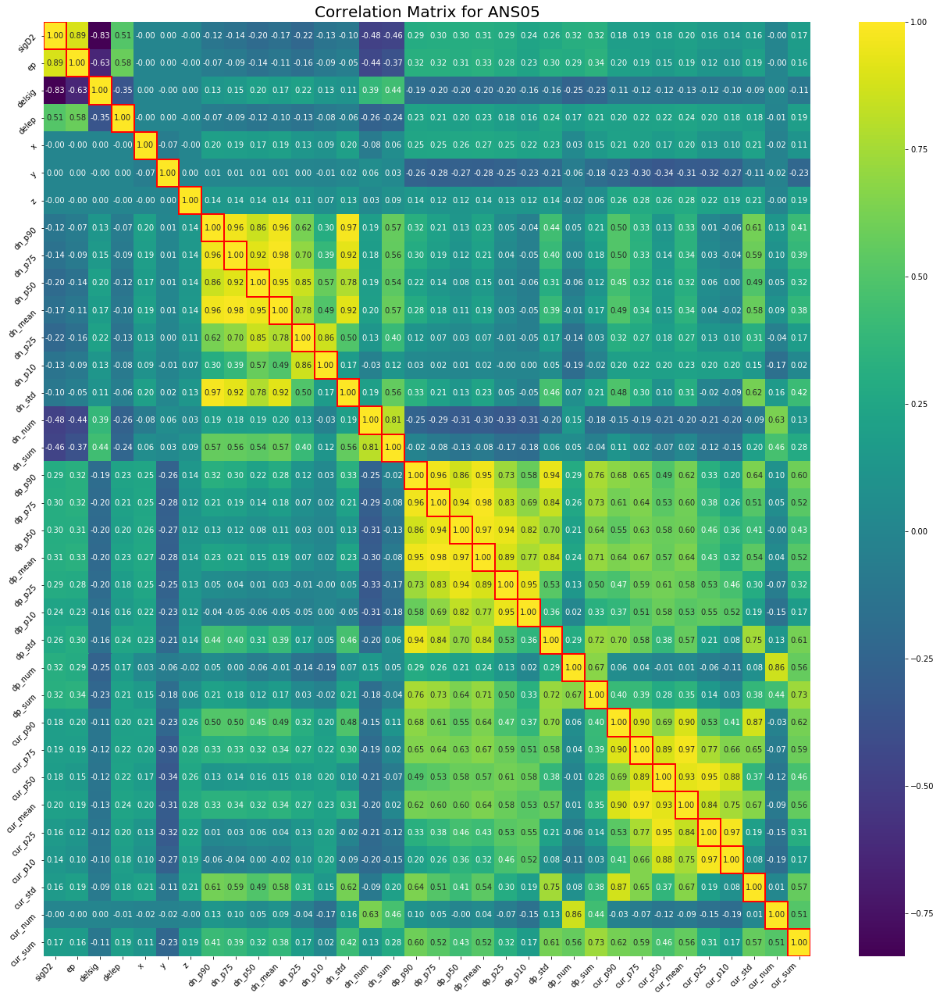

In [22]:
full_feature_list = ['sigD2','ep','delsig','delep','x','y','z']
full_feature_list.extend(features)
for i in range(num_exps):
    dataframe, timespan = get_experiment_data(folder, filenames[i], full_feature_list, target)
    correlation = dataframe.corr()
    plot_sns_score_matrix(correlation,full_feature_list,full_feature_list,["Correlation Matrix for "+experiments[i], "", ""],(22,22))

Looking at the correlation matrices we se that we tend to get higher correlations at dilation or shear. This fits somewhat with the SHAP values that our models have where dilation is the most important local strain component. However both shear and contraction have similar SHAP values in our models which is not exactly the trend we see in the correlation matrices here. Contraction often has a negative correlation which is expected but it also looks like its the strain component with most values close to 0.

### Training the xgboost model
We can now start training our model. In this section we focus on training a single dataset xgboost model.


Training xgb models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g50.txt, Completion: 6%


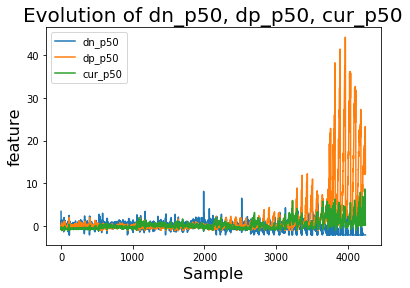

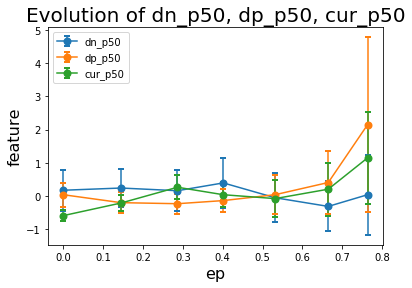

[[0.00000000e+00 0.00000000e+00 2.71023512e-01]
 [1.00000000e+00 0.00000000e+00 3.39943826e-01]
 [2.00000000e+00 0.00000000e+00 4.41384166e-01]
 ...
 [8.47000000e+02 1.00000000e+00 9.78370786e-01]
 [8.48000000e+02 1.00000000e+00 9.71470475e-01]
 [8.49000000e+02 1.00000000e+00 9.99256015e-01]]
Train: [3398, 0.13692187035468142, 0.8033649544233312] 
Test: [850, 0.17589453207253145, 0.6942109082774076]


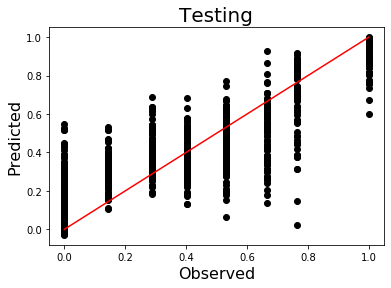

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


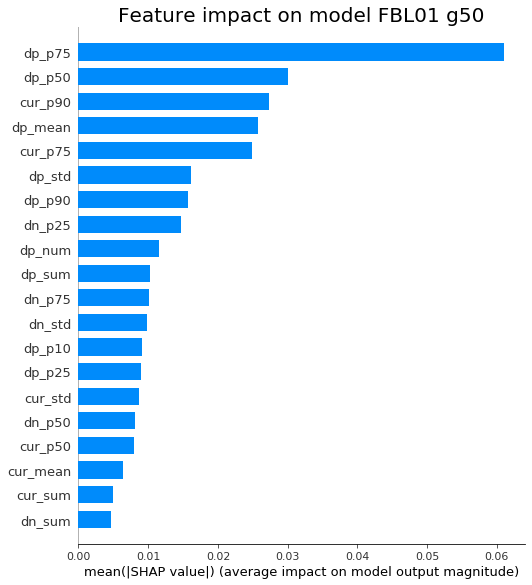

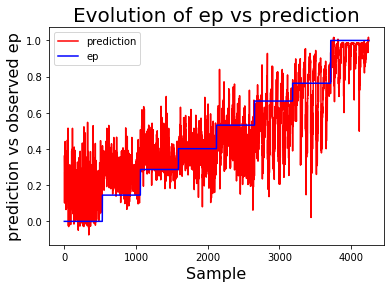

Current experiment: strains_curr_FBL02_g50.txt, Completion: 13%


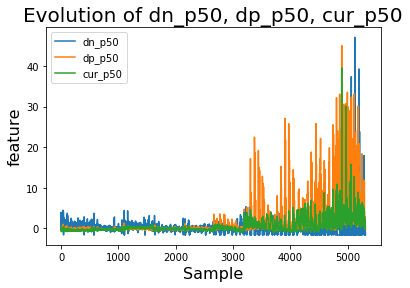

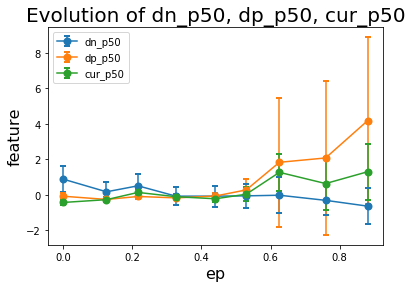

[[0.00000000e+00 0.00000000e+00 4.18107569e-01]
 [1.00000000e+00 0.00000000e+00 2.60832131e-01]
 [2.00000000e+00 0.00000000e+00 2.36065716e-01]
 ...
 [1.05900000e+03 1.00000000e+00 7.32663095e-01]
 [1.06000000e+03 1.00000000e+00 7.44223356e-01]
 [1.06100000e+03 1.00000000e+00 6.83468580e-01]]
Train: [4245, 0.11586393835531268, 0.8639332309757037] 
Test: [1062, 0.13871528819535847, 0.8004424366900676]


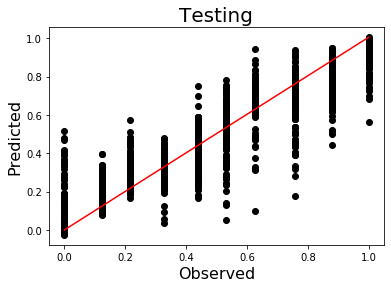

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


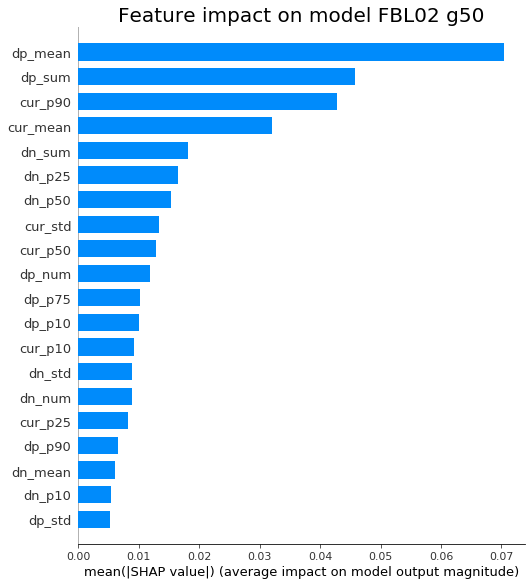

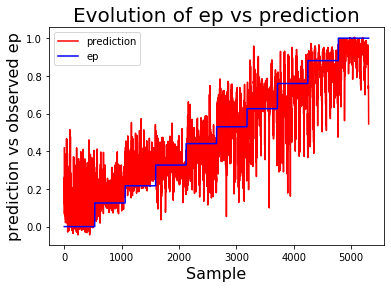

Current experiment: strains_curr_ETNA01_g50.txt, Completion: 20%


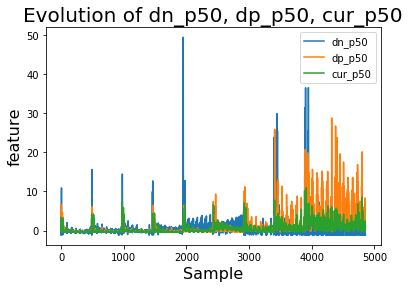

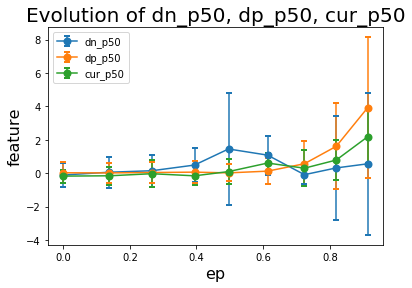

[[0.00000000e+00 0.00000000e+00 7.94615388e-01]
 [1.00000000e+00 0.00000000e+00 5.25948644e-01]
 [2.00000000e+00 0.00000000e+00 2.50291526e-01]
 ...
 [9.69000000e+02 1.00000000e+00 8.66583467e-01]
 [9.70000000e+02 1.00000000e+00 9.32466507e-01]
 [9.71000000e+02 1.00000000e+00 9.48604584e-01]]
Train: [3886, 0.12365107628527304, 0.8502004385685078] 
Test: [972, 0.1607816923182685, 0.7440248132291682]


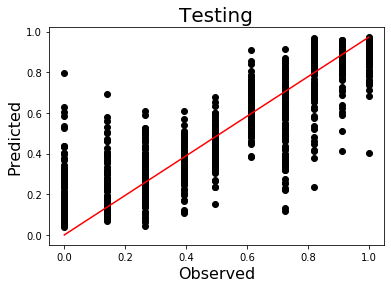

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


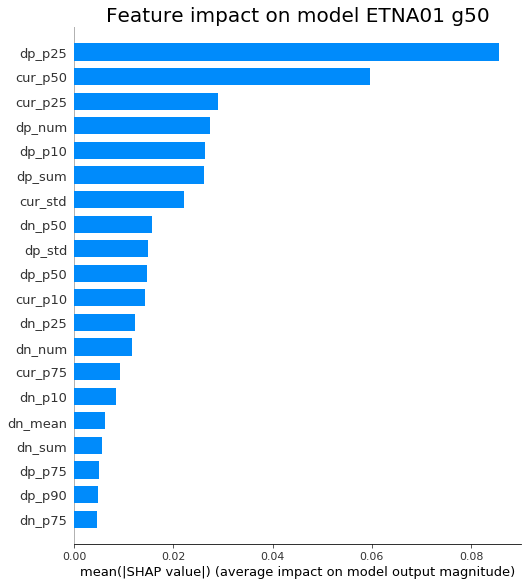

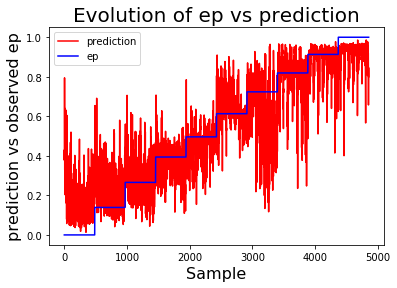

Current experiment: strains_curr_ETNA02_g50.txt, Completion: 26%


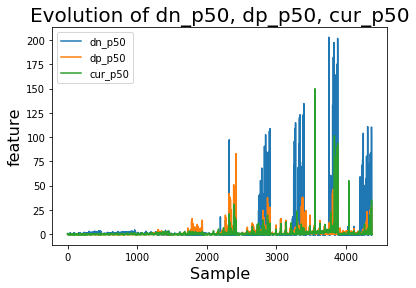

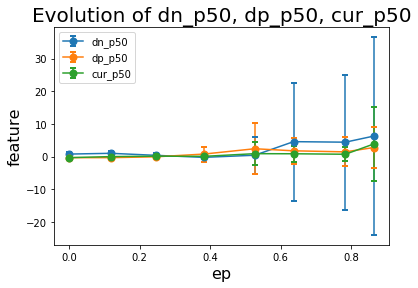

[[0.00000000e+00 0.00000000e+00 4.52714682e-01]
 [1.00000000e+00 0.00000000e+00 2.05628991e-01]
 [2.00000000e+00 0.00000000e+00 5.68234682e-01]
 ...
 [8.72000000e+02 1.00000000e+00 8.59634399e-01]
 [8.73000000e+02 1.00000000e+00 5.94542027e-01]
 [8.74000000e+02 1.00000000e+00 6.54125154e-01]]
Train: [3499, 0.13554333556886156, 0.8265381312653156] 
Test: [875, 0.1747669765756422, 0.7171842781770402]


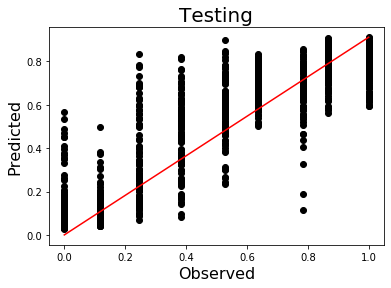

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


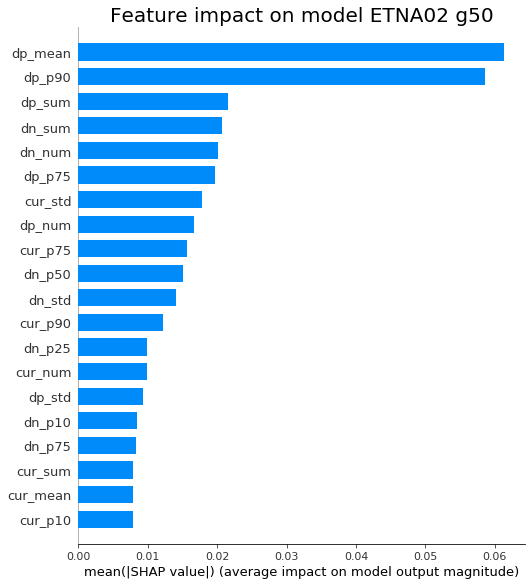

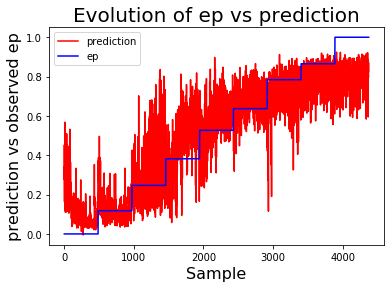

Current experiment: strains_curr_MONZ04_g50.txt, Completion: 33%


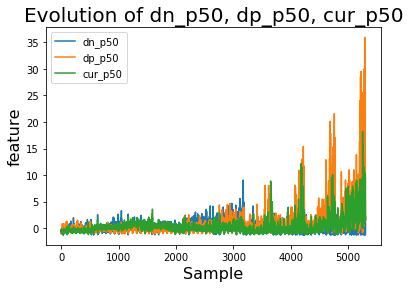

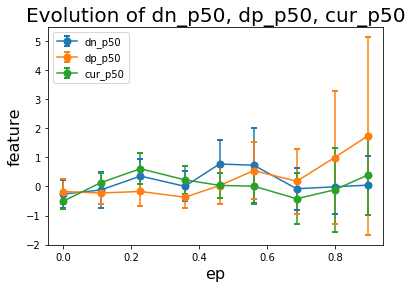

[[0.00000000e+00 0.00000000e+00 1.23678863e-01]
 [1.00000000e+00 0.00000000e+00 3.38160336e-01]
 [2.00000000e+00 0.00000000e+00 2.82788694e-01]
 ...
 [1.05800000e+03 1.00000000e+00 9.33317721e-01]
 [1.05900000e+03 1.00000000e+00 8.59571517e-01]
 [1.06000000e+03 1.00000000e+00 9.34513927e-01]]
Train: [4242, 0.1686819238603073, 0.7221325755835484] 
Test: [1061, 0.23758503179722146, 0.4606593016509951]


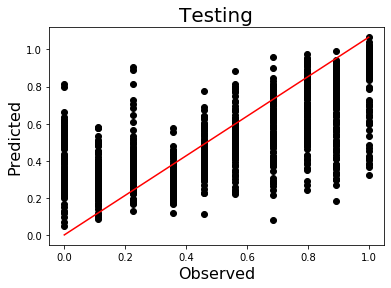

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


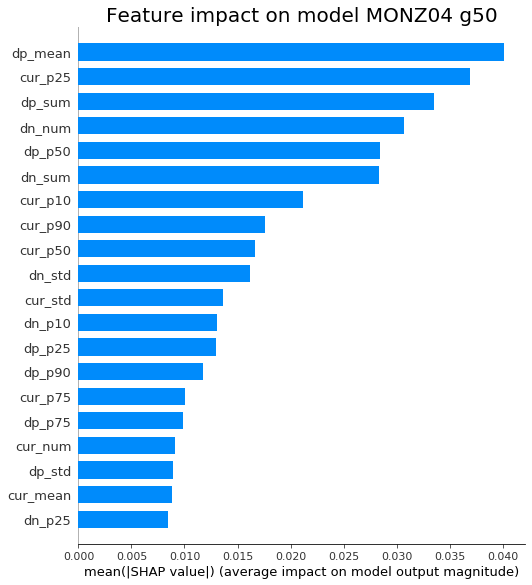

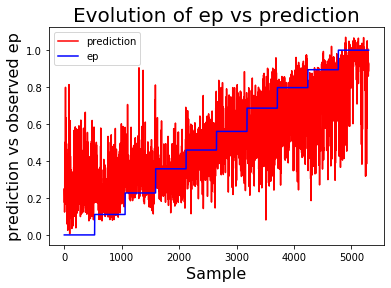

Current experiment: strains_curr_MONZ05_g50.txt, Completion: 40%


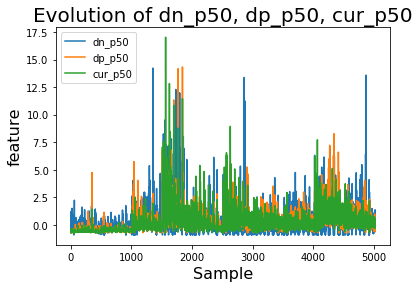

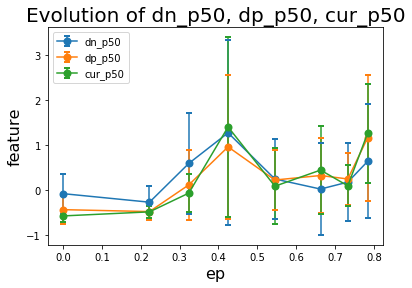

[[0.00000000e+00 0.00000000e+00 1.65459782e-01]
 [1.00000000e+00 0.00000000e+00 3.13421965e-01]
 [2.00000000e+00 0.00000000e+00 2.98847407e-01]
 ...
 [1.00200000e+03 1.00000000e+00 6.02633715e-01]
 [1.00300000e+03 1.00000000e+00 6.67255580e-01]
 [1.00400000e+03 1.00000000e+00 7.27159679e-01]]
Train: [4017, 0.15362198701795204, 0.7029990465986317] 
Test: [1005, 0.1942118159493454, 0.5129974648777389]


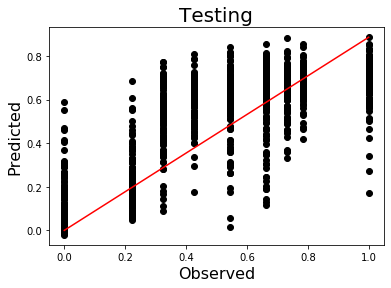

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


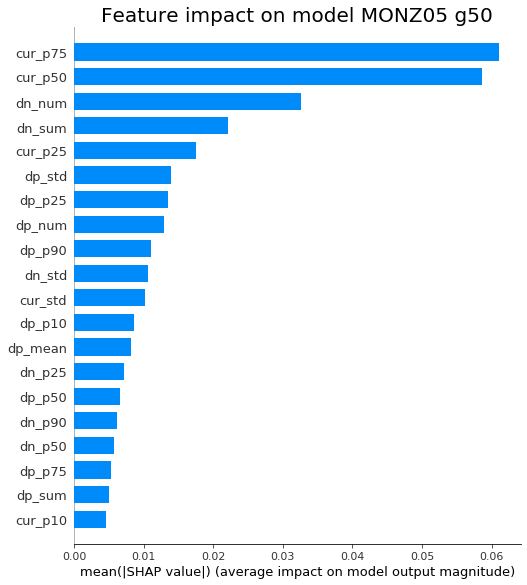

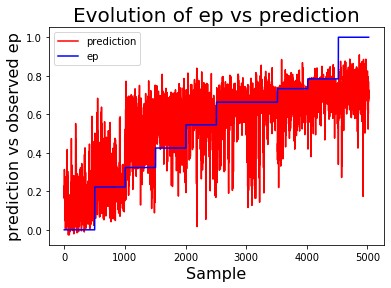

Current experiment: strains_curr_WG01_g50.txt, Completion: 46%


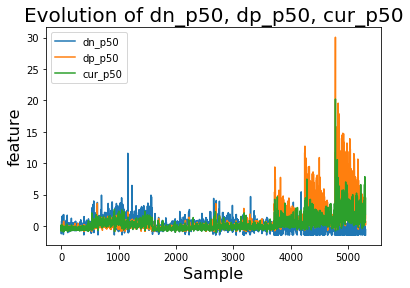

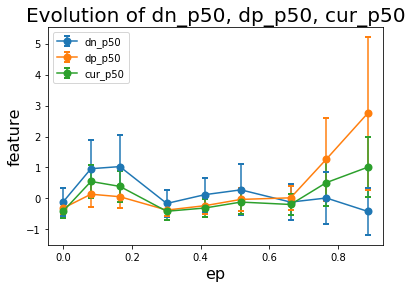

[[0.00000000e+00 0.00000000e+00 2.11569756e-01]
 [1.00000000e+00 0.00000000e+00 2.35820293e-01]
 [2.00000000e+00 0.00000000e+00 3.04428637e-01]
 ...
 [1.05900000e+03 1.00000000e+00 9.57906127e-01]
 [1.06000000e+03 1.00000000e+00 9.46705818e-01]
 [1.06100000e+03 1.00000000e+00 7.83141792e-01]]
Train: [4246, 0.16753190117045788, 0.7377580723045282] 
Test: [1062, 0.19372741921516157, 0.6609409910195156]


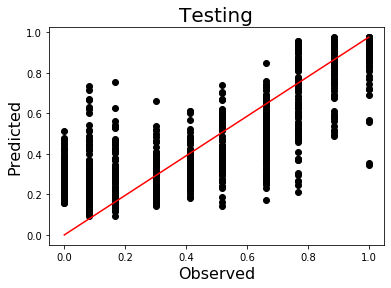

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


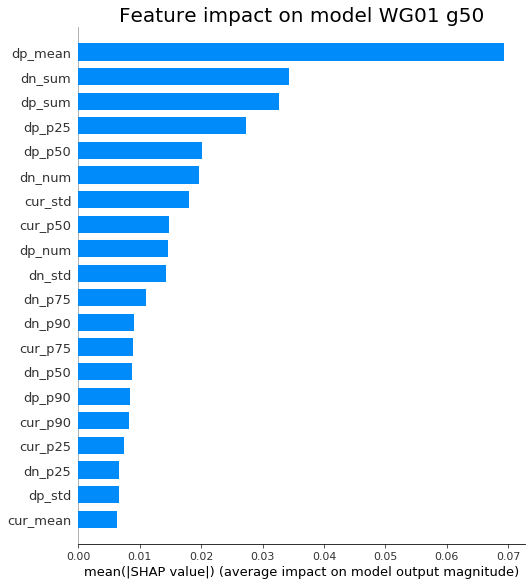

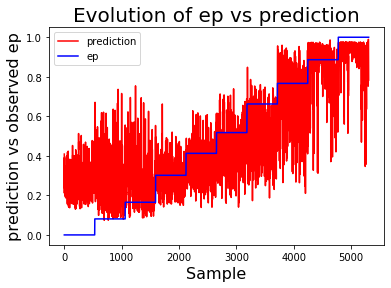

Current experiment: strains_curr_WG02_g50.txt, Completion: 53%


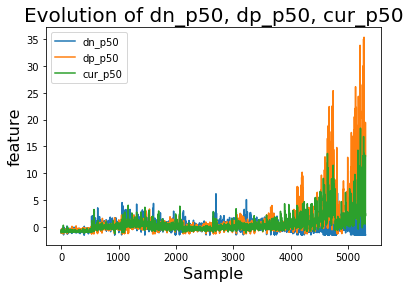

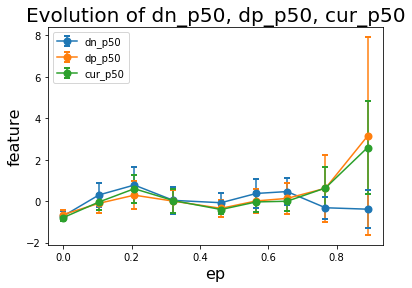

[[0.00000000e+00 0.00000000e+00 8.44359100e-02]
 [1.00000000e+00 0.00000000e+00 3.71147096e-01]
 [2.00000000e+00 0.00000000e+00 8.20377171e-02]
 ...
 [1.05900000e+03 1.00000000e+00 8.63560200e-01]
 [1.06000000e+03 1.00000000e+00 9.47038293e-01]
 [1.06100000e+03 1.00000000e+00 9.41115618e-01]]
Train: [4246, 0.14536667143424264, 0.795099077775929] 
Test: [1062, 0.21106477082067143, 0.5574987856494616]


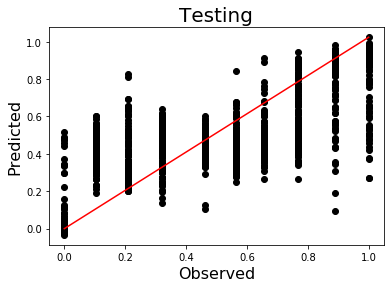

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


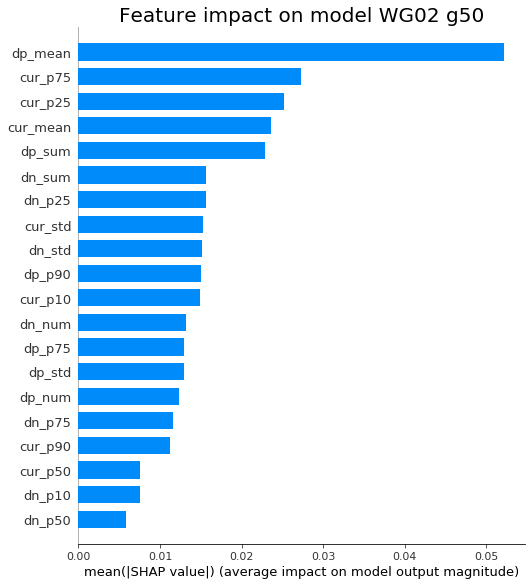

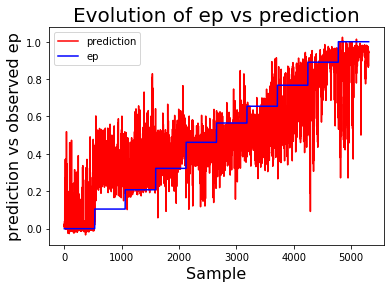

Current experiment: strains_curr_WG04_g50.txt, Completion: 60%


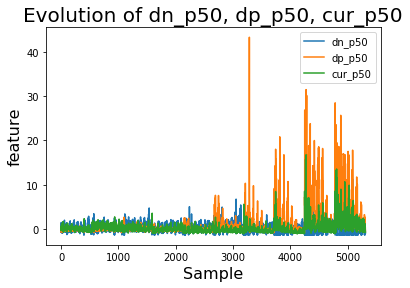

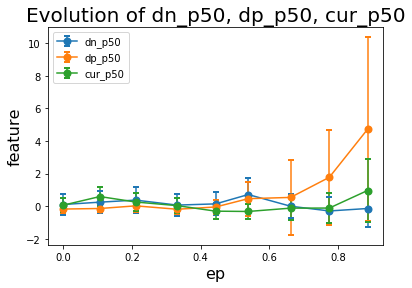

[[0.00000000e+00 0.00000000e+00 1.70327216e-01]
 [1.00000000e+00 0.00000000e+00 4.02093947e-01]
 [2.00000000e+00 0.00000000e+00 4.13104743e-01]
 ...
 [1.05900000e+03 1.00000000e+00 4.93535072e-01]
 [1.06000000e+03 1.00000000e+00 4.29688036e-01]
 [1.06100000e+03 1.00000000e+00 3.75606835e-01]]
Train: [4245, 0.14034869383467236, 0.8075849446933391] 
Test: [1062, 0.19738582765341223, 0.6172301761244887]


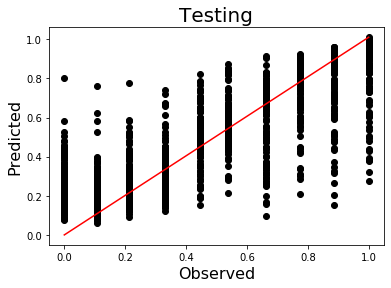

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


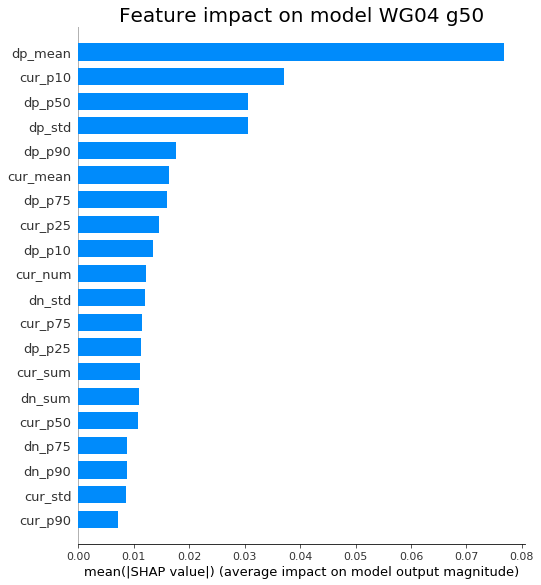

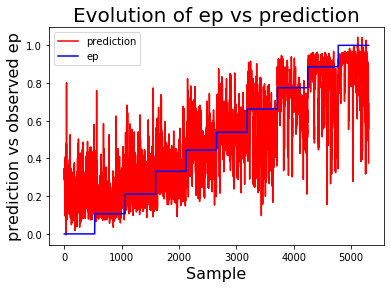

Current experiment: strains_curr_GRS02_g50.txt, Completion: 66%


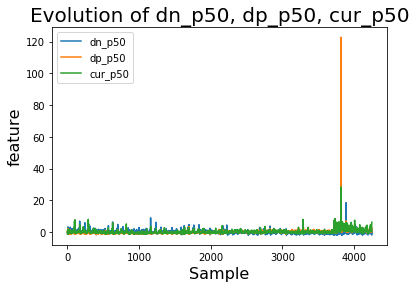

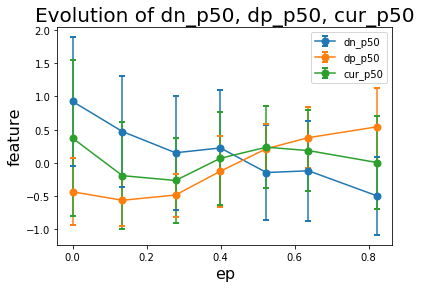

[[0.00000000e+00 0.00000000e+00 6.38971090e-01]
 [1.00000000e+00 0.00000000e+00 4.62815076e-01]
 [2.00000000e+00 0.00000000e+00 1.35564923e-01]
 ...
 [8.47000000e+02 1.00000000e+00 5.53787112e-01]
 [8.48000000e+02 1.00000000e+00 9.34894919e-01]
 [8.49000000e+02 1.00000000e+00 9.16337013e-01]]
Train: [3398, 0.13288468460968747, 0.8235634739150091] 
Test: [850, 0.16718046662879568, 0.7380651301954231]


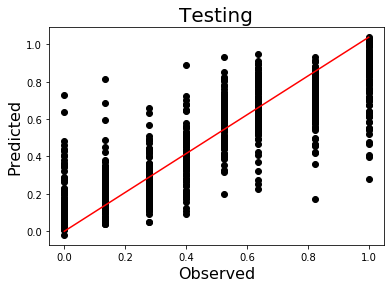

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


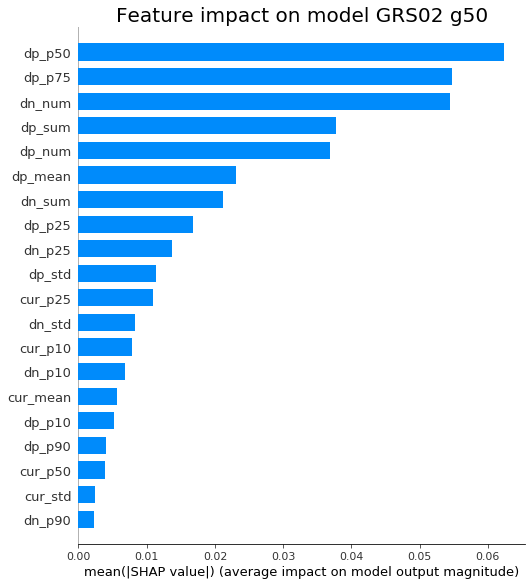

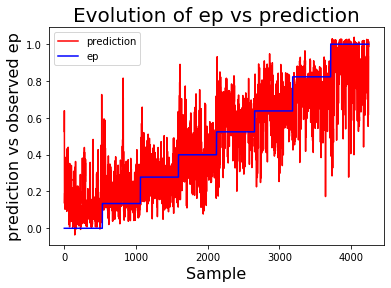

Current experiment: strains_curr_GRS03_g50.txt, Completion: 73%


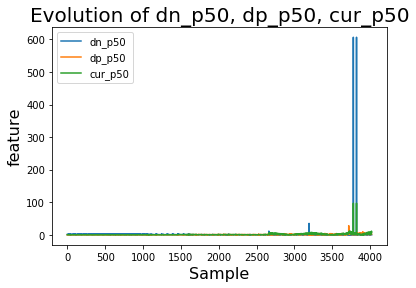

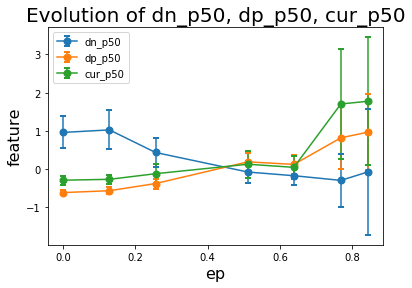

[[0.00000000e+00 0.00000000e+00 8.10033679e-02]
 [1.00000000e+00 0.00000000e+00 4.40532565e-02]
 [2.00000000e+00 0.00000000e+00 1.50954932e-01]
 ...
 [8.02000000e+02 1.00000000e+00 8.45452428e-01]
 [8.03000000e+02 1.00000000e+00 9.45726752e-01]
 [8.04000000e+02 1.00000000e+00 8.85253549e-01]]
Train: [3217, 0.07043643187259266, 0.952490496836299] 
Test: [805, 0.08224223962886348, 0.9384437813509982]


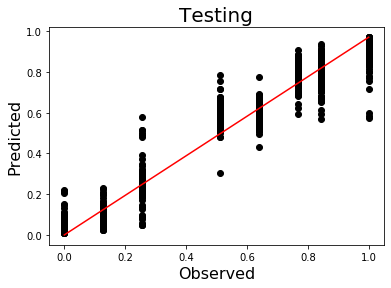

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


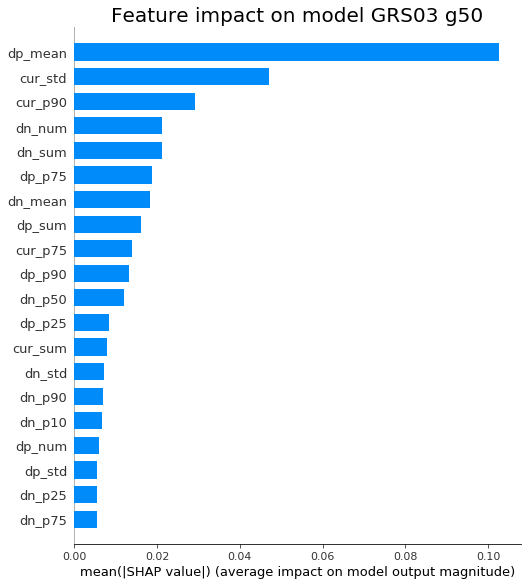

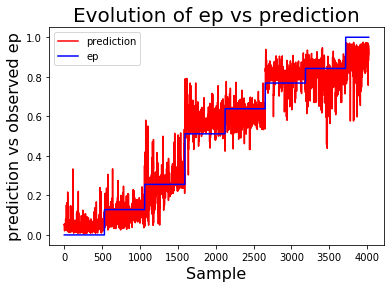

Current experiment: strains_curr_ANS02_g50.txt, Completion: 80%


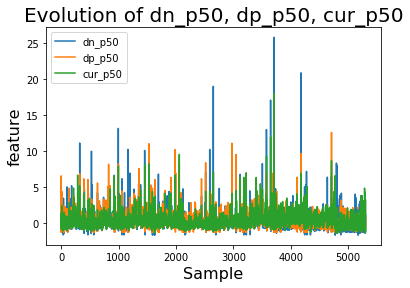

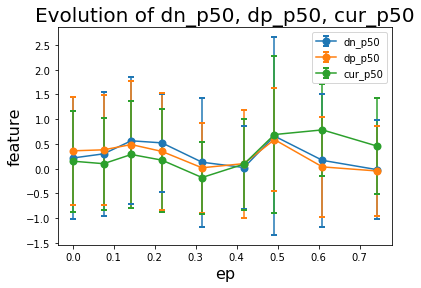

[[0.00000000e+00 0.00000000e+00 3.19216788e-01]
 [1.00000000e+00 0.00000000e+00 3.64577949e-01]
 [2.00000000e+00 0.00000000e+00 3.11877787e-01]
 ...
 [1.05900000e+03 1.00000000e+00 3.26916456e-01]
 [1.06000000e+03 1.00000000e+00 7.91524768e-01]
 [1.06100000e+03 1.00000000e+00 4.96996611e-01]]
Train: [4244, 0.19522322513862628, 0.5789964058216913] 
Test: [1062, 0.25787292443060955, 0.25083553866921404]


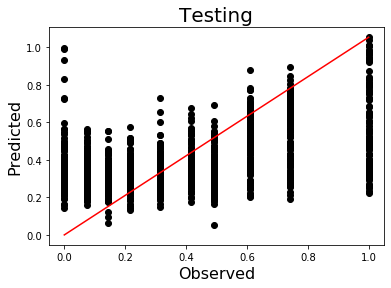

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


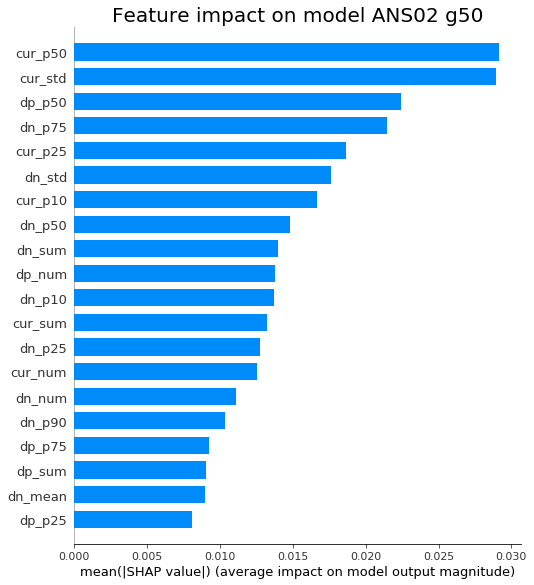

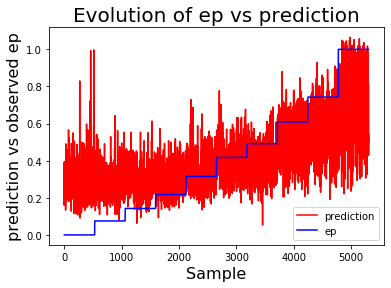

Current experiment: strains_curr_ANS03_g50.txt, Completion: 86%


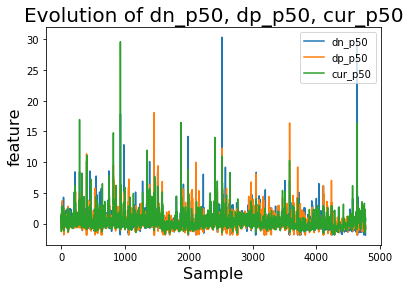

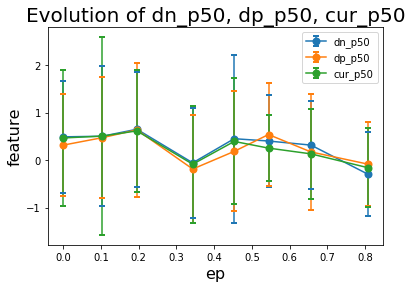

[[0.00000000e+00 0.00000000e+00 3.36695194e-01]
 [1.00000000e+00 0.00000000e+00 5.56542814e-01]
 [2.00000000e+00 0.00000000e+00 3.59635502e-01]
 ...
 [9.52000000e+02 1.00000000e+00 5.80685318e-01]
 [9.53000000e+02 1.00000000e+00 6.43961787e-01]
 [9.54000000e+02 1.00000000e+00 5.03868282e-01]]
Train: [3816, 0.21315931340977948, 0.5366756579881821] 
Test: [955, 0.24954746307303027, 0.350200851863987]


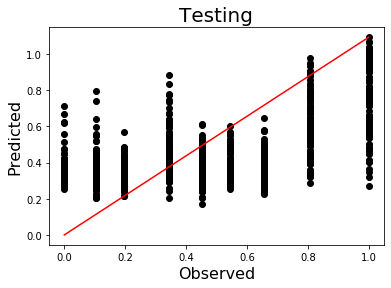

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


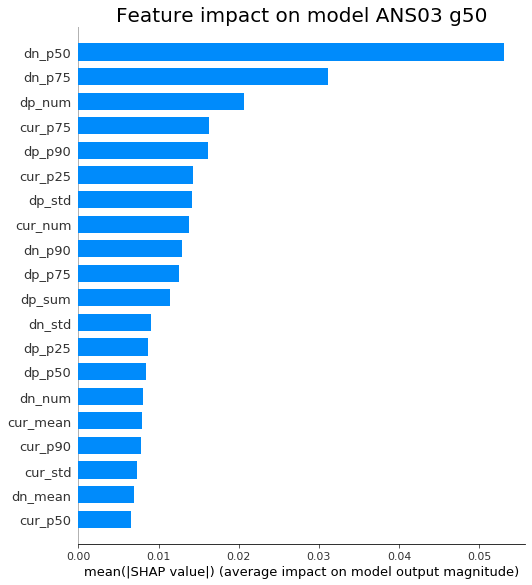

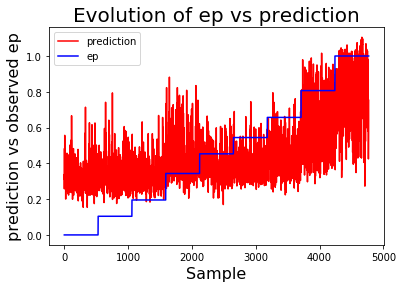

Current experiment: strains_curr_ANS04_g50.txt, Completion: 93%


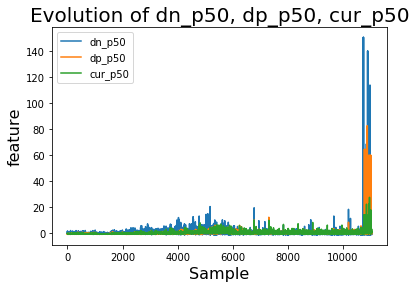

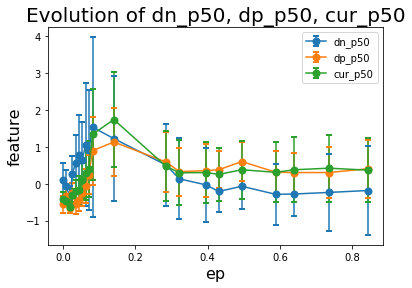

[[0.00000000e+00 0.00000000e+00 4.40107584e-02]
 [1.00000000e+00 0.00000000e+00 3.89609337e-02]
 [2.00000000e+00 0.00000000e+00 2.27990448e-02]
 ...
 [2.20600000e+03 1.00000000e+00 4.78434503e-01]
 [2.20700000e+03 1.00000000e+00 6.94607973e-01]
 [2.20800000e+03 1.00000000e+00 4.35236096e-01]]
Train: [8834, 0.13128120917670102, 0.8066663738532623] 
Test: [2209, 0.18551593586486922, 0.6060596188237409]


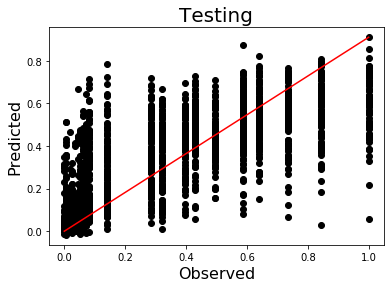

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


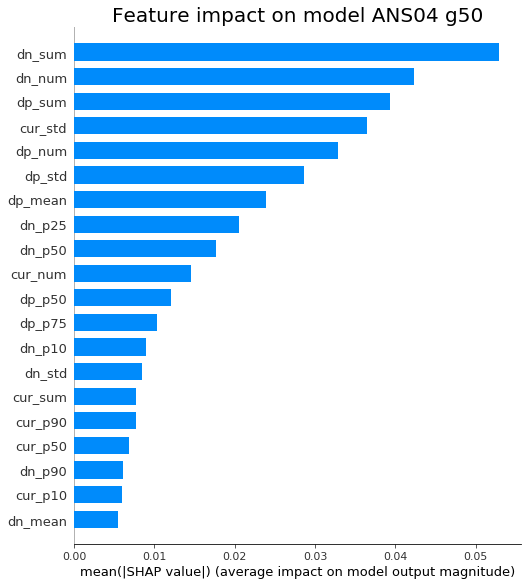

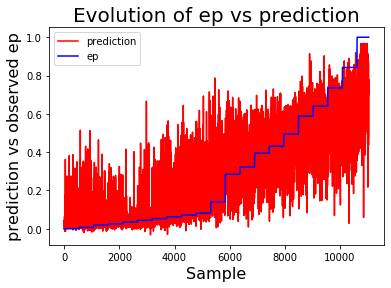

Current experiment: strains_curr_ANS05_g50.txt, Completion: 100%


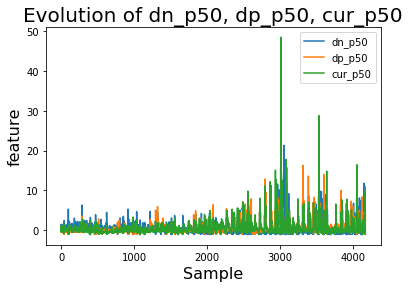

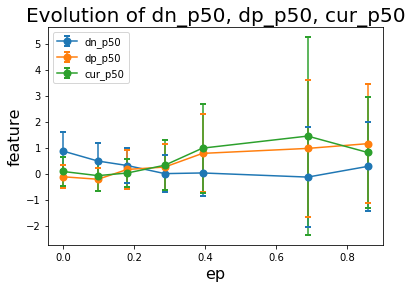

[[0.00000000e+00 0.00000000e+00 2.35902399e-01]
 [1.00000000e+00 0.00000000e+00 2.22833455e-01]
 [2.00000000e+00 0.00000000e+00 4.09565508e-01]
 ...
 [8.32000000e+02 1.00000000e+00 7.45566785e-01]
 [8.33000000e+02 1.00000000e+00 8.31577301e-01]
 [8.34000000e+02 1.00000000e+00 3.10127378e-01]]
Train: [3340, 0.18819889497975534, 0.703195107730487] 
Test: [835, 0.2397314722662576, 0.5167589277698458]


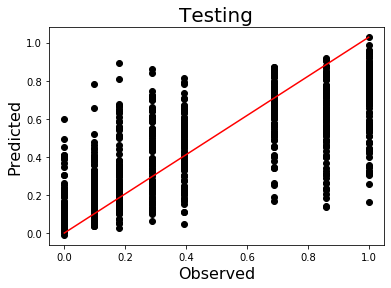

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


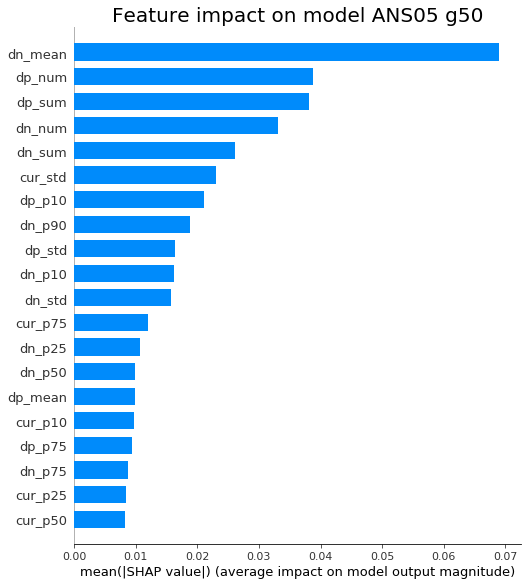

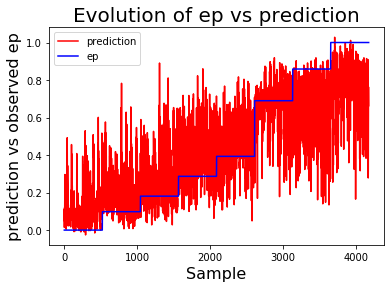

In [23]:
print(f"\nTraining xgb models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

for i in range(num_exps):
    
    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.99, verbose=True)
    dataframe.to_csv(scaled_data_folder+'scaled_'+filenames[i],sep=' ', index=False)
    
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    plot_data_time_evolutions(dataframe, [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'Sample','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
    plot_data_errorbars(dataframe, dataframe['ep'], [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'ep','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist

    train_time = time.time()
    model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time
    
    with open(saved_models[i], 'wb') as file:
        pickle.dump(model,file)
    
    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)
    
    save_test_data(model, features, target, df_test, result_folder, "TEST_prediction_xgb_"+experiments[i]+"_g"+rad+"0.txt")

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])
    
    shap_vals = represent_model_results(model,df_train,features,target,'Feature impact on model '+experiments[i]+ ' g'+rad+'0', result_folder+'Shap_vals_xgb_'+experiments[i]+'_g'+rad+'0')
    #print(shap_vals)
    
    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"
    
    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+model_preds[i],pred_vs_observed)
    
#print(type(score_str))
#np.savetxt(result_folder+model_scores,score_str)
save_data_by_name(score_str,result_folder,model_scores)

### Transfer Learning
Now we can finally review the performance of the models we trained on the other datasets.


Performing transfer learning, reprinting r2 scores 
and plotting score martix:

15 15
Train score on experiment FBL01: r2 = 0.8033649544233312
Test score: r2 = 0.6942109082774076
training data: FBL02, testing data: GRS03, score: 0.8156410934916322


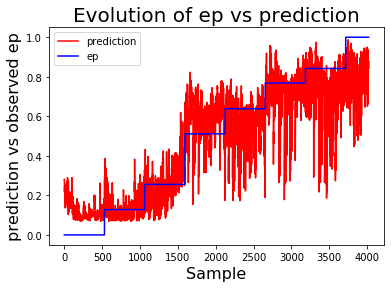

Train score on experiment FBL02: r2 = 0.8639332309757037
Test score: r2 = 0.8004424366900676
training data: ETNA01, testing data: ANS04, score: -0.8346225832059617


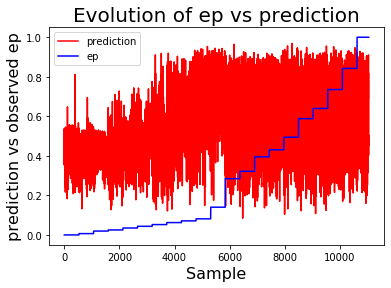

Train score on experiment ETNA01: r2 = 0.8502004385685078
Test score: r2 = 0.7440248132291682
training data: ETNA02, testing data: GRS03, score: 0.8135771470417548


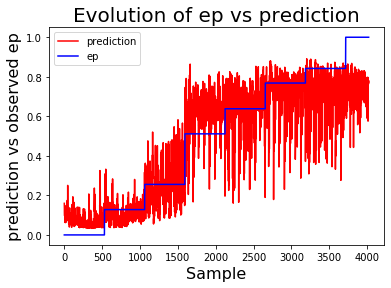

training data: ETNA02, testing data: ANS02, score: -0.790221321377724


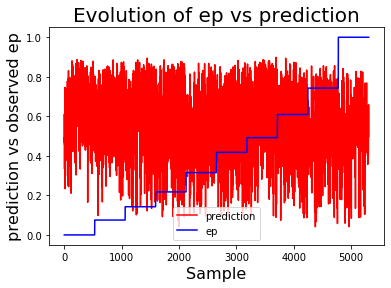

Train score on experiment ETNA02: r2 = 0.8265381312653156
Test score: r2 = 0.7171842781770402
Train score on experiment MONZ04: r2 = 0.7221325755835484
Test score: r2 = 0.4606593016509951
Train score on experiment MONZ05: r2 = 0.7029990465986317
Test score: r2 = 0.5129974648777389
Train score on experiment WG01: r2 = 0.7377580723045282
Test score: r2 = 0.6609409910195156
Train score on experiment WG02: r2 = 0.795099077775929
Test score: r2 = 0.5574987856494616
Train score on experiment WG04: r2 = 0.8075849446933391
Test score: r2 = 0.6172301761244887
training data: GRS02, testing data: GRS03, score: 0.7876963579993062


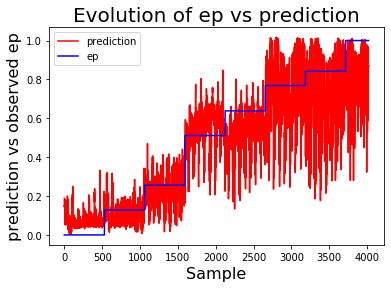

training data: GRS02, testing data: ANS02, score: -0.8487347273653338


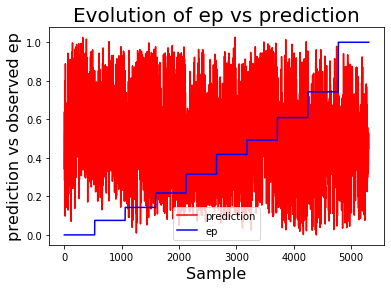

Train score on experiment GRS02: r2 = 0.8235634739150091
Test score: r2 = 0.7380651301954231
Train score on experiment GRS03: r2 = 0.952490496836299
Test score: r2 = 0.9384437813509982
Train score on experiment ANS02: r2 = 0.5789964058216913
Test score: r2 = 0.25083553866921404
Train score on experiment ANS03: r2 = 0.5366756579881821
Test score: r2 = 0.350200851863987
training data: ANS04, testing data: MONZ05, score: -1.007136807908275


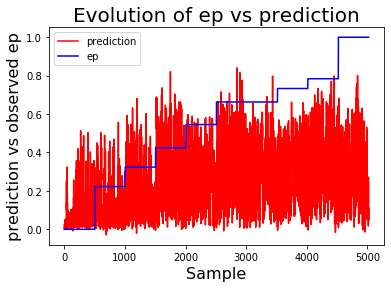

Train score on experiment ANS04: r2 = 0.8066663738532623
Test score: r2 = 0.6060596188237409
Train score on experiment ANS05: r2 = 0.703195107730487
Test score: r2 = 0.5167589277698458


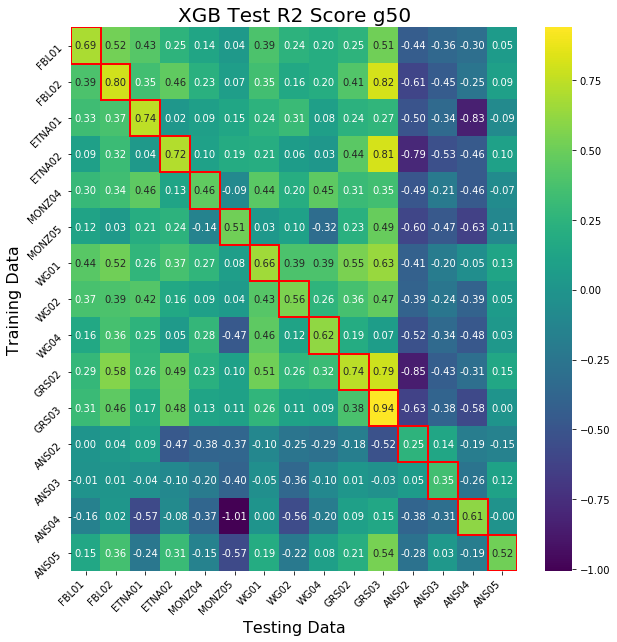

In [24]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")

print(len(models),num_exps)
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]
            
            if abs(r2_test_matrix[i,j]) > 0.7:
                print(f"training data: {experiments[i]}, testing data: {experiments[j]}, score: {r2_test_matrix[i,j]}")
                plot_feature_vs_prediction(dataframe, 'ep', models[i].predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])

    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["XGB Test R2 Score g50", "Testing Data", "Training Data"], savename='../Figures1/strain_single_transfer_xgb_g50')
np.savetxt(result_folder+model_score_matrix,r2_test_matrix)

In [ ]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")

print(len(models),num_exps)
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
            df_train, df_test = train_test_split(dataframe, test_size=0.8)
            
            xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
                
            with open(saved_models[i], 'rb') as file:
                pkld_model = pickle.load(file)
            
            retrained_model = xgb_model.fit(df_test[features],df_test[target],xgb_model = saved_models[i])
            
            scores = test_regression_model(retrained_model, features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]
            
    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["XGB Test R2 Score g50", "Testing Data", "Training Data"], savename='../Figures1/strain_single_transfer_xgb_g50')
np.savetxt(result_folder+model_score_matrix,r2_test_matrix)

### Combined Dataset Transfer Learning
When testing the models on different datasets generalization is important. With this in mind we investigate the possibility of the models being more generalizable when trained on multiple datasets.

#### Randomly selected datasets
First we train a model using randomly selected datasets.


Combining datasets to evaluate effect on model and performance

Datasets used for training: ['strains_curr_FBL01_g50.txt', 'strains_curr_MONZ04_g50.txt', 'strains_curr_GRS03_g50.txt']
Train: [10858, 0.13390986541619057, 0.8231531482120245] 
Test: [2715, 0.1898406489139265, 0.6535930898769968]


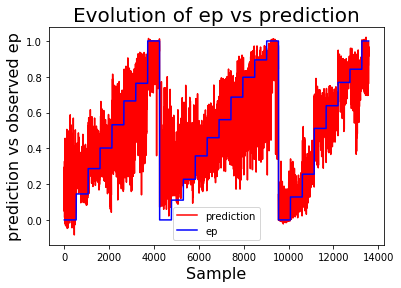


Datasets used for training: ['strains_curr_FBL02_g50.txt', 'strains_curr_ETNA02_g50.txt', 'strains_curr_GRS02_g50.txt']
Train: [11143, 0.1271608608716281, 0.8413922235032253] 
Test: [2786, 0.16924607822299134, 0.7184156107504874]


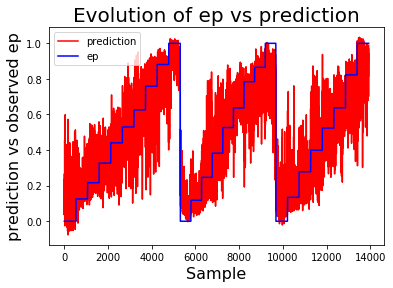


Datasets used for training: ['strains_curr_ETNA01_g50.txt', 'strains_curr_MONZ05_g50.txt', 'strains_curr_WG02_g50.txt']
Train: [12150, 0.14405538372241863, 0.78140195807138] 
Test: [3038, 0.19603070492701388, 0.5952412108681655]


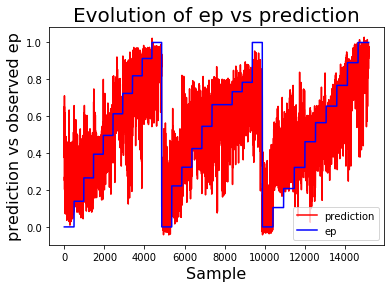


Datasets used for training: ['strains_curr_ANS04_g50.txt', 'strains_curr_WG01_g50.txt', 'strains_curr_WG04_g50.txt']
Train: [17326, 0.15652281549284933, 0.7695153291250386] 
Test: [4332, 0.2038819020042641, 0.6098050738907235]


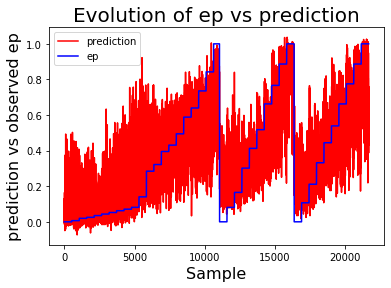

In [25]:
print("\nCombining datasets to evaluate effect on model and performance")
filelist = [ [ filenames[0], filenames[4], filenames[10] ] , [ filenames[1], filenames[3], filenames[9] ], [ filenames[2], filenames[5], filenames[7] ], [ filenames[13], filenames[6], filenames[8] ] ] #THIS IS INEFFICIENT, BUT SUFFICIENT FOR TESTING
experimentlist = [ [ experiments[0], experiments[4], experiments[10] ] , [ experiments[1], experiments[3], experiments[9] ], [ experiments[2], experiments[5], experiments[7] ], [ experiments[13], experiments[6], experiments[8] ] ]
num_train_sets = len(filelist)

#fbl-etna
#monz-wg
#grs-ans

multi_models = []

r2_multi_test_matrix = np.zeros((num_train_sets,num_exps))

for i in range(num_train_sets):
    print(f"\nDatasets used for training: {filelist[i]}")
    dataframe, timespan = get_experiment_data(folder, filelist[i], features, target)

    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    multi_model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    multi_models.append(multi_model)

    train_scores = test_regression_model(multi_model,features,target,df_train)
    test_scores = test_regression_model(multi_model,features,target,df_test)

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_feature_vs_prediction(dataframe, 'ep', multi_model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    for j in range(num_exps):
        dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
        scores = test_regression_model(multi_models[i], features, target,dataframe)
        r2_multi_test_matrix[i,j] = scores[-1]

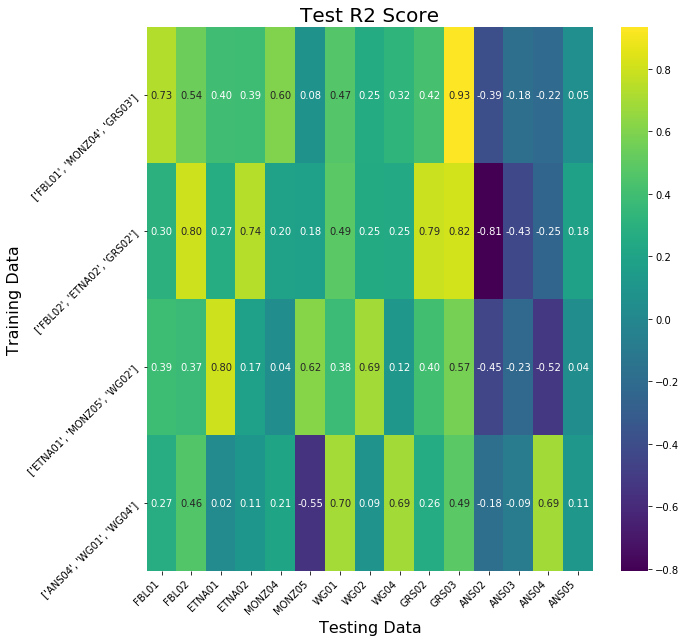

In [26]:
plot_sns_score_matrix(r2_multi_test_matrix,experimentlist,experiments,["Test R2 Score", "Testing Data", "Training Data"], diagonal=False)

When observing the models generated by a random selection of multiple datasets we see what looks to be a large amount of variance in the model prediction. A possible hypothesis is that some of the features within the datasets are less compatible. This motivates the use of datasets with better compatibility. In the next section we will instead be reviewing performance on preselected datasets. 

### The test using preselected datasets
The sets are chosen with the knowlege that fbl-etna, monz-wg and grs-ans fit well together.


Combining datasets to evaluate effect on model and performance

Datasets used for training: ['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt']
Train: [7644, 0.1279140737906087, 0.8311599997465424] 
Test: [1911, 0.16584600131679367, 0.7259316228220198]


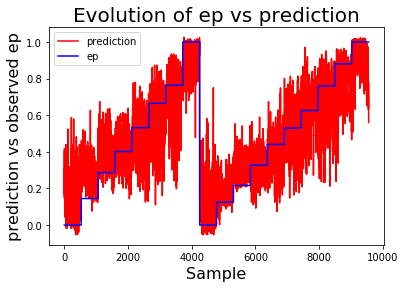


Datasets used for training: ['strains_curr_FBL01_g50.txt', 'strains_curr_ETNA01_g50.txt']
Train: [7284, 0.13435772118158348, 0.8202442561383461] 
Test: [1822, 0.17247863969143565, 0.7034805632959982]


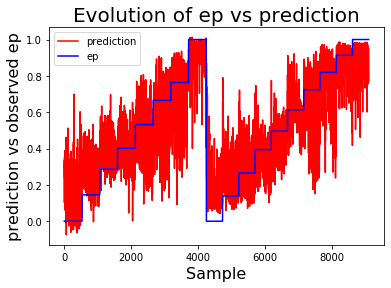


Datasets used for training: ['strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt']
Train: [8260, 0.15587258009383223, 0.7336660284235608] 
Test: [2065, 0.22280106293262408, 0.4625970329082112]


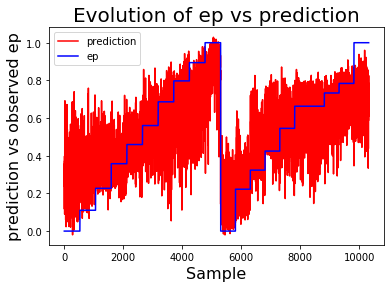


Datasets used for training: ['strains_curr_MONZ04_g50.txt', 'strains_curr_WG01_g50.txt']
Train: [8488, 0.14962088289760397, 0.7883682938668839] 
Test: [2123, 0.21917071728836995, 0.5405023726687828]


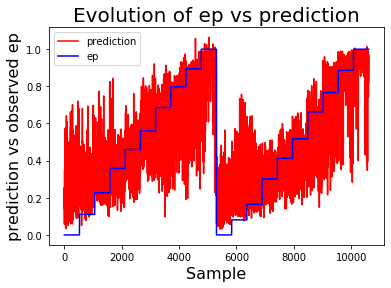


Datasets used for training: ['strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']
Train: [6616, 0.09855835733259682, 0.9057529443056038] 
Test: [1654, 0.13490217973785348, 0.8269158748480177]


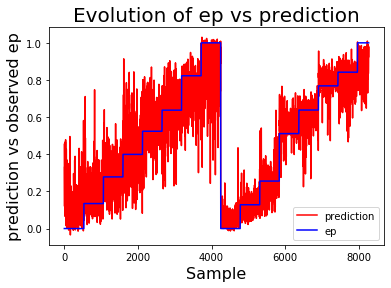


Datasets used for training: ['strains_curr_GRS03_g50.txt', 'strains_curr_ANS04_g50.txt']
Train: [12052, 0.12174877296281894, 0.853746419297786] 
Test: [3013, 0.1699148136055632, 0.7101021307487055]


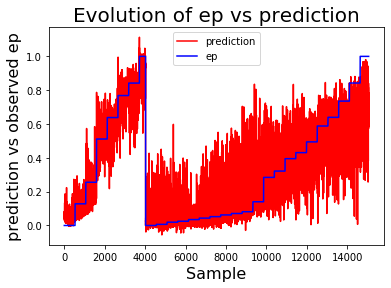


Datasets used for training: ['strains_curr_GRS03_g50.txt', 'strains_curr_ANS02_g50.txt']
Train: [7462, 0.13926630668955245, 0.8028890750952744] 
Test: [1866, 0.20702809178312095, 0.5724360021603141]


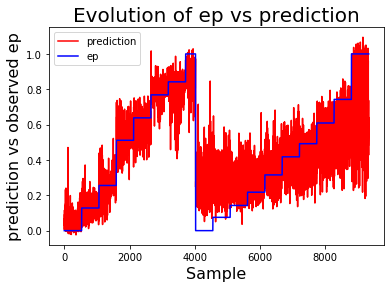


Datasets used for training: ['strains_curr_GRS03_g50.txt', 'strains_curr_ANS03_g50.txt']
Train: [7034, 0.13854425711643642, 0.8122078505803636] 
Test: [1759, 0.1942311643931528, 0.6188174759157219]


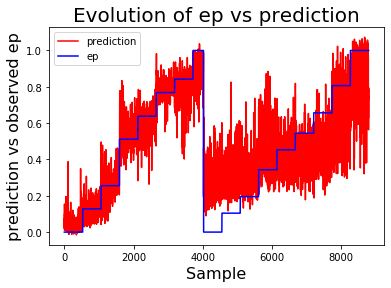


Datasets used for training: ['strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt']
Train: [19267, 0.1544191952255495, 0.770940122607126] 
Test: [4817, 0.20550308855615237, 0.5888088238770639]


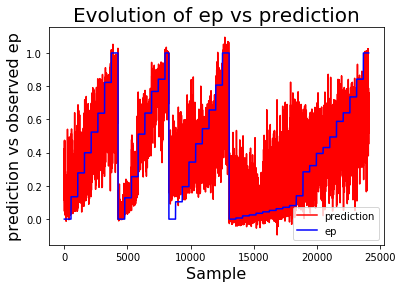

In [27]:
print("\nCombining datasets to evaluate effect on model and performance")
#['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
filelist = [ [ filenames[0], filenames[1] ] , [ filenames[0], filenames[2] ], [ filenames[4], filenames[5] ], [ filenames[4], filenames[6] ], [ filenames[9], filenames[10] ], [ filenames[10], filenames[13] ], [ filenames[10], filenames[11] ], [ filenames[10], filenames[12] ], [ filenames[9], filenames[10], filenames[12], filenames[13] ] ] #THIS IS INEFFICIENT, BUT SUFFICIENT FOR TESTING
experimentlist = [ [ experiments[0], experiments[1] ], [ experiments[0], experiments[2] ], [ experiments[4], experiments[5] ], [ experiments[4], experiments[6] ], [ experiments[9], experiments[10] ], [ experiments[10], experiments[13] ], [ experiments[10], experiments[11] ], [ experiments[10], experiments[12] ], [ experiments[9], experiments[10], experiments[12], experiments[13] ] ]
num_train_sets = len(filelist)

saved_multi_models = ['../stored_models/model_xgb_'+''.join(experiments)+'_g'+rad+'0.pkl' for experiments in experimentlist] #filenames for saved models using pickle
multi_model_score_matrix = 'multi_dataset_transfer_learning_score_matrix_xgb_g'+rad+'0.txt'

#fbl-etna
#monz-wg
#grs-ans

multi_models = []

r2_multi_test_matrix = np.zeros((num_train_sets,num_exps))

for i in range(num_train_sets):
    print(f"\nDatasets used for training: {filelist[i]}")
    dataframe, timespan = get_experiment_data(folder, filelist[i], features, target)

    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    multi_model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    multi_models.append(multi_model)
    
    with open(saved_multi_models[i], 'wb') as file:
        pickle.dump(multi_model,file)

    train_scores = test_regression_model(multi_model,features,target,df_train)
    test_scores = test_regression_model(multi_model,features,target,df_test)

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_feature_vs_prediction(dataframe, 'ep', multi_model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    for j in range(num_exps):
        dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
        scores = test_regression_model(multi_models[i], features, target,dataframe)
        r2_multi_test_matrix[i,j] = scores[-1]

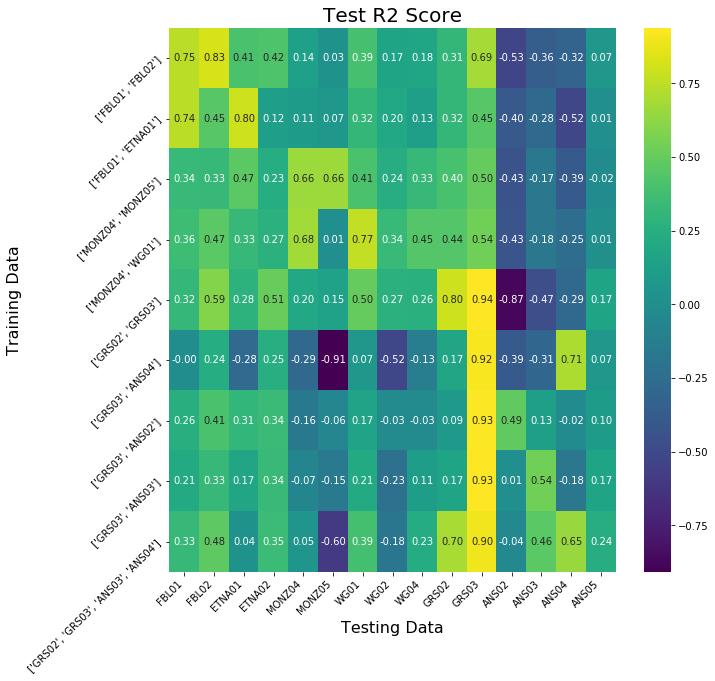

In [28]:
plot_sns_score_matrix(r2_multi_test_matrix,experimentlist,experiments,["Test R2 Score", "Testing Data", "Training Data"], savename='../Figures1/strain_multi_transfer_xgb_g50', diagonal=False)
np.savetxt(result_folder+multi_model_score_matrix,r2_multi_test_matrix)

Interestingly we observe the performance of the ANS datasets improve compared to when only trained on itself. A possible initial hypothesis is that the dataset is noisy and need another dataset to make a generalizable model. Similarly the FBL datasets improve test performance above the single dataset models. The expected perfomance increase on datasets not yet seen by the model is however not as prominent (even if it is slight on some sets).

### Training a SVM model on the low resolution dataset


Training svm models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g50.txt, Completion: 6%
Train: [3398, 0.10465612633973613, 0.8884000666619221] 
Test: [850, 0.24882124911593637, 0.31801069026958073]


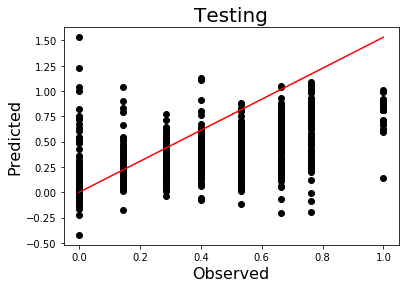

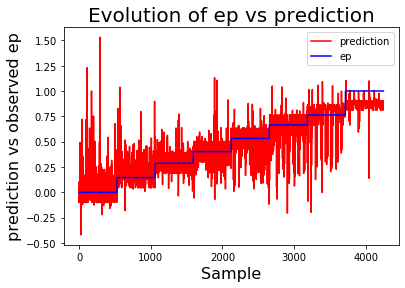

Current experiment: strains_curr_FBL02_g50.txt, Completion: 13%
Train: [4245, 0.10116266330423872, 0.8956724775042685] 
Test: [1062, 0.18686387592380257, 0.6460500786507856]


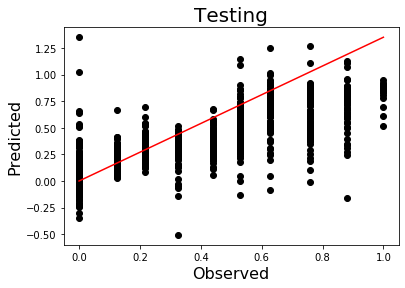

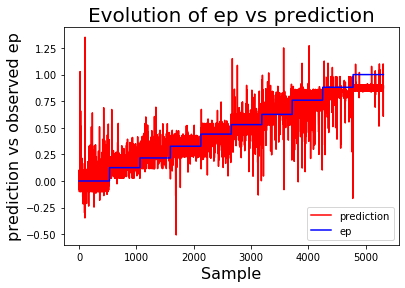

Current experiment: strains_curr_ETNA01_g50.txt, Completion: 20%
Train: [3886, 0.11454071037113298, 0.871410913442141] 
Test: [972, 0.20252809191753948, 0.5946547172091485]


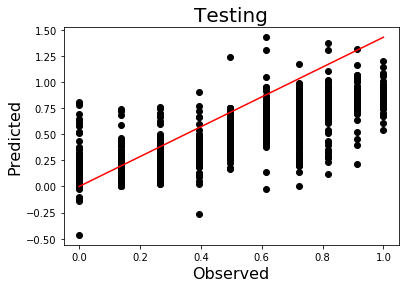

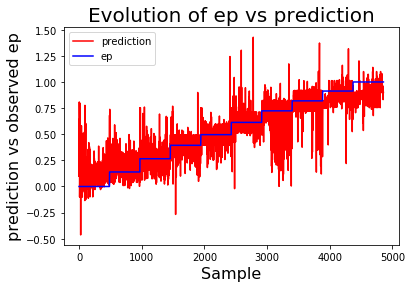

Current experiment: strains_curr_ETNA02_g50.txt, Completion: 26%
Train: [3499, 0.11434175719526185, 0.8766326289171603] 
Test: [875, 0.21102815214375695, 0.5867532899041623]


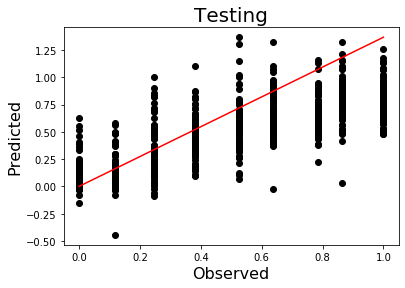

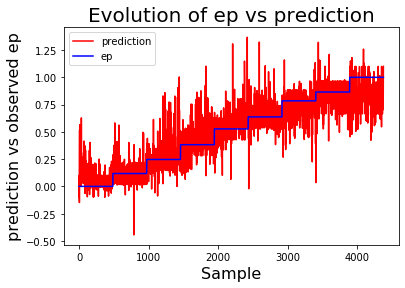

Current experiment: strains_curr_MONZ04_g50.txt, Completion: 33%
Train: [4242, 0.1329411077022706, 0.828360304481369] 
Test: [1061, 0.30654556459021703, 0.08187278859838054]


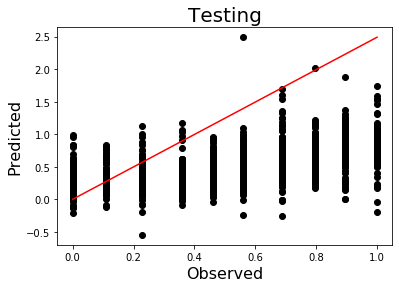

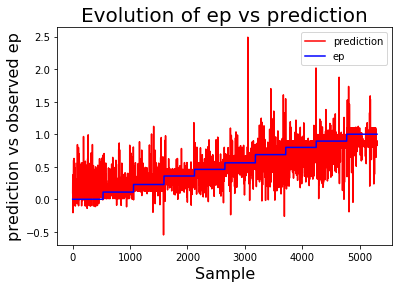

Current experiment: strains_curr_MONZ05_g50.txt, Completion: 40%
Train: [4017, 0.11318370077977159, 0.8355829762087857] 
Test: [1005, 0.24283782615533642, 0.29382536636674206]


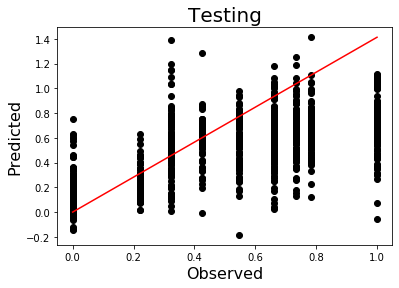

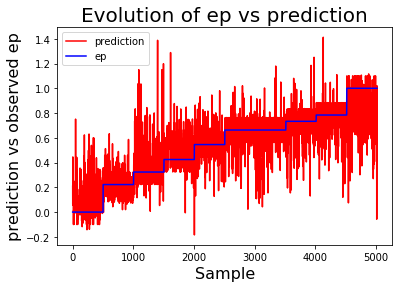

Current experiment: strains_curr_WG01_g50.txt, Completion: 46%
Train: [4246, 0.11931515822885927, 0.8686622881541335] 
Test: [1062, 0.24998786601900236, 0.4057231790618139]


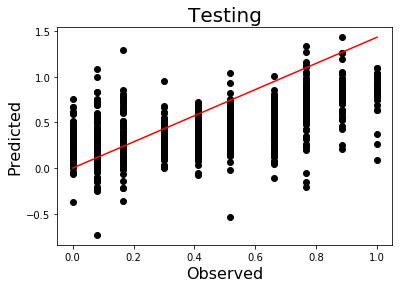

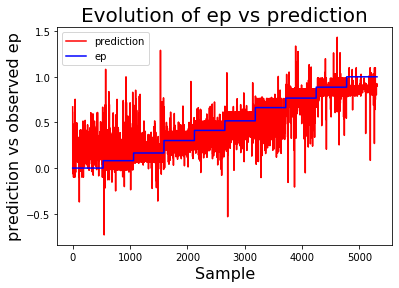

Current experiment: strains_curr_WG02_g50.txt, Completion: 53%
Train: [4246, 0.11249275302507208, 0.8769991775319839] 
Test: [1062, 0.261639728928286, 0.3265269602720017]


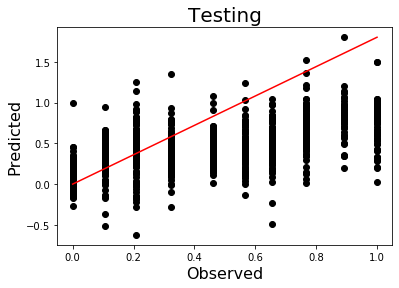

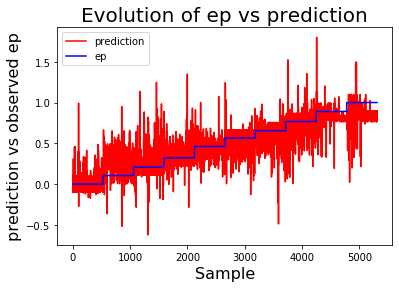

Current experiment: strains_curr_WG04_g50.txt, Completion: 60%
Train: [4245, 0.12229353588932382, 0.8543281102014577] 
Test: [1062, 0.25871786759359106, 0.3338070241895671]


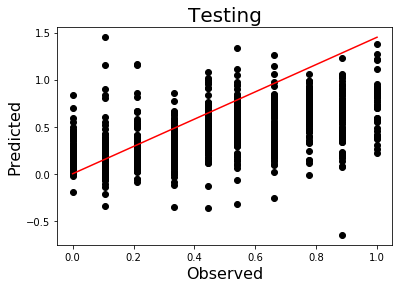

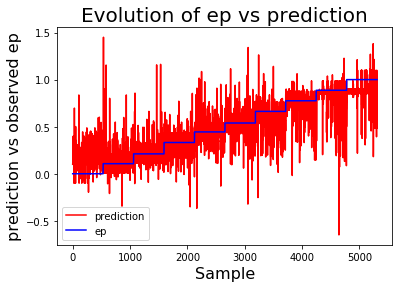

Current experiment: strains_curr_GRS02_g50.txt, Completion: 66%
Train: [3398, 0.08548362234019229, 0.9281441493832399] 
Test: [850, 0.22008807564153704, 0.5172039180439454]


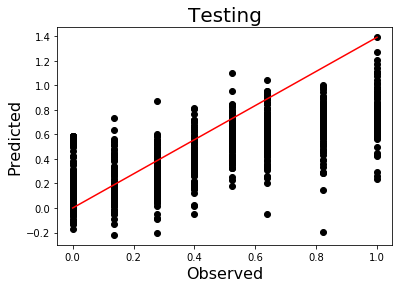

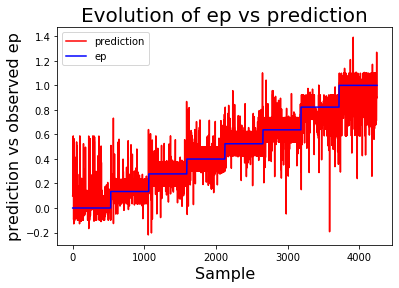

Current experiment: strains_curr_GRS03_g50.txt, Completion: 73%
Train: [3217, 0.07065494924782523, 0.952726712584035] 
Test: [805, 0.09817709936509077, 0.908288147346474]


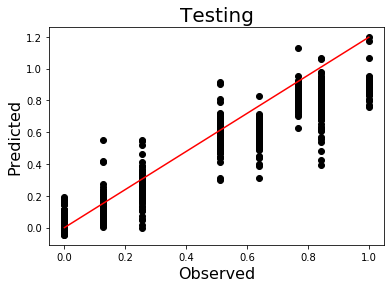

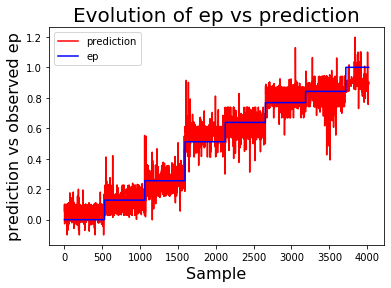

Current experiment: strains_curr_ANS02_g50.txt, Completion: 80%
Train: [4244, 0.12579036608850022, 0.8280109658764309] 
Test: [1062, 0.34567612866556996, -0.44375820302412183]


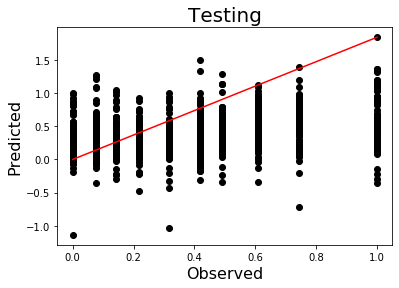

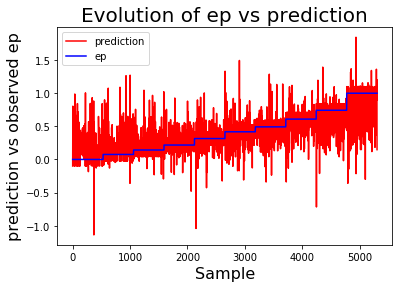

Current experiment: strains_curr_ANS03_g50.txt, Completion: 86%
Train: [3816, 0.11115730263599999, 0.8732358426679048] 
Test: [955, 0.3409024873286837, -0.18047062540095204]


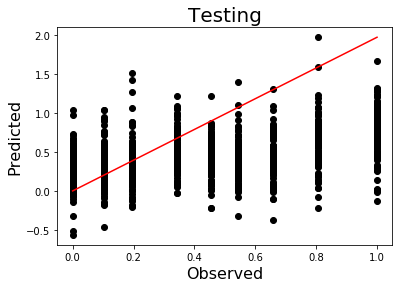

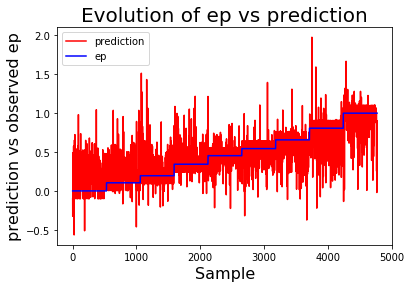

Current experiment: strains_curr_ANS04_g50.txt, Completion: 93%
Train: [8834, 0.10877349933952943, 0.867030665195764] 
Test: [2209, 0.24100509348628488, 0.34008651558111536]


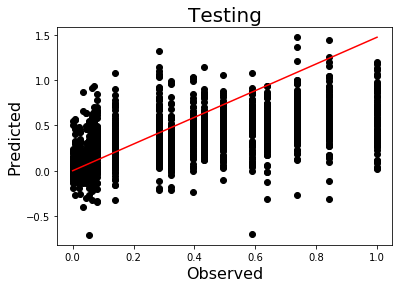

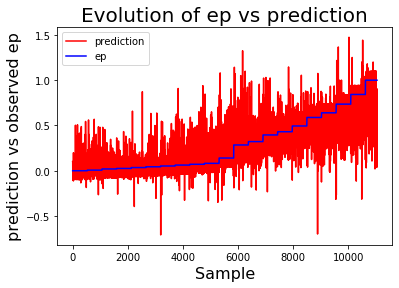

Current experiment: strains_curr_ANS05_g50.txt, Completion: 100%
Train: [3340, 0.12439426434497083, 0.8713140000382589] 
Test: [835, 0.32220002000912035, 0.10057929267187926]


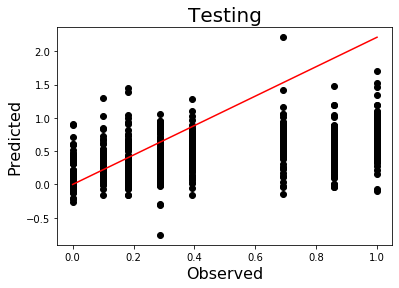

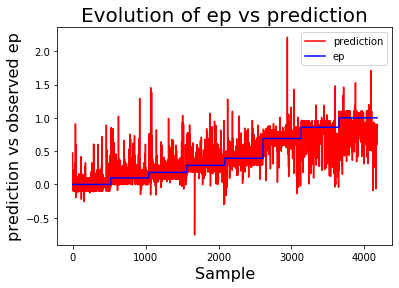

In [29]:
print(f"\nTraining svm models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

svm_model_scores = 'model_scores_svm_g'+rad+'0.txt'
score_str = "experiment mse r2 time\n"
models = []

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], features, target)
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    train_time = time.time()
    model = train_svm_model(df_train, target, features) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time
    
    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"
    
save_data_by_name(score_str,result_folder,svm_model_scores)


Performing transfer learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.8884000666619221
Test score: r2 = 0.31801069026958073
Train score on experiment FBL02: r2 = 0.8956724775042685
Test score: r2 = 0.6460500786507856
Train score on experiment ETNA01: r2 = 0.871410913442141
Test score: r2 = 0.5946547172091485
Train score on experiment ETNA02: r2 = 0.8766326289171603
Test score: r2 = 0.5867532899041623
Train score on experiment MONZ04: r2 = 0.828360304481369
Test score: r2 = 0.08187278859838054
Train score on experiment MONZ05: r2 = 0.8355829762087857
Test score: r2 = 0.29382536636674206
Train score on experiment WG01: r2 = 0.8686622881541335
Test score: r2 = 0.4057231790618139
Train score on experiment WG02: r2 = 0.8769991775319839
Test score: r2 = 0.3265269602720017
Train score on experiment WG04: r2 = 0.8543281102014577
Test score: r2 = 0.3338070241895671
Train score on experiment GRS02: r2 = 0.9281441493832399
Test score: r2 = 0.5172

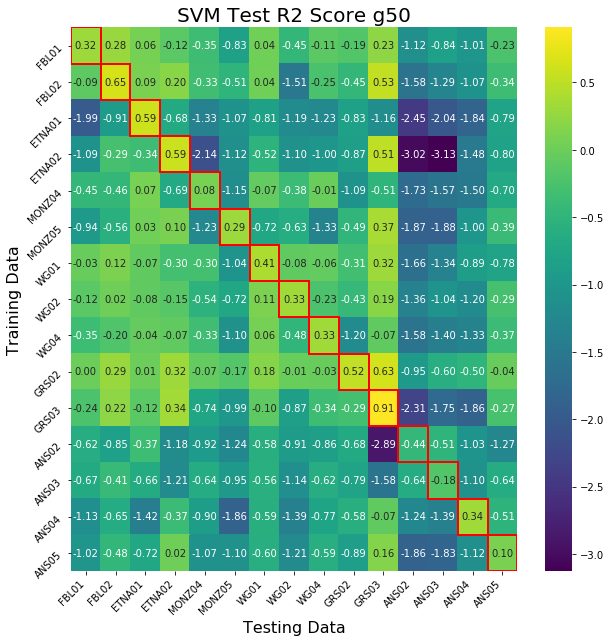

In [30]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["SVM Test R2 Score g50", "Testing Data", "Training Data"], savename='../Figures1/strain_single_transfer_svm_g50')

The support vector machines performes fairly well on some of the datasets. However that is testing on the same dataset, when it comes to transfer learning our results seem to be far worse than xgboost. In addition xgboost seems to have a more consistent performance on the different datasets. For now it seems like SVM generalises poorly which results in poor test scores even when the train scores were very good.

### Neural Networks on low resolution dataset


Training nn models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g50.txt, Completion: 6%
[[0.00000000e+00 0.00000000e+00 3.12518149e-01]
 [1.00000000e+00 0.00000000e+00 3.26375634e-01]
 [2.00000000e+00 0.00000000e+00 3.48676146e-01]
 ...
 [8.47000000e+02 1.00000000e+00 9.98183666e-01]
 [8.48000000e+02 1.00000000e+00 9.35553032e-01]
 [8.49000000e+02 1.00000000e+00 1.01603960e+00]]
Train: [3398, 0.17301998239539312, 0.6922495762839507] 
Test: [850, 0.183107086009971, 0.6444310525320522]


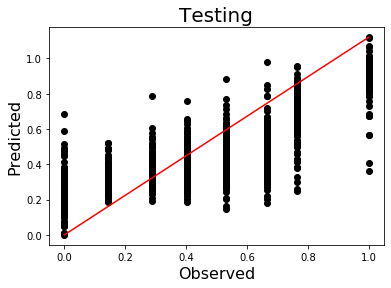

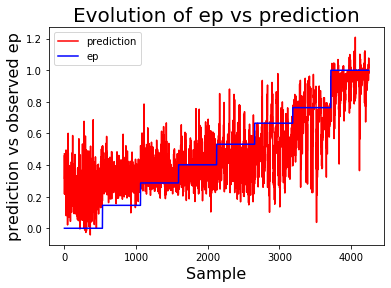

Current experiment: strains_curr_FBL02_g50.txt, Completion: 13%
[[0.00000000e+00 0.00000000e+00 3.52552963e-01]
 [1.00000000e+00 0.00000000e+00 1.95326604e-01]
 [2.00000000e+00 0.00000000e+00 1.30197412e-01]
 ...
 [1.05900000e+03 1.00000000e+00 1.00403347e+00]
 [1.06000000e+03 1.00000000e+00 6.01433910e-01]
 [1.06100000e+03 1.00000000e+00 5.87976155e-01]]
Train: [4245, 0.1522974604657509, 0.7638639394548675] 
Test: [1062, 0.16223781571066892, 0.7314895199530185]


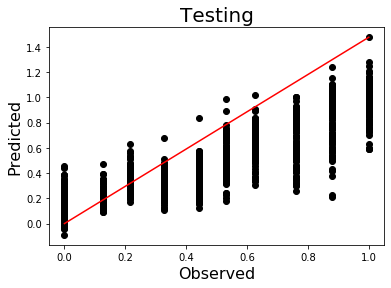

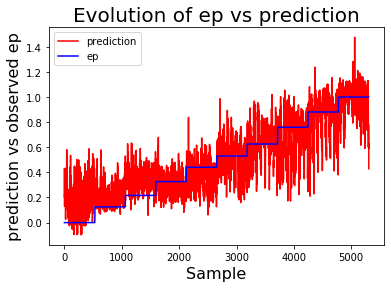

Current experiment: strains_curr_ETNA01_g50.txt, Completion: 20%
[[0.00000000e+00 0.00000000e+00 3.05404966e-01]
 [1.00000000e+00 0.00000000e+00 2.00069141e-01]
 [2.00000000e+00 0.00000000e+00 1.89333366e-01]
 ...
 [9.69000000e+02 1.00000000e+00 9.45607607e-01]
 [9.70000000e+02 1.00000000e+00 9.13053428e-01]
 [9.71000000e+02 1.00000000e+00 9.87962186e-01]]
Train: [3886, 0.14607568442643096, 0.7924185075960696] 
Test: [972, 0.1650635470692698, 0.7218696106517806]


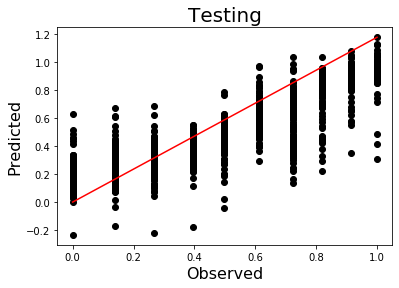

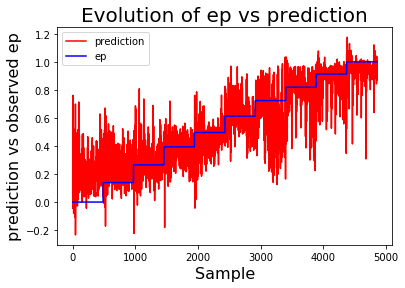

Current experiment: strains_curr_ETNA02_g50.txt, Completion: 26%
[[0.00000000e+00 0.00000000e+00 3.68626543e-01]
 [1.00000000e+00 0.00000000e+00 5.38183529e-01]
 [2.00000000e+00 0.00000000e+00 3.32868118e-01]
 ...
 [8.72000000e+02 1.00000000e+00 8.41470247e-01]
 [8.73000000e+02 1.00000000e+00 7.50923929e-01]
 [8.74000000e+02 1.00000000e+00 8.63321057e-01]]
Train: [3499, 0.17146990759860534, 0.7236461857921587] 
Test: [875, 0.1929208638966223, 0.649238084396119]


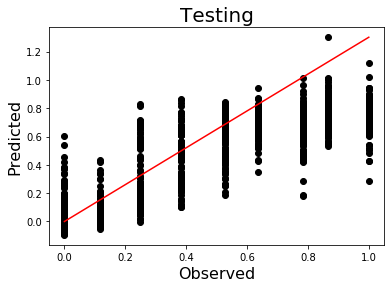

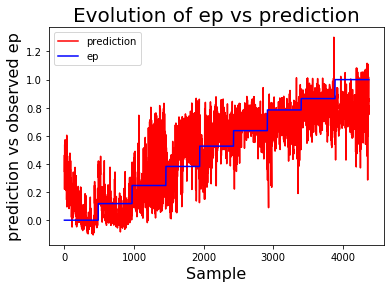

Current experiment: strains_curr_MONZ04_g50.txt, Completion: 33%
[[0.00000000e+00 0.00000000e+00 2.02521089e-01]
 [1.00000000e+00 0.00000000e+00 3.40739350e-01]
 [2.00000000e+00 0.00000000e+00 3.42017396e-01]
 ...
 [1.05800000e+03 1.00000000e+00 9.73976943e-01]
 [1.05900000e+03 1.00000000e+00 1.15929934e+00]
 [1.06000000e+03 1.00000000e+00 1.05198632e+00]]
Train: [4242, 0.22083619072682795, 0.5237153264745953] 
Test: [1061, 0.23186711263129092, 0.48641289896608275]


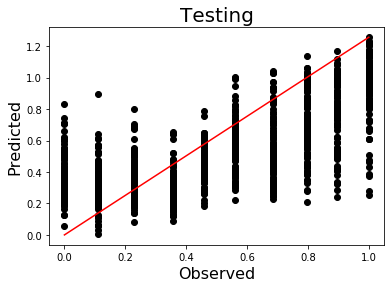

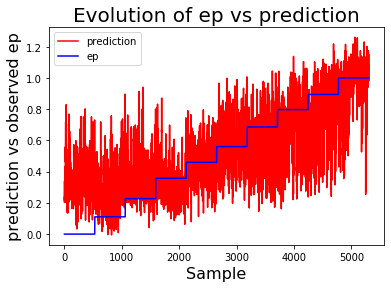

Current experiment: strains_curr_MONZ05_g50.txt, Completion: 40%
[[0.00000000e+00 0.00000000e+00 3.18728812e-01]
 [1.00000000e+00 0.00000000e+00 3.86833220e-01]
 [2.00000000e+00 0.00000000e+00 2.17086789e-01]
 ...
 [1.00200000e+03 1.00000000e+00 6.39942546e-01]
 [1.00300000e+03 1.00000000e+00 6.02876327e-01]
 [1.00400000e+03 1.00000000e+00 6.55601591e-01]]
Train: [4017, 0.18542901327027594, 0.563064228269625] 
Test: [1005, 0.1973319905791109, 0.516374186919276]


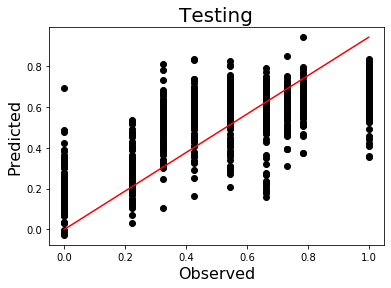

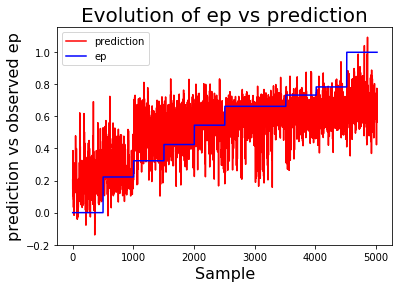

Current experiment: strains_curr_WG01_g50.txt, Completion: 46%
[[0.00000000e+00 0.00000000e+00 3.99565674e-01]
 [1.00000000e+00 0.00000000e+00 3.49846140e-01]
 [2.00000000e+00 0.00000000e+00 3.36444498e-01]
 ...
 [1.05900000e+03 1.00000000e+00 8.90411006e-01]
 [1.06000000e+03 1.00000000e+00 9.69906607e-01]
 [1.06100000e+03 1.00000000e+00 9.57571448e-01]]
Train: [4246, 0.17538972890802484, 0.7168346318129996] 
Test: [1062, 0.19772599173243433, 0.6248352581150232]


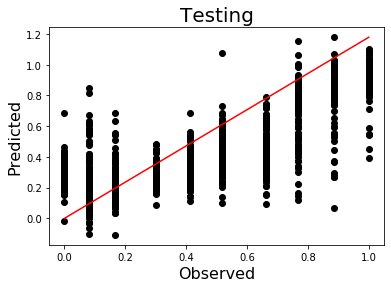

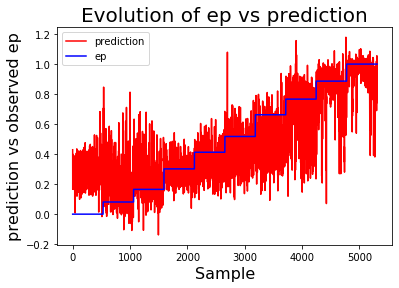

Current experiment: strains_curr_WG02_g50.txt, Completion: 53%
[[ 0.00000000e+00  0.00000000e+00 -9.97971259e-02]
 [ 1.00000000e+00  0.00000000e+00  1.79174859e-01]
 [ 2.00000000e+00  0.00000000e+00  4.12218924e-01]
 ...
 [ 1.05900000e+03  1.00000000e+00  1.00785005e+00]
 [ 1.06000000e+03  1.00000000e+00  9.63079763e-01]
 [ 1.06100000e+03  1.00000000e+00  1.25029686e+00]]
Train: [4246, 0.18741869246711984, 0.657161463476429] 
Test: [1062, 0.2161832183790041, 0.5479185478599411]


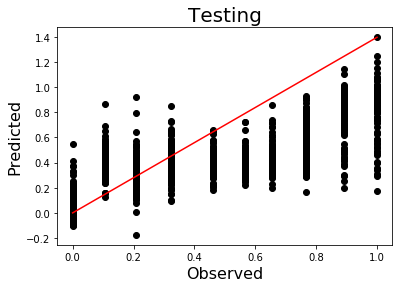

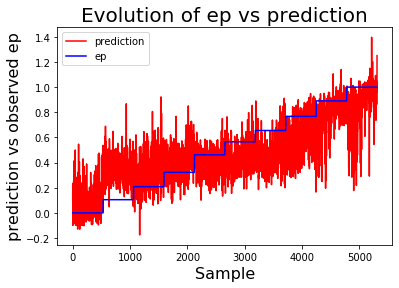

Current experiment: strains_curr_WG04_g50.txt, Completion: 60%
[[0.00000000e+00 0.00000000e+00 3.22222998e-01]
 [1.00000000e+00 0.00000000e+00 5.20129909e-01]
 [2.00000000e+00 0.00000000e+00 2.56319748e-01]
 ...
 [1.05900000e+03 1.00000000e+00 6.33279293e-01]
 [1.06000000e+03 1.00000000e+00 6.20137537e-01]
 [1.06100000e+03 1.00000000e+00 7.68073699e-01]]
Train: [4245, 0.19721803609170607, 0.621854154589162] 
Test: [1062, 0.1918738633112028, 0.6315806494912564]


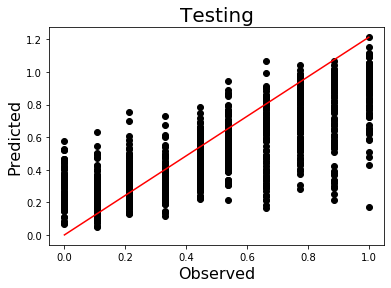

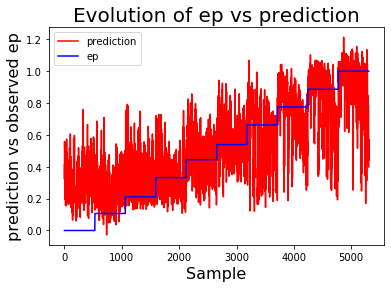

Current experiment: strains_curr_GRS02_g50.txt, Completion: 66%
[[0.00000000e+00 0.00000000e+00 4.32001312e-02]
 [1.00000000e+00 0.00000000e+00 2.59983673e-01]
 [2.00000000e+00 0.00000000e+00 8.75243055e-02]
 ...
 [8.47000000e+02 1.00000000e+00 9.16950689e-01]
 [8.48000000e+02 1.00000000e+00 5.70033931e-01]
 [8.49000000e+02 1.00000000e+00 1.05769355e+00]]
Train: [3398, 0.14910524848821297, 0.7817990163592555] 
Test: [850, 0.17610262237340277, 0.6884914630022181]


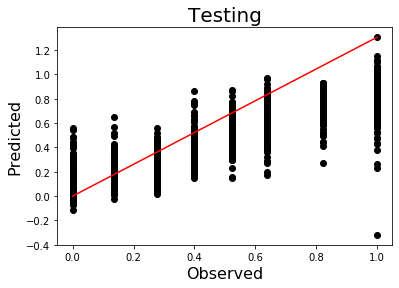

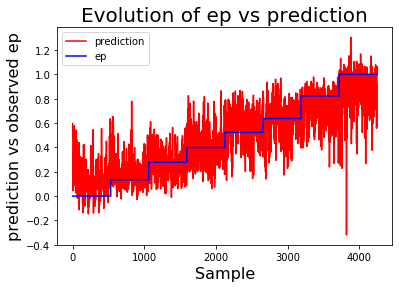

Current experiment: strains_curr_GRS03_g50.txt, Completion: 73%
[[0.00000000e+00 0.00000000e+00 1.09235428e-01]
 [1.00000000e+00 0.00000000e+00 6.21520350e-02]
 [2.00000000e+00 0.00000000e+00 8.24037354e-02]
 ...
 [8.02000000e+02 1.00000000e+00 1.04603598e+00]
 [8.03000000e+02 1.00000000e+00 9.50659406e-01]
 [8.04000000e+02 1.00000000e+00 9.95165837e-01]]
Train: [3217, 0.08406429722629977, 0.9331927836283693] 
Test: [805, 0.09760679552318473, 0.9085709895378145]


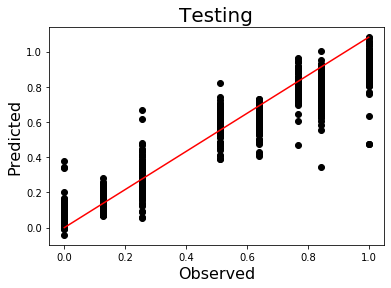

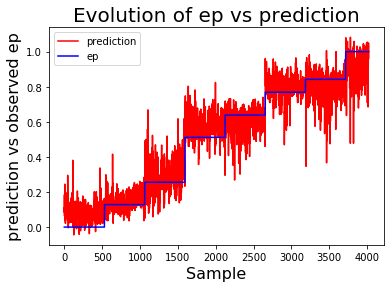

Current experiment: strains_curr_ANS02_g50.txt, Completion: 80%
[[0.00000000e+00 0.00000000e+00 2.46882618e-01]
 [1.00000000e+00 0.00000000e+00 3.20782200e-01]
 [2.00000000e+00 0.00000000e+00 1.21646177e-01]
 ...
 [1.05900000e+03 1.00000000e+00 6.70727631e-01]
 [1.06000000e+03 1.00000000e+00 6.05879814e-01]
 [1.06100000e+03 1.00000000e+00 3.02729091e-01]]
Train: [4244, 0.23824799935544072, 0.36646476067181777] 
Test: [1062, 0.2692404146925028, 0.21573275741401887]


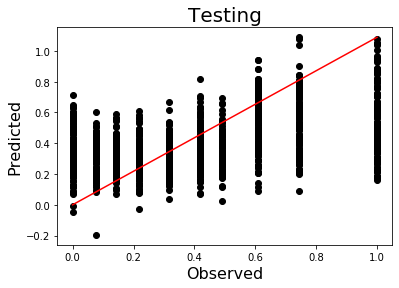

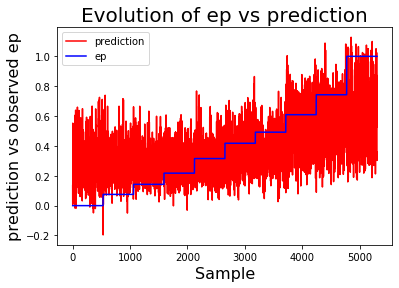

Current experiment: strains_curr_ANS03_g50.txt, Completion: 86%
[[0.00000000e+00 0.00000000e+00 2.05657050e-01]
 [1.00000000e+00 0.00000000e+00 4.21286364e-01]
 [2.00000000e+00 0.00000000e+00 2.86144979e-01]
 ...
 [9.52000000e+02 1.00000000e+00 4.55698109e-01]
 [9.53000000e+02 1.00000000e+00 2.35181295e-01]
 [9.54000000e+02 1.00000000e+00 9.86445232e-01]]
Train: [3816, 0.23234224928239874, 0.45182385193722796] 
Test: [955, 0.27061365296178447, 0.22511179926919012]


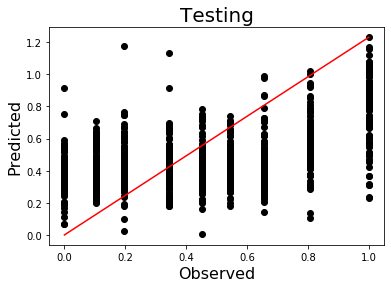

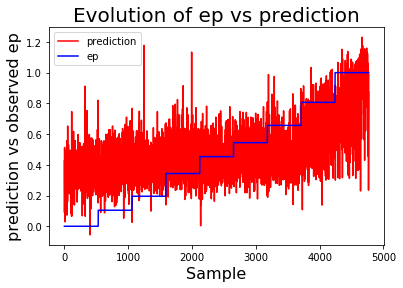

Current experiment: strains_curr_ANS04_g50.txt, Completion: 93%
[[ 0.00000000e+00  0.00000000e+00  7.50040251e-02]
 [ 1.00000000e+00  0.00000000e+00 -7.80087580e-03]
 [ 2.00000000e+00  0.00000000e+00  3.44035260e-02]
 ...
 [ 2.20600000e+03  1.00000000e+00  6.12468210e-01]
 [ 2.20700000e+03  1.00000000e+00  7.71062568e-01]
 [ 2.20800000e+03  1.00000000e+00  6.36881183e-01]]
Train: [8834, 0.1736262187192636, 0.6598363418233499] 
Test: [2209, 0.19210428517998424, 0.5874484997811675]


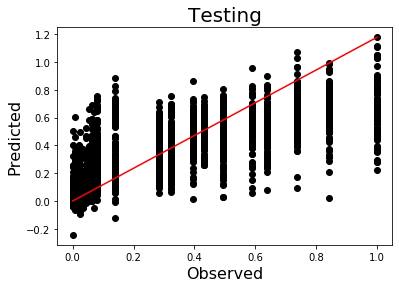

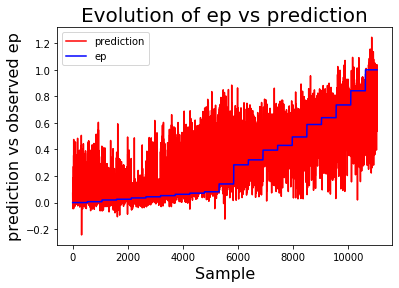

Current experiment: strains_curr_ANS05_g50.txt, Completion: 100%
[[ 0.00000000e+00  0.00000000e+00 -1.88242029e-02]
 [ 1.00000000e+00  0.00000000e+00 -3.03949536e-02]
 [ 2.00000000e+00  0.00000000e+00  5.52645057e-02]
 ...
 [ 8.32000000e+02  1.00000000e+00  3.88160393e-01]
 [ 8.33000000e+02  1.00000000e+00  2.01286390e-01]
 [ 8.34000000e+02  1.00000000e+00  5.12246270e-01]]
Train: [3340, 0.21362406560745512, 0.6157037220766302] 
Test: [835, 0.24568896634177778, 0.5030131254704027]


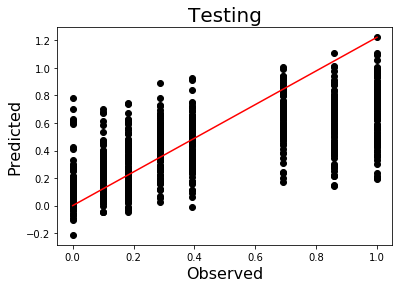

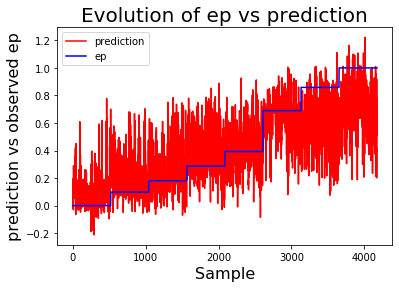

In [31]:
print(f"\nTraining nn models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

nn_model_scores = 'model_scores_dnn_g'+rad+'0.txt'
nn_model_score_matrix = 'transfer_learning_score_matrix_dnn_g'+rad+'0.txt'
nn_model_preds = ['result_dnn_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
nn_saved_models = ['../stored_models/model_dnn_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle

models = []
score_str = "experiment mse r2 time\n"

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.97, verbose=True)
    #Removing outliers
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    train_time = time.time()
    model = train_nn_model(df_train, target, features) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time

    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)

    save_test_data(model, features, target, df_test, result_folder, "TEST_prediction_dnn_"+experiments[i]+"_g"+rad+"0.txt")
    
    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+nn_model_preds[i],pred_vs_observed)
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"    
    
    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])

save_data_by_name(score_str,result_folder,nn_model_scores)


Performing transfer learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.6922495762839507
Test score: r2 = 0.6444310525320522
Train score on experiment FBL02: r2 = 0.7638639394548675
Test score: r2 = 0.7314895199530185
Train score on experiment ETNA01: r2 = 0.7924185075960696
Test score: r2 = 0.7218696106517806
Train score on experiment ETNA02: r2 = 0.7236461857921587
Test score: r2 = 0.649238084396119
Train score on experiment MONZ04: r2 = 0.5237153264745953
Test score: r2 = 0.48641289896608275
Train score on experiment MONZ05: r2 = 0.563064228269625
Test score: r2 = 0.516374186919276
Train score on experiment WG01: r2 = 0.7168346318129996
Test score: r2 = 0.6248352581150232
Train score on experiment WG02: r2 = 0.657161463476429
Test score: r2 = 0.5479185478599411
Train score on experiment WG04: r2 = 0.621854154589162
Test score: r2 = 0.6315806494912564
Train score on experiment GRS02: r2 = 0.7817990163592555
Test score: r2 = 0.688491463

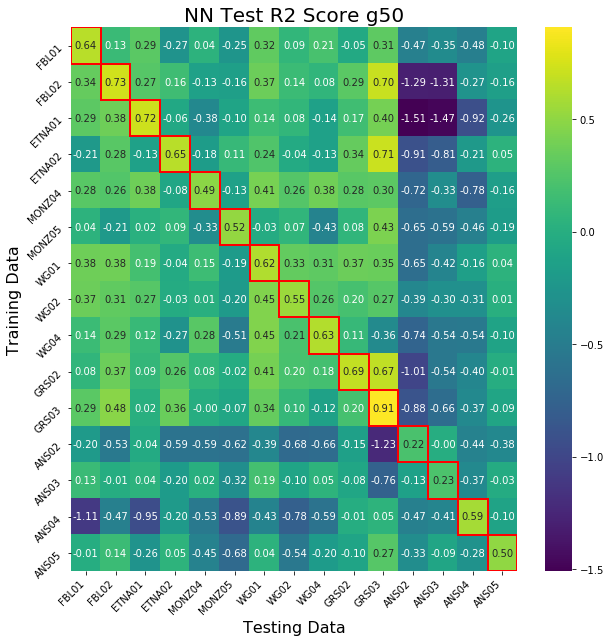

In [32]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["NN Test R2 Score g50", "Testing Data", "Training Data"],savename='../Figures1/strain_single_transfer_dnn_g50')
np.savetxt(result_folder+nn_model_score_matrix,r2_test_matrix)

### Datasets with a higher resolution

In [33]:
folder = '../strain_data_MS/' #rename experiment_folder -> add result_folder
experiments = ['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
num_exps = len(experiments)
#features = ['dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum']
features = ['dn_p90', 'dn_p75', 'dn_p50', 'dn_mean', 'dn_p25', 'dn_p10', 'dn_std', 'dn_num', 'dn_sum', 'dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum', 'cur_p90', 'cur_p75', 'cur_p50', 'cur_mean', 'cur_p25', 'cur_p10', 'cur_std', 'cur_num', 'cur_sum']
rad = '2' #Experiment resolutions 5 and 2
filenames = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in experiments]
target = "ep" #"sigD2" #save as strain if ep, stress elif sigD2, else dont save

conf = config()

result_folder = '../strain_model_output_MS/'
model_scores = 'model_scores_xgb_g'+rad+'0.txt'
score_str = "experiment mse r2 time\n"
model_score_matrix = 'transfer_learning_score_matrix_xgb_g'+rad+'0.txt'
model_preds = ['result_xgb_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
saved_models = ['../stored_models/model_xgb_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle

nn_model_scores = 'model_scores_dnn_g'+rad+'0.txt'
nn_model_score_matrix = 'transfer_learning_score_matrix_dnn_g'+rad+'0.txt'
nn_model_preds = ['result_dnn_'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data
nn_saved_models = ['../stored_models/model_dnn_'+experiment+'_g'+rad+'0.pkl' for experiment in experiments] #filenames for saved models using pickle


models = []
r2_train_vector = np.zeros(num_exps)
r2_test_matrix = np.zeros((num_exps,num_exps))


Training xgb models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g20.txt, Completion: 6%


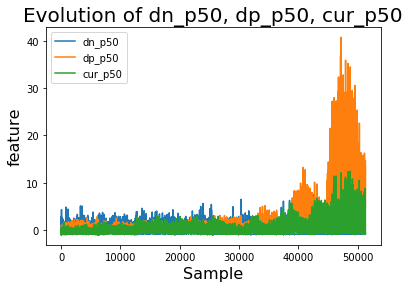

[[0.00000000e+00 0.00000000e+00 2.53249496e-01]
 [1.00000000e+00 0.00000000e+00 2.60217667e-01]
 [2.00000000e+00 0.00000000e+00 2.89353728e-01]
 ...
 [1.02520000e+04 1.00000000e+00 9.43739533e-01]
 [1.02530000e+04 1.00000000e+00 9.80801702e-01]
 [1.02540000e+04 1.00000000e+00 9.04892087e-01]]
Train: [41017, 0.19971146808116996, 0.5872593737728808] 
Test: [10255, 0.20873410134933298, 0.5514782294403597]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


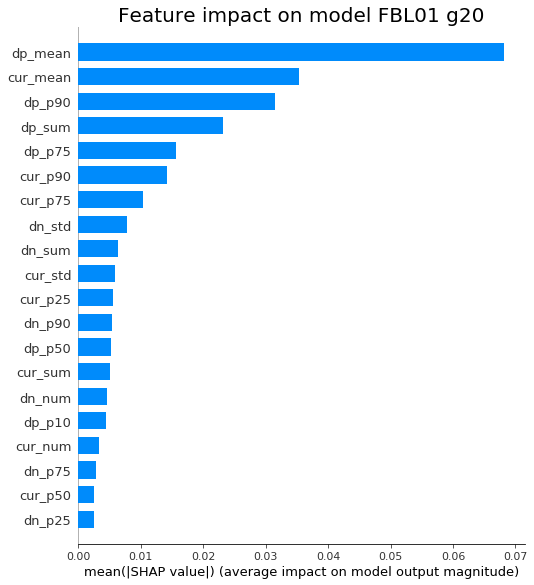

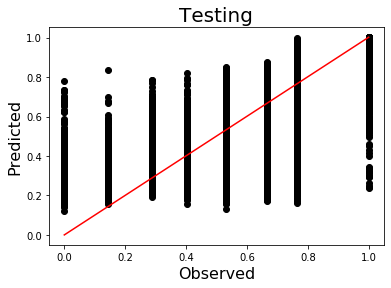

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


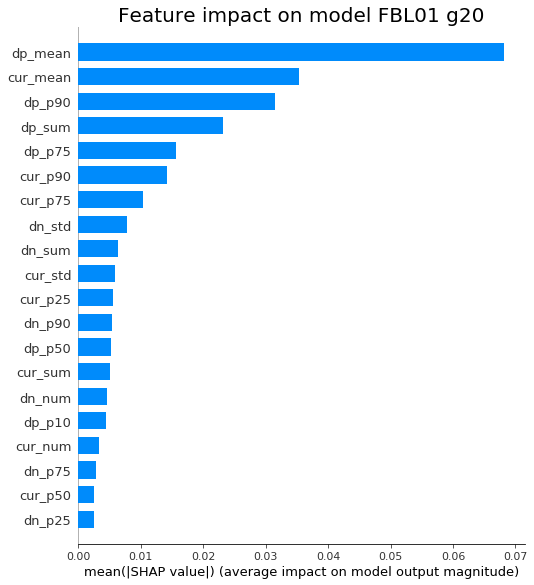

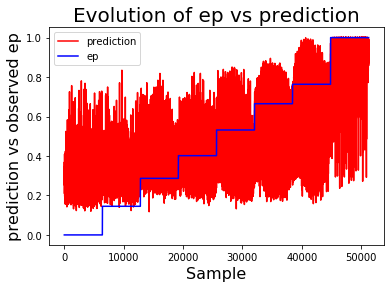

Current experiment: strains_curr_FBL02_g20.txt, Completion: 13%


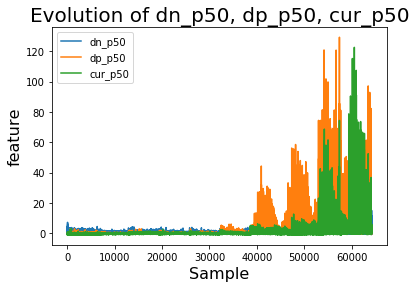

[[0.00000000e+00 0.00000000e+00 4.79680717e-01]
 [1.00000000e+00 0.00000000e+00 3.30176502e-01]
 [2.00000000e+00 0.00000000e+00 2.33170807e-01]
 ...
 [1.28520000e+04 1.00000000e+00 9.07856822e-01]
 [1.28530000e+04 1.00000000e+00 8.86071324e-01]
 [1.28540000e+04 1.00000000e+00 9.21916485e-01]]
Train: [51418, 0.1806785629436666, 0.6682600709269909] 
Test: [12855, 0.19226899218028304, 0.6190538595124822]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


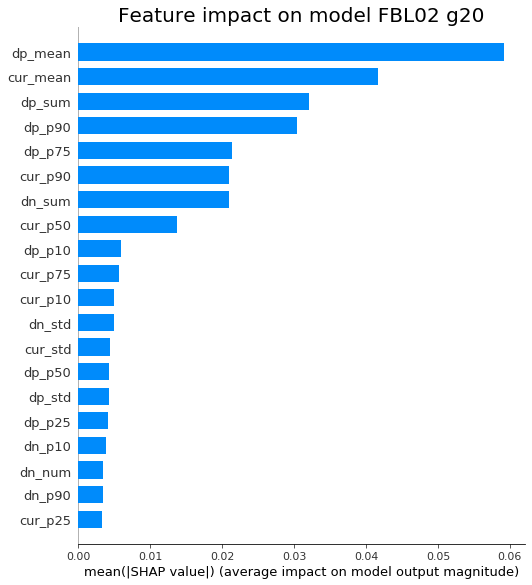

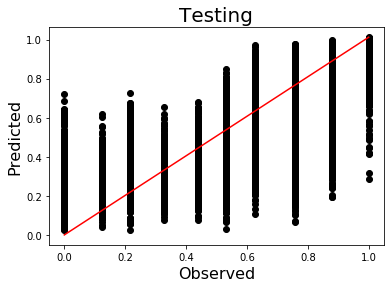

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


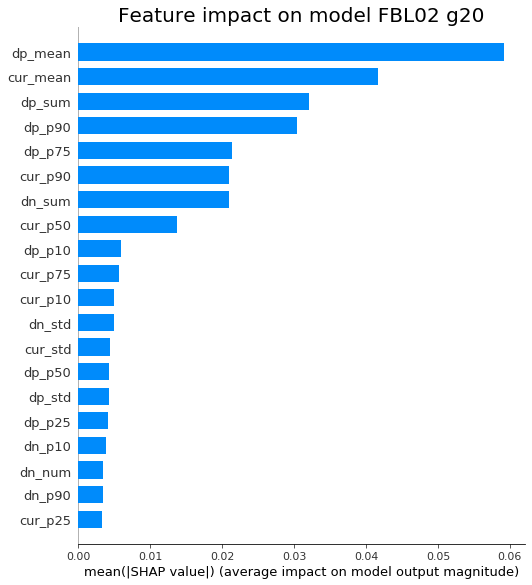

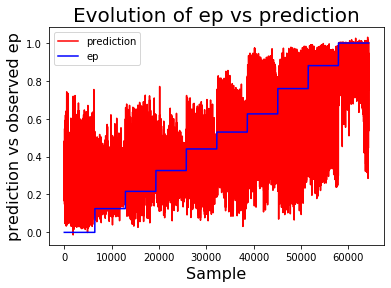

Current experiment: strains_curr_ETNA01_g20.txt, Completion: 20%


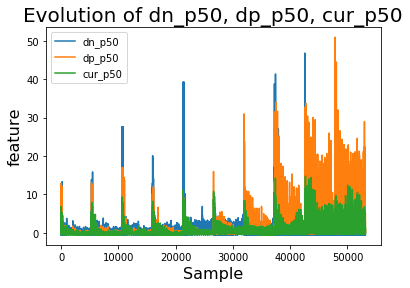

[[0.00000000e+00 0.00000000e+00 8.04539919e-01]
 [1.00000000e+00 0.00000000e+00 5.15398383e-01]
 [2.00000000e+00 0.00000000e+00 6.08142555e-01]
 ...
 [1.06270000e+04 1.00000000e+00 6.57993913e-01]
 [1.06280000e+04 1.00000000e+00 9.02227402e-01]
 [1.06290000e+04 1.00000000e+00 7.69514561e-01]]
Train: [42516, 0.16127065227223708, 0.7446739838425109] 
Test: [10630, 0.1859341350534349, 0.6592659516758914]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


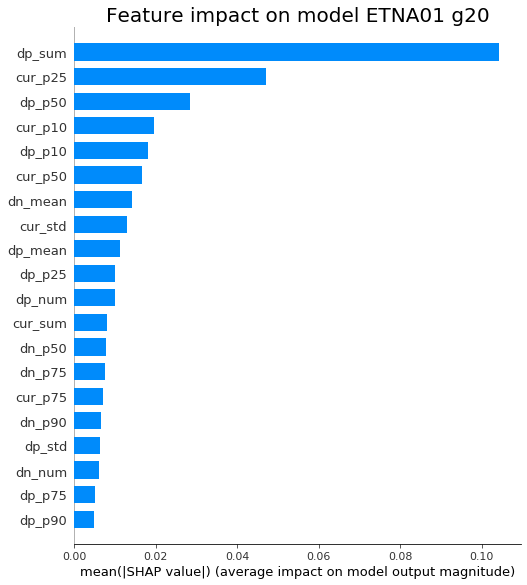

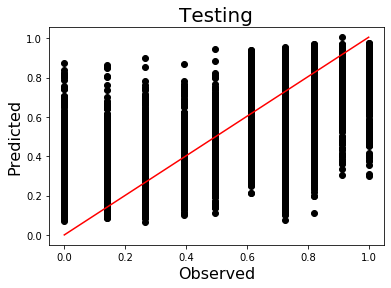

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


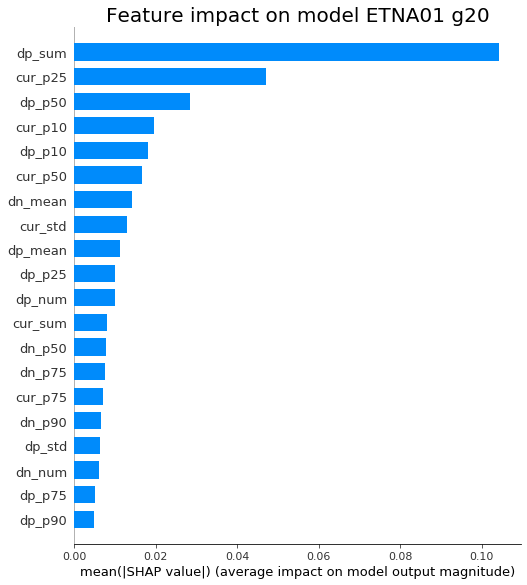

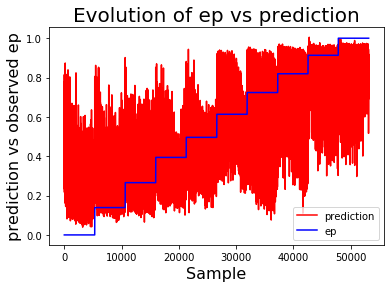

Current experiment: strains_curr_ETNA02_g20.txt, Completion: 26%


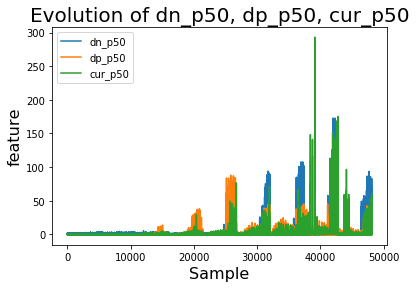

[[0.00000000e+00 0.00000000e+00 2.77544975e-01]
 [1.00000000e+00 0.00000000e+00 4.23452437e-01]
 [2.00000000e+00 0.00000000e+00 6.48917794e-01]
 ...
 [9.62100000e+03 1.00000000e+00 5.63149750e-01]
 [9.62200000e+03 1.00000000e+00 4.83657777e-01]
 [9.62300000e+03 1.00000000e+00 6.84993505e-01]]
Train: [38492, 0.17043777251080813, 0.7269145482364154] 
Test: [9624, 0.19432634452564657, 0.6452094297466204]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


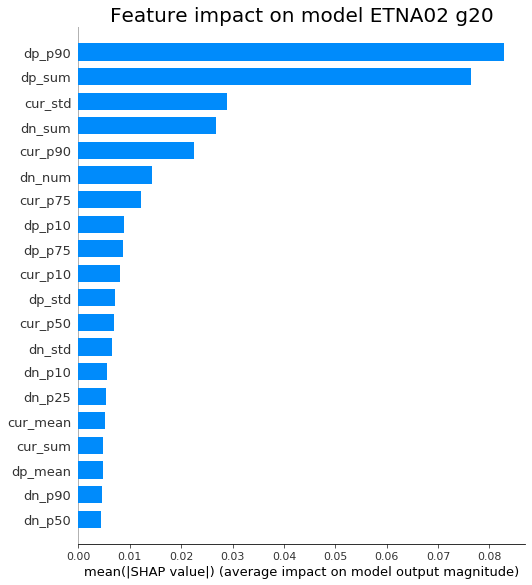

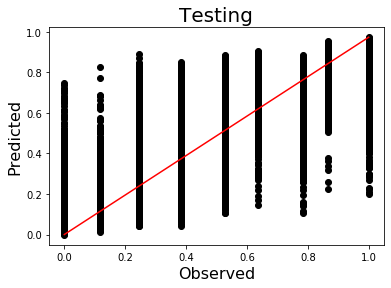

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


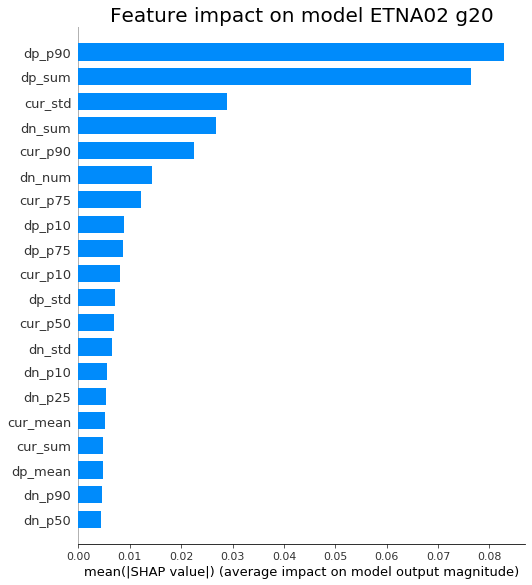

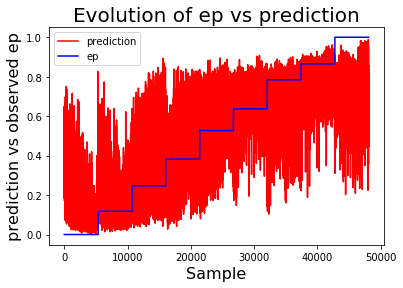

Current experiment: strains_curr_MONZ04_g20.txt, Completion: 33%


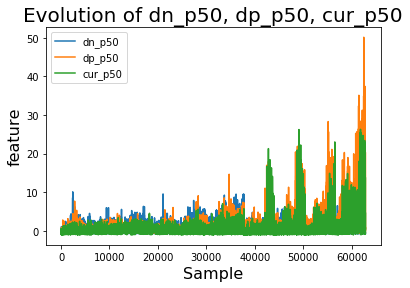

[[0.00000000e+00 0.00000000e+00 3.65750492e-01]
 [1.00000000e+00 0.00000000e+00 5.09328902e-01]
 [2.00000000e+00 0.00000000e+00 3.98799092e-01]
 ...
 [1.25690000e+04 1.00000000e+00 9.19108331e-01]
 [1.25700000e+04 1.00000000e+00 6.95116341e-01]
 [1.25710000e+04 1.00000000e+00 7.33192384e-01]]
Train: [50284, 0.24847719069379637, 0.3998228875496025] 
Test: [12572, 0.2672465890987337, 0.30633649874046287]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


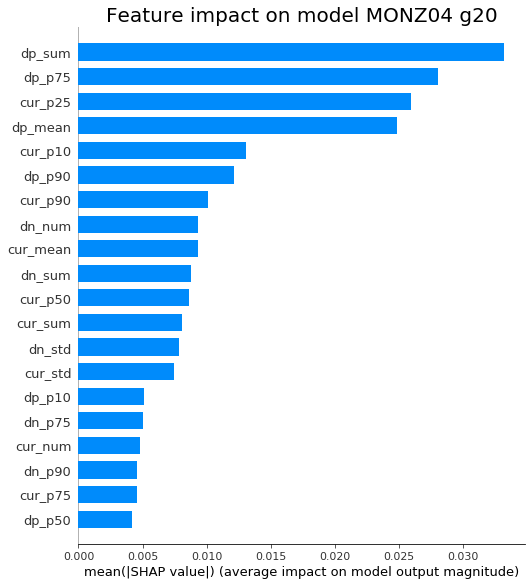

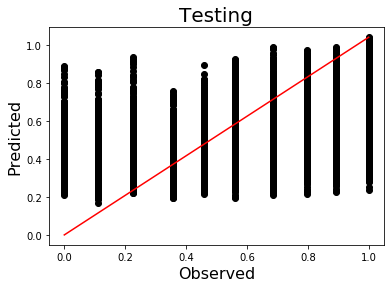

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


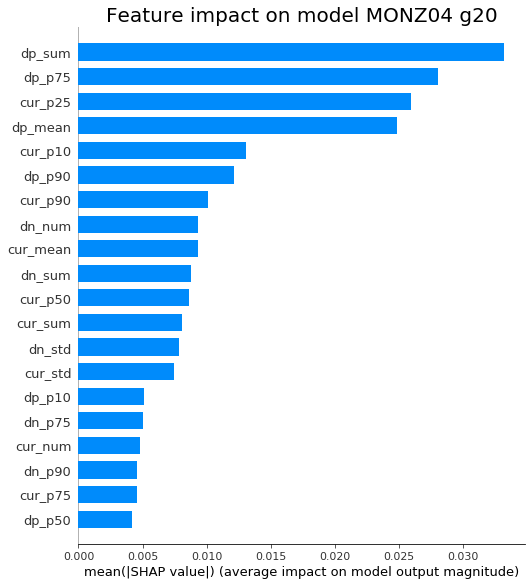

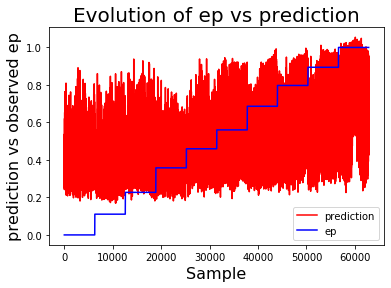

Current experiment: strains_curr_MONZ05_g20.txt, Completion: 40%


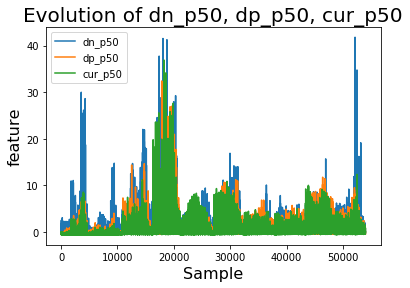

[[0.00000000e+00 0.00000000e+00 1.70640588e-01]
 [1.00000000e+00 0.00000000e+00 5.42390287e-01]
 [2.00000000e+00 0.00000000e+00 1.92537576e-01]
 ...
 [1.07960000e+04 1.00000000e+00 6.51068091e-01]
 [1.07970000e+04 1.00000000e+00 7.17938900e-01]
 [1.07980000e+04 1.00000000e+00 7.03575671e-01]]
Train: [43196, 0.19842114406777472, 0.49982703581798416] 
Test: [10799, 0.21727005933660323, 0.40083491884123035]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


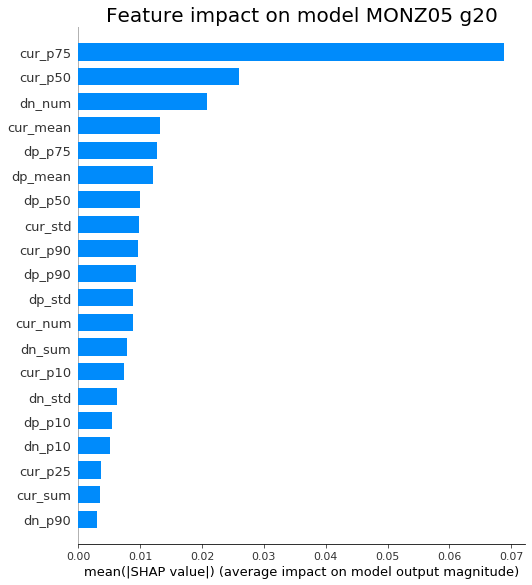

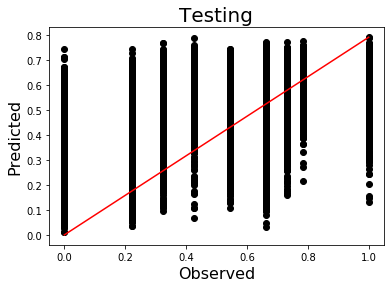

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


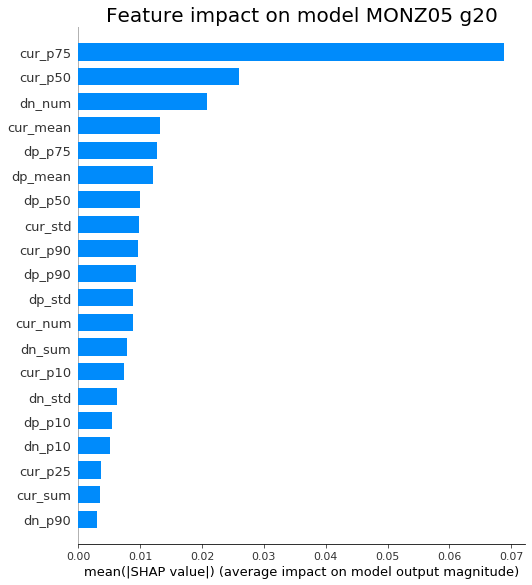

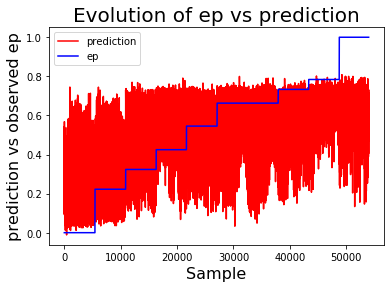

Current experiment: strains_curr_WG01_g20.txt, Completion: 46%


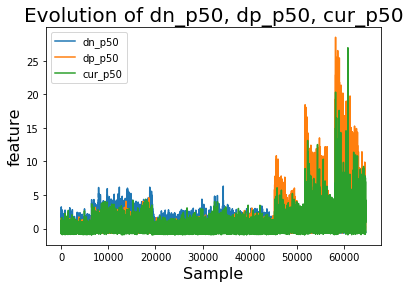

[[0.00000000e+00 0.00000000e+00 3.46138179e-01]
 [1.00000000e+00 0.00000000e+00 3.21036547e-01]
 [2.00000000e+00 0.00000000e+00 2.71039724e-01]
 ...
 [1.29080000e+04 1.00000000e+00 7.99909890e-01]
 [1.29090000e+04 1.00000000e+00 9.16955411e-01]
 [1.29100000e+04 1.00000000e+00 9.22719002e-01]]
Train: [51642, 0.23323489970867178, 0.4947227540207976] 
Test: [12911, 0.23981843674828876, 0.464902581686769]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


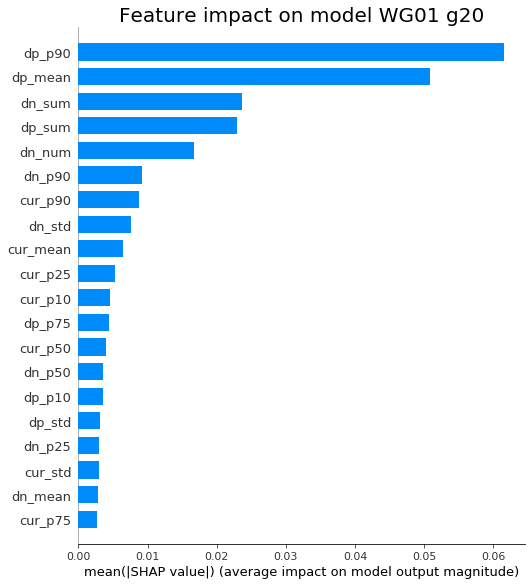

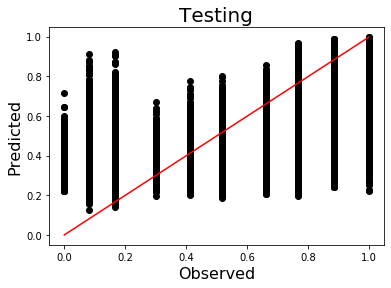

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


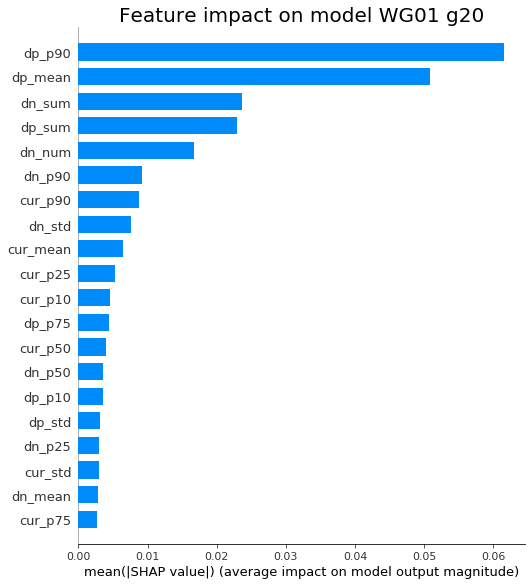

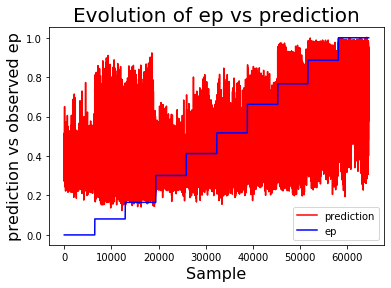

Current experiment: strains_curr_WG02_g20.txt, Completion: 53%


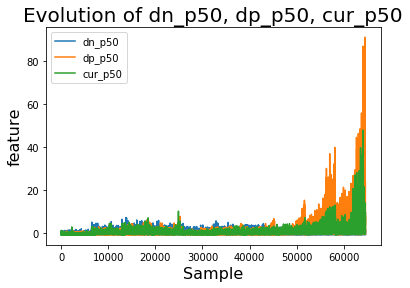

[[0.00000000e+00 0.00000000e+00 2.24965572e-01]
 [1.00000000e+00 0.00000000e+00 3.79638523e-01]
 [2.00000000e+00 0.00000000e+00 4.54082102e-01]
 ...
 [1.29160000e+04 1.00000000e+00 8.20669174e-01]
 [1.29170000e+04 1.00000000e+00 9.19589579e-01]
 [1.29180000e+04 1.00000000e+00 8.96474481e-01]]
Train: [51672, 0.23252673931486403, 0.4710182541221536] 
Test: [12919, 0.2412385593160622, 0.4355616475374109]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


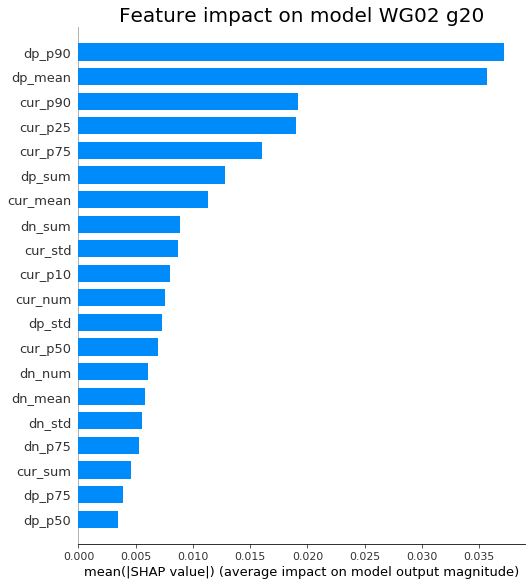

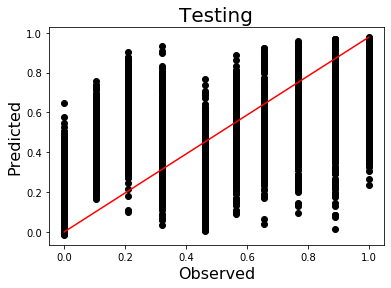

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


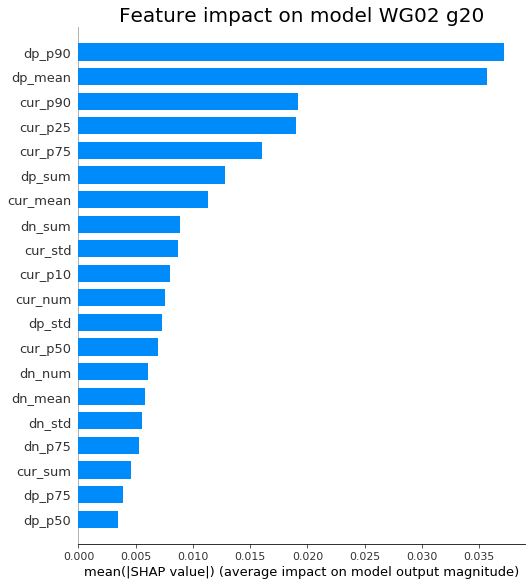

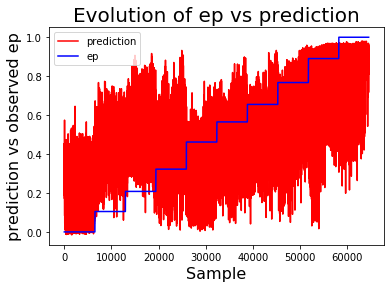

Current experiment: strains_curr_WG04_g20.txt, Completion: 60%


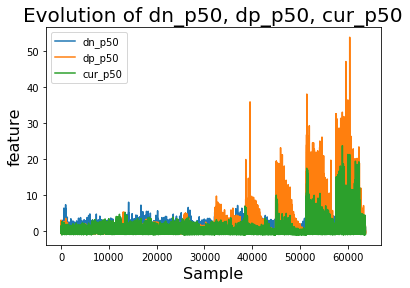

[[0.00000000e+00 0.00000000e+00 4.30584192e-01]
 [1.00000000e+00 0.00000000e+00 6.97825789e-01]
 [2.00000000e+00 0.00000000e+00 3.59395713e-01]
 ...
 [1.27350000e+04 1.00000000e+00 4.31407750e-01]
 [1.27360000e+04 1.00000000e+00 3.75238985e-01]
 [1.27370000e+04 1.00000000e+00 4.20388073e-01]]
Train: [50948, 0.22652460758264462, 0.49467973770423757] 
Test: [12738, 0.23963953005453112, 0.43359338063800634]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


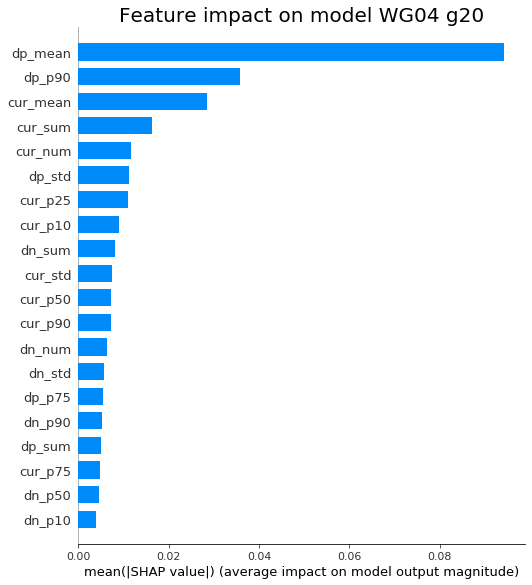

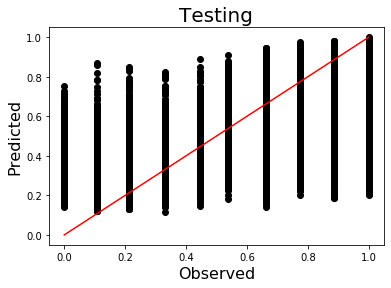

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


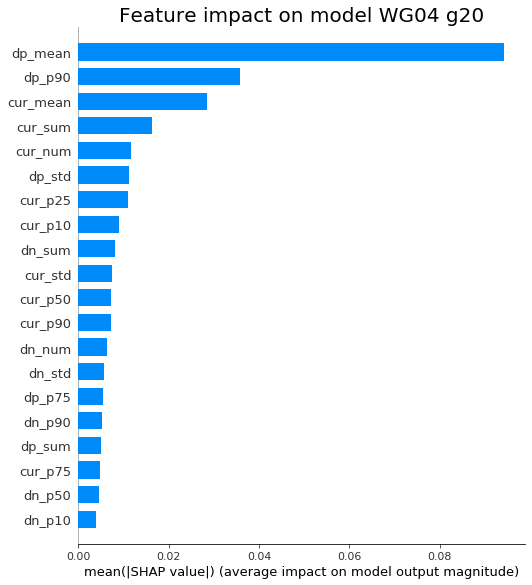

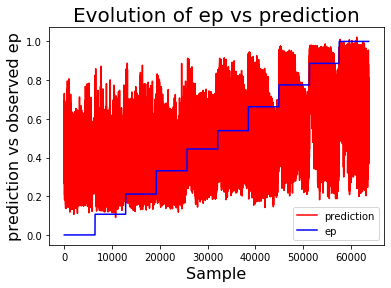

Current experiment: strains_curr_GRS02_g20.txt, Completion: 66%


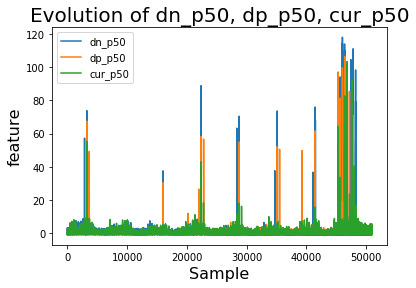

[[0.00000000e+00 0.00000000e+00 5.91903389e-01]
 [1.00000000e+00 0.00000000e+00 6.13757730e-01]
 [2.00000000e+00 0.00000000e+00 2.38688767e-01]
 ...
 [1.01850000e+04 1.00000000e+00 7.47555435e-01]
 [1.01860000e+04 1.00000000e+00 7.36821413e-01]
 [1.01870000e+04 1.00000000e+00 7.70673394e-01]]
Train: [40751, 0.21718901367451637, 0.5358702903135543] 
Test: [10188, 0.23713601144142285, 0.4406029373871646]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


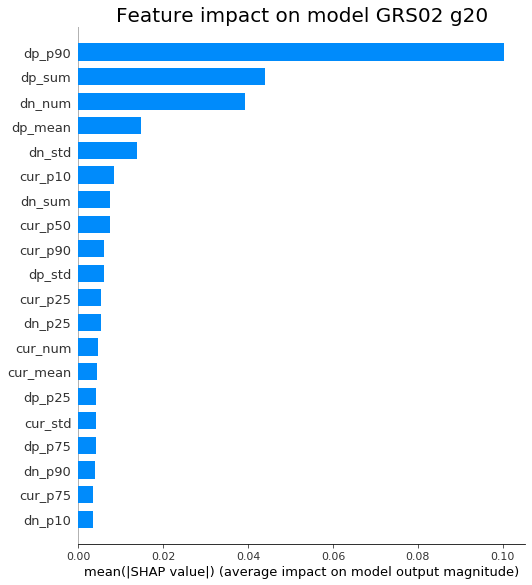

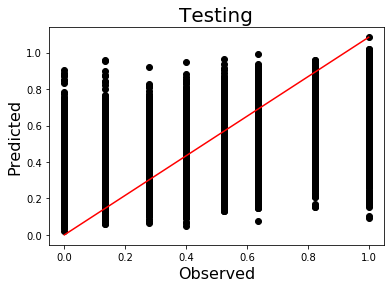

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


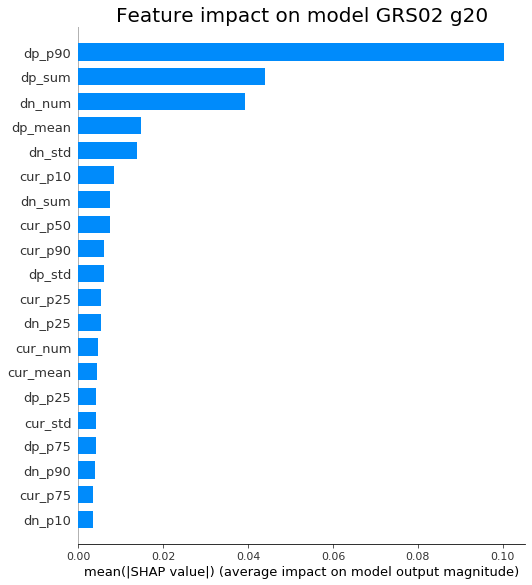

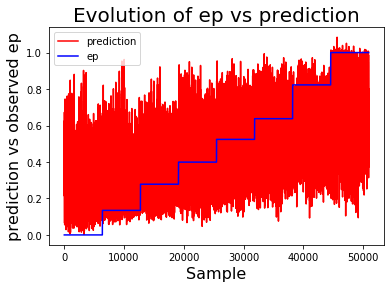

Current experiment: strains_curr_GRS03_g20.txt, Completion: 73%


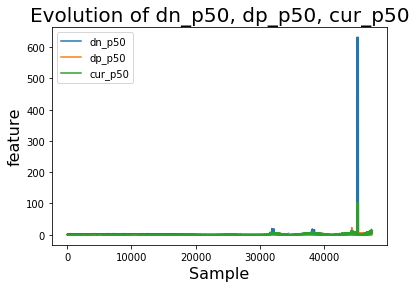

[[0.00000000e+00 0.00000000e+00 8.84594023e-02]
 [1.00000000e+00 0.00000000e+00 2.35016078e-01]
 [2.00000000e+00 0.00000000e+00 7.61708915e-02]
 ...
 [9.48500000e+03 1.00000000e+00 1.00028872e+00]
 [9.48600000e+03 1.00000000e+00 9.35294926e-01]
 [9.48700000e+03 1.00000000e+00 1.01961899e+00]]
Train: [37950, 0.10322864980842718, 0.8979486169678959] 
Test: [9488, 0.11551858729876092, 0.8698767893040802]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


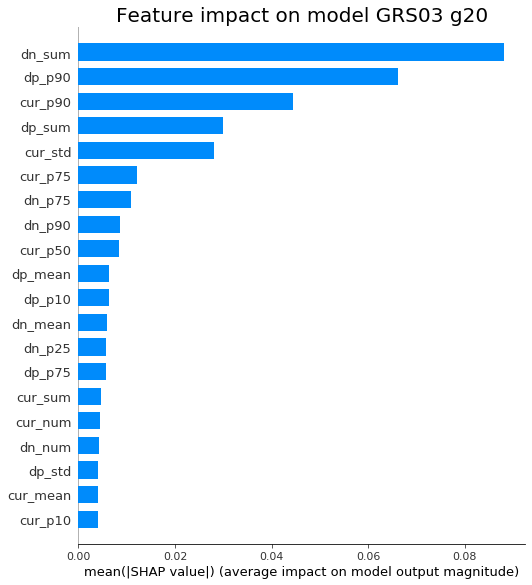

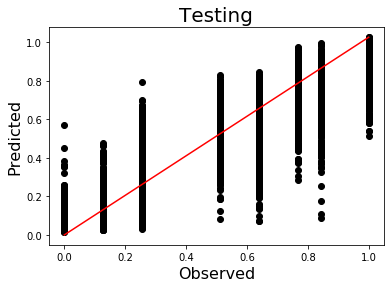

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


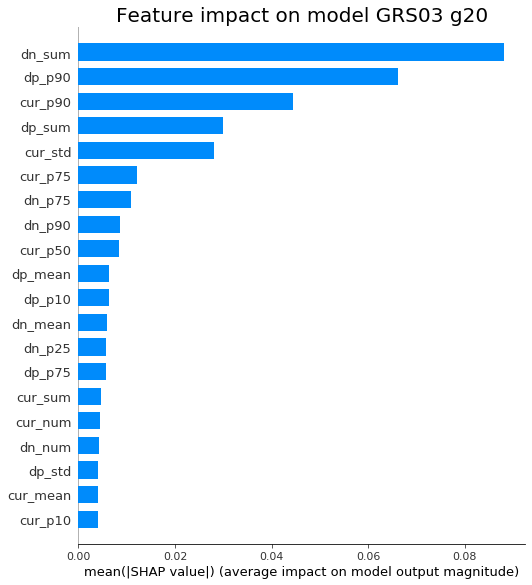

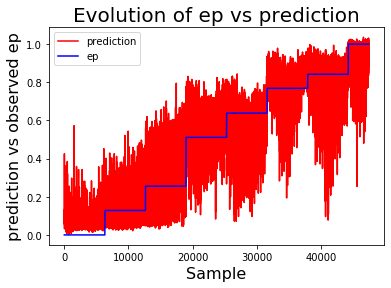

Current experiment: strains_curr_ANS02_g20.txt, Completion: 80%


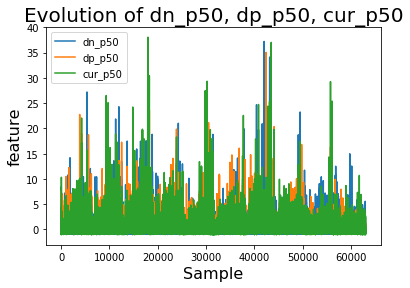

[[0.00000000e+00 0.00000000e+00 2.95155764e-01]
 [1.00000000e+00 0.00000000e+00 3.17630440e-01]
 [2.00000000e+00 0.00000000e+00 4.09960896e-01]
 ...
 [1.26000000e+04 1.00000000e+00 4.36281025e-01]
 [1.26010000e+04 1.00000000e+00 5.05280674e-01]
 [1.26020000e+04 1.00000000e+00 3.66359264e-01]]
Train: [50412, 0.2580542175311377, 0.2595211319256526] 
Test: [12603, 0.28177272306426737, 0.12681480930114297]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


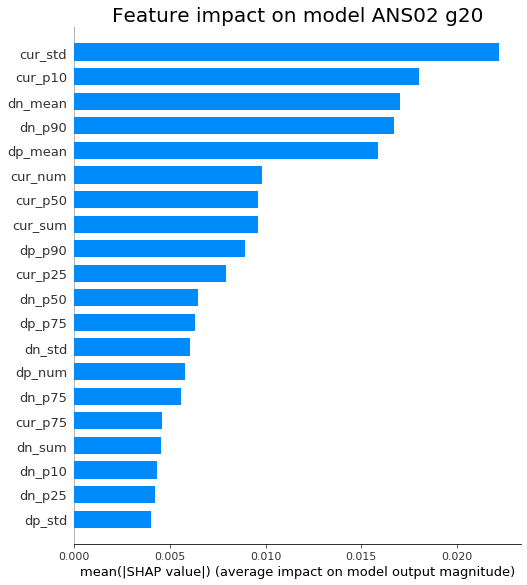

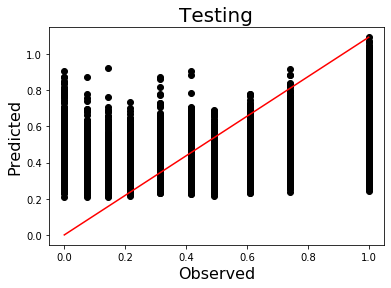

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


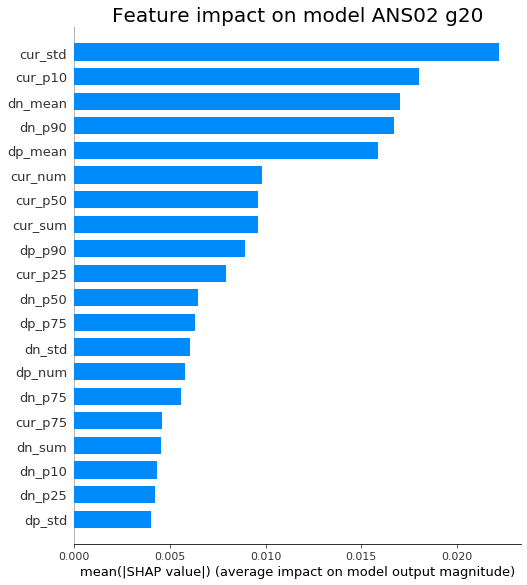

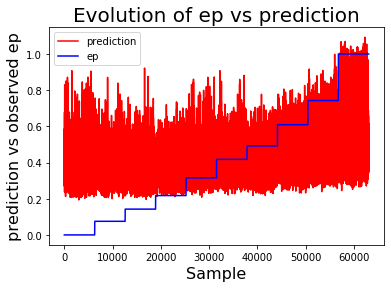

Current experiment: strains_curr_ANS03_g20.txt, Completion: 86%


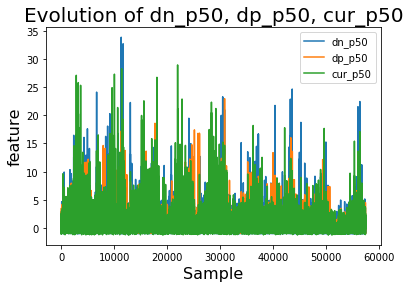

[[0.00000000e+00 0.00000000e+00 4.72274899e-01]
 [1.00000000e+00 0.00000000e+00 5.28839171e-01]
 [2.00000000e+00 0.00000000e+00 4.31117922e-01]
 ...
 [1.14820000e+04 1.00000000e+00 6.03358865e-01]
 [1.14830000e+04 1.00000000e+00 5.80773771e-01]
 [1.14840000e+04 1.00000000e+00 4.75294024e-01]]
Train: [45937, 0.27273142344512263, 0.2367458076602469] 
Test: [11485, 0.2859767258981729, 0.17100412624364814]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


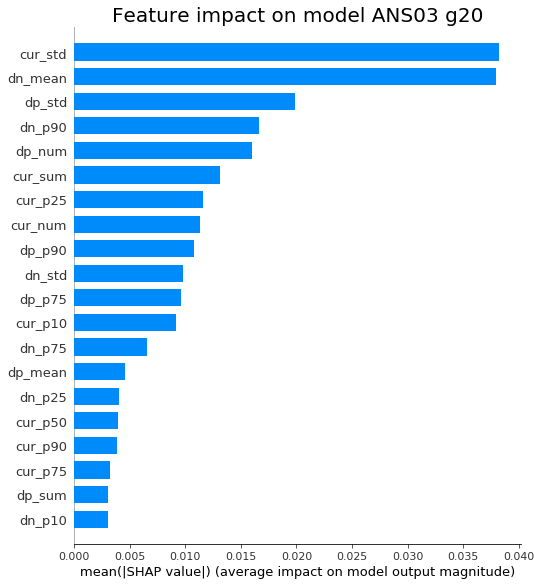

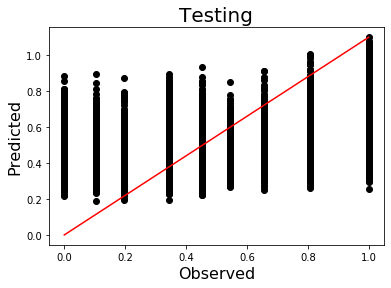

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


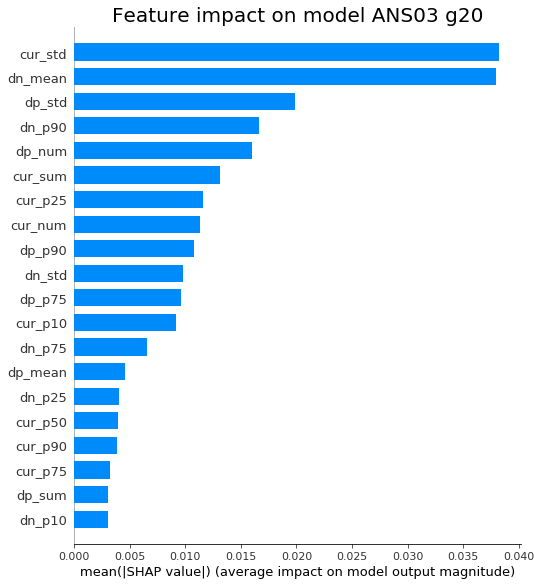

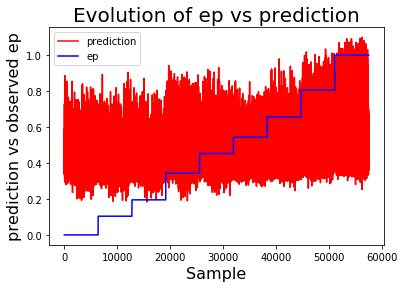

Current experiment: strains_curr_ANS04_g20.txt, Completion: 93%


Creating legend with loc="best" can be slow with large amounts of data.


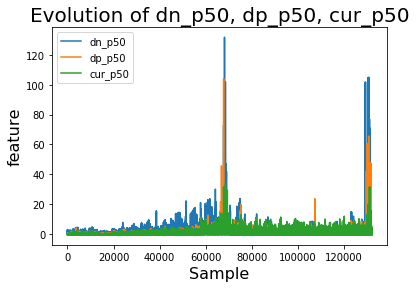

[[0.00000000e+00 0.00000000e+00 6.69369400e-02]
 [1.00000000e+00 0.00000000e+00 1.40222251e-01]
 [2.00000000e+00 0.00000000e+00 2.34894365e-01]
 ...
 [2.63910000e+04 1.00000000e+00 4.81155753e-01]
 [2.63920000e+04 1.00000000e+00 3.71729344e-01]
 [2.63930000e+04 1.00000000e+00 1.79544806e-01]]
Train: [105574, 0.2134080860231489, 0.46172025165175734] 
Test: [26394, 0.23374877922830953, 0.35663404117777986]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


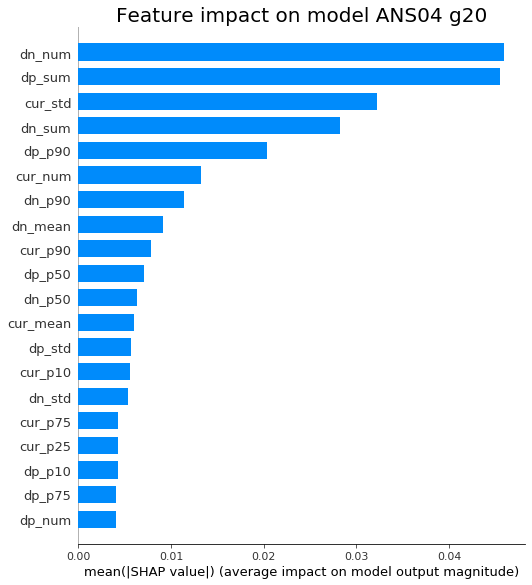

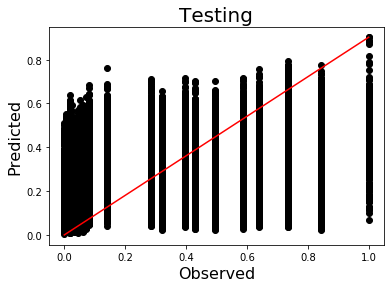

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


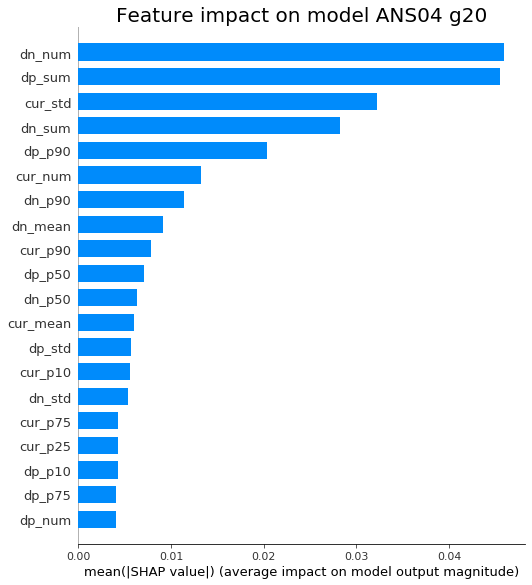

Creating legend with loc="best" can be slow with large amounts of data.


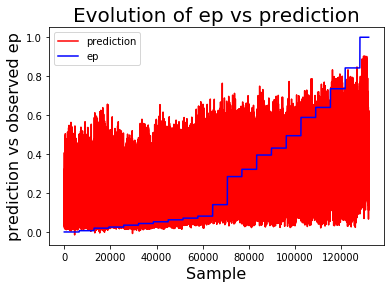

Current experiment: strains_curr_ANS05_g20.txt, Completion: 100%


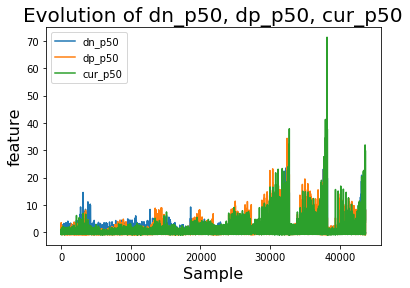

[[0.00000000e+00 0.00000000e+00 5.36487162e-01]
 [1.00000000e+00 0.00000000e+00 6.79695725e-01]
 [2.00000000e+00 0.00000000e+00 4.51454103e-01]
 ...
 [8.72800000e+03 1.00000000e+00 3.96751910e-01]
 [8.72900000e+03 1.00000000e+00 4.50283796e-01]
 [8.73000000e+03 1.00000000e+00 4.49514955e-01]]
Train: [34920, 0.2526654940552026, 0.463908795683596] 
Test: [8731, 0.27846179393510245, 0.3550744007271137]


Setting feature_perturbation = "tree_path_dependent" because no background data was given.


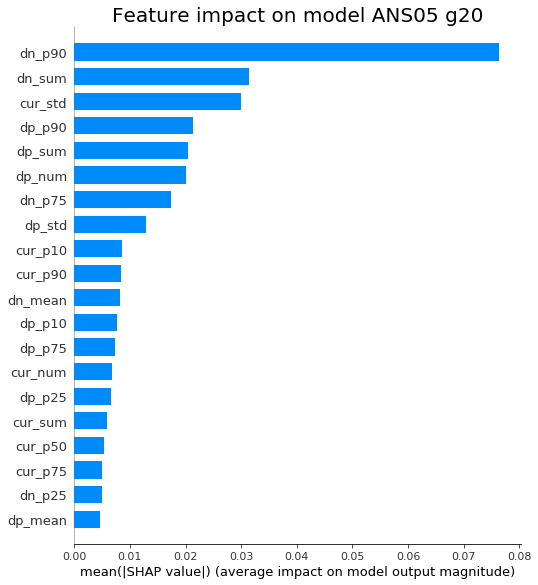

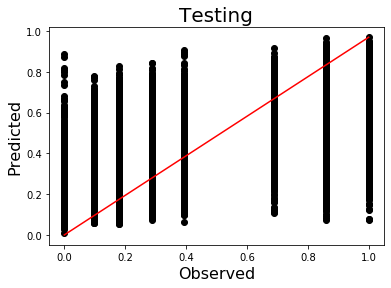

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


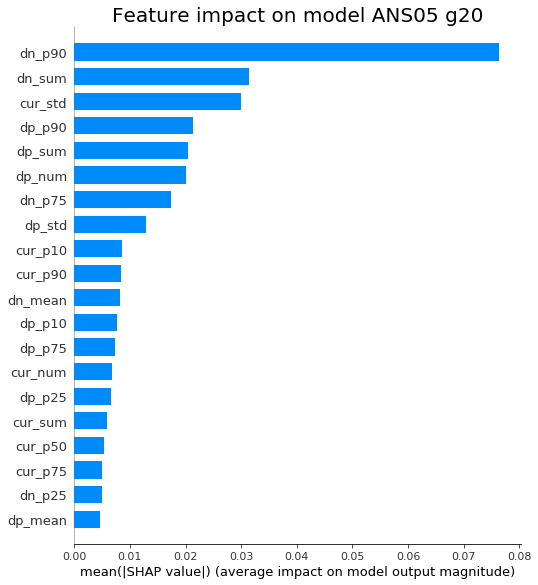

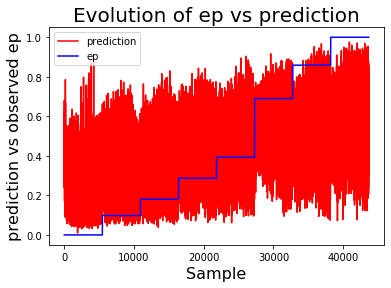

In [34]:
print(f"\nTraining xgb models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.99, verbose=True)
    
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    plot_data_time_evolutions(dataframe, [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'Sample','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
    #plot_data_errorbars(dataframe, dataframe['ep'], [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'ep','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
    
    train_time = time.time()
    model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time()-train_time
    
    with open(saved_models[i], 'wb') as file:
        pickle.dump(model,file)

    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)
    
    save_test_data(model, features, target, df_test, result_folder, "TEST_prediction_xgb_"+experiments[i]+"_g"+rad+"0.txt")
        
    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    shap_vals = represent_model_results(model,df_train,features,target,'Feature impact on model '+experiments[i]+ ' g'+rad+'0', result_folder+'Shap_vals_xgb_'+experiments[i]+'_g'+rad+'0')
    #print(shap_vals)

    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])
    represent_model_results(model,df_train,features,target,'Feature impact on model '+experiments[i]+ ' g'+rad+'0', '../Figures1/'+'Shap_plot_xgb_'+experiments[i]+'_g'+rad+'0')

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"
    
    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+model_preds[i],pred_vs_observed)
    
save_data_by_name(score_str,result_folder,model_scores)


Performing transfer learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.5872593737728808
Test score: r2 = 0.5514782294403597
Train score on experiment FBL02: r2 = 0.6682600709269909
Test score: r2 = 0.6190538595124822
Train score on experiment ETNA01: r2 = 0.7446739838425109
Test score: r2 = 0.6592659516758914
Train score on experiment ETNA02: r2 = 0.7269145482364154
Test score: r2 = 0.6452094297466204
Train score on experiment MONZ04: r2 = 0.3998228875496025
Test score: r2 = 0.30633649874046287
Train score on experiment MONZ05: r2 = 0.49982703581798416
Test score: r2 = 0.40083491884123035
Train score on experiment WG01: r2 = 0.4947227540207976
Test score: r2 = 0.464902581686769
Train score on experiment WG02: r2 = 0.4710182541221536
Test score: r2 = 0.4355616475374109
Train score on experiment WG04: r2 = 0.49467973770423757
Test score: r2 = 0.43359338063800634
Train score on experiment GRS02: r2 = 0.5358702903135543
Test score: r2 = 0.4

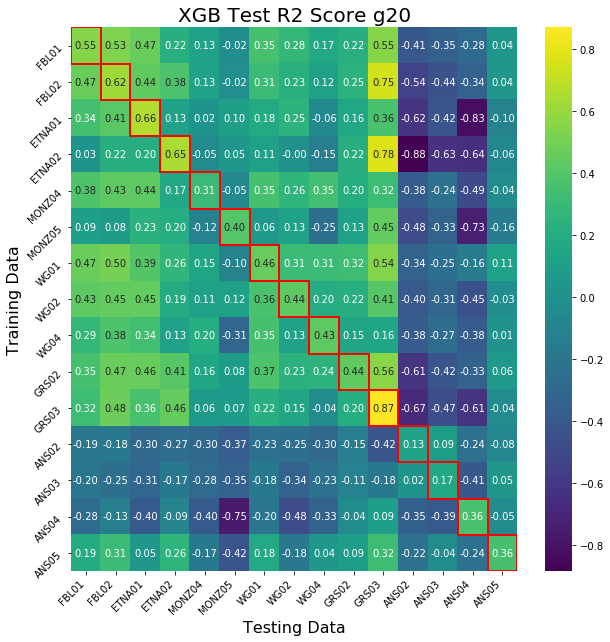

In [35]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["XGB Test R2 Score g20", "Testing Data", "Training Data"], savename='../Figures1/strain_single_transfer_xgb_g20')
np.savetxt(result_folder+model_score_matrix,r2_test_matrix)

We observe even more model variance on the larger datasets. This may be a good opportunity to test the models trained on the smaller g50 datasets on these larger g20 datasets. For now reviewing the model scores we see that they are far better when we do not remove the outliers. This could indicate that the outliers are important for the learning of our models. 

Another possibility is that the noise in our data is large enough that outliers help our models learn more than the rest of the data. I NEED TO READ UP ON THIS

### Training a neural network on the high resolution dataset


Training nn models on 15 experiments, testing on same dataset. 
Storing models for later transfer learning:

Current experiment: strains_curr_FBL01_g20.txt, Completion: 6%
[[0.00000000e+00 0.00000000e+00 1.60802519e-01]
 [1.00000000e+00 0.00000000e+00 2.36794646e-01]
 [2.00000000e+00 0.00000000e+00 2.01557825e-01]
 ...
 [1.02520000e+04 1.00000000e+00 9.70305923e-01]
 [1.02530000e+04 1.00000000e+00 9.94963196e-01]
 [1.02540000e+04 1.00000000e+00 1.01783215e+00]]
Train: [41017, 0.2095747513176398, 0.5463575618194767] 
Test: [10255, 0.21104323258021074, 0.5379405028260076]


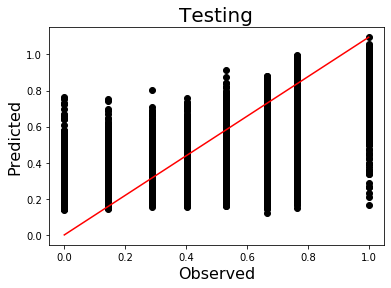

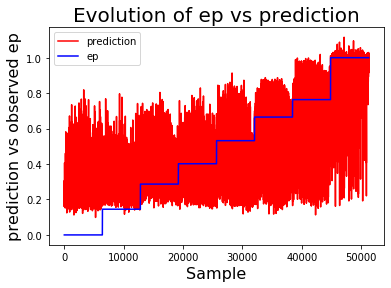

Current experiment: strains_curr_FBL02_g20.txt, Completion: 13%
[[0.00000000e+00 0.00000000e+00 3.29329563e-01]
 [1.00000000e+00 0.00000000e+00 3.45888114e-01]
 [2.00000000e+00 0.00000000e+00 4.15789373e-01]
 ...
 [1.28520000e+04 1.00000000e+00 7.48318246e-01]
 [1.28530000e+04 1.00000000e+00 7.59183098e-01]
 [1.28540000e+04 1.00000000e+00 7.15317628e-01]]
Train: [51418, 0.19386590039618784, 0.617387706955396] 
Test: [12855, 0.1947307998851959, 0.6119715655406672]


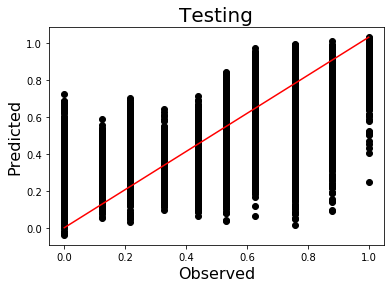

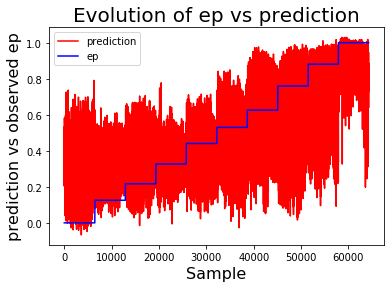

Current experiment: strains_curr_ETNA01_g20.txt, Completion: 20%
[[0.00000000e+00 0.00000000e+00 7.21502311e-01]
 [1.00000000e+00 0.00000000e+00 8.02652910e-01]
 [2.00000000e+00 0.00000000e+00 8.00788926e-01]
 ...
 [1.06270000e+04 1.00000000e+00 7.46619721e-01]
 [1.06280000e+04 1.00000000e+00 8.37663030e-01]
 [1.06290000e+04 1.00000000e+00 6.57192219e-01]]
Train: [42516, 0.1847520235879114, 0.6654732119654213] 
Test: [10630, 0.18444613435134205, 0.6623920958577989]


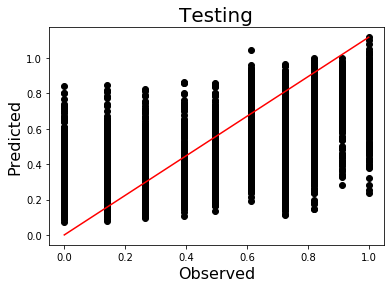

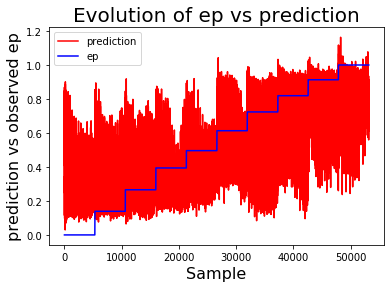

Current experiment: strains_curr_ETNA02_g20.txt, Completion: 26%
[[0.00000000e+00 0.00000000e+00 4.06852878e-01]
 [1.00000000e+00 0.00000000e+00 5.31229310e-01]
 [2.00000000e+00 0.00000000e+00 4.16462540e-01]
 ...
 [9.62100000e+03 1.00000000e+00 3.38128352e-01]
 [9.62200000e+03 1.00000000e+00 4.64470404e-01]
 [9.62300000e+03 1.00000000e+00 7.17535495e-01]]
Train: [38492, 0.19857890911236276, 0.6289809425043009] 
Test: [9624, 0.20024944726075106, 0.6245921757583539]


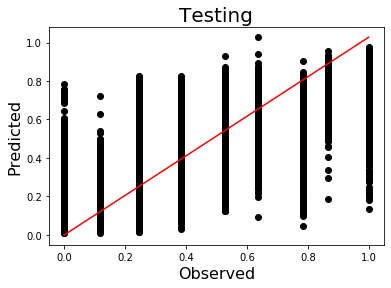

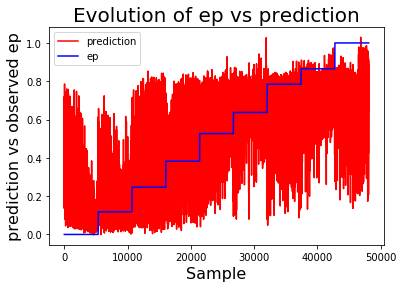

Current experiment: strains_curr_MONZ04_g20.txt, Completion: 33%
[[0.00000000e+00 0.00000000e+00 4.22113698e-01]
 [1.00000000e+00 0.00000000e+00 4.12743407e-01]
 [2.00000000e+00 0.00000000e+00 4.12032358e-01]
 ...
 [1.25690000e+04 1.00000000e+00 7.37046659e-01]
 [1.25700000e+04 1.00000000e+00 5.84960285e-01]
 [1.25710000e+04 1.00000000e+00 5.58693702e-01]]
Train: [50284, 0.2665549579398917, 0.3083434080379833] 
Test: [12572, 0.2682956841006796, 0.3045748967509808]


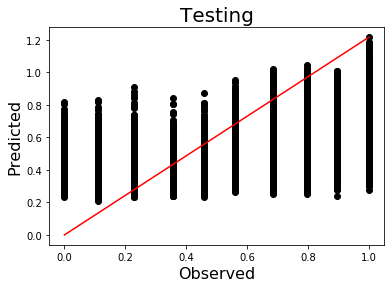

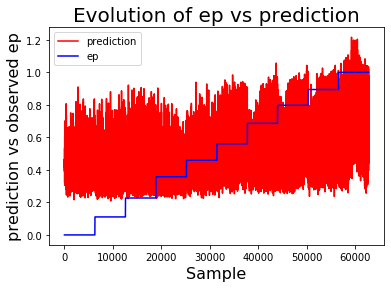

Current experiment: strains_curr_MONZ05_g20.txt, Completion: 40%
[[0.00000000e+00 0.00000000e+00 2.45868054e-01]
 [1.00000000e+00 0.00000000e+00 5.30614512e-01]
 [2.00000000e+00 0.00000000e+00 4.07443209e-01]
 ...
 [1.07960000e+04 1.00000000e+00 7.09588655e-01]
 [1.07970000e+04 1.00000000e+00 6.54343869e-01]
 [1.07980000e+04 1.00000000e+00 6.34049849e-01]]
Train: [43196, 0.21520929603477879, 0.41094737380294577] 
Test: [10799, 0.2183598437541899, 0.3975162439070026]


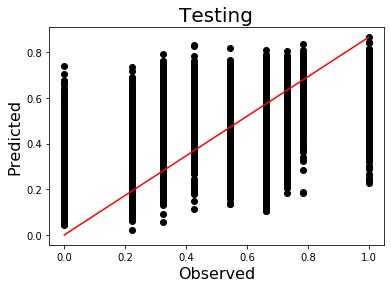

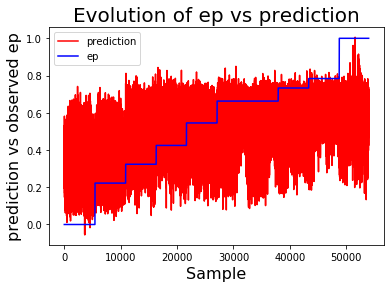

Current experiment: strains_curr_WG01_g20.txt, Completion: 46%
[[0.00000000e+00 0.00000000e+00 3.43716947e-01]
 [1.00000000e+00 0.00000000e+00 6.56745028e-01]
 [2.00000000e+00 0.00000000e+00 3.86737215e-01]
 ...
 [1.29080000e+04 1.00000000e+00 9.65422311e-01]
 [1.29090000e+04 1.00000000e+00 8.60427345e-01]
 [1.29100000e+04 1.00000000e+00 9.90079313e-01]]
Train: [51642, 0.2396341284654068, 0.46712092866437205] 
Test: [12911, 0.24329108352501003, 0.4473676741386782]


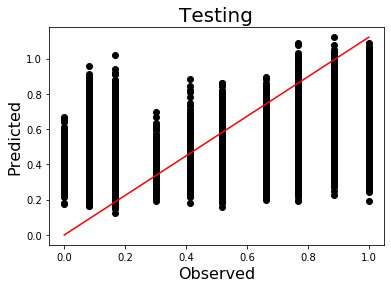

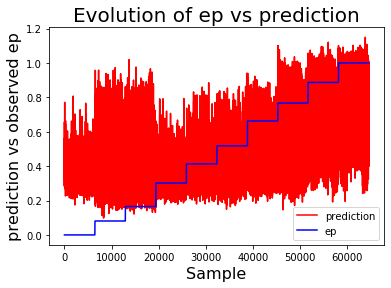

Current experiment: strains_curr_WG02_g20.txt, Completion: 53%
[[0.00000000e+00 0.00000000e+00 3.34427777e-01]
 [1.00000000e+00 0.00000000e+00 3.84950733e-01]
 [2.00000000e+00 0.00000000e+00 3.10588133e-01]
 ...
 [1.29160000e+04 1.00000000e+00 9.20405222e-01]
 [1.29170000e+04 1.00000000e+00 9.53393784e-01]
 [1.29180000e+04 1.00000000e+00 1.01425165e+00]]
Train: [51672, 0.2408609224548645, 0.43401435372963526] 
Test: [12919, 0.2431628556458959, 0.42004971650471934]


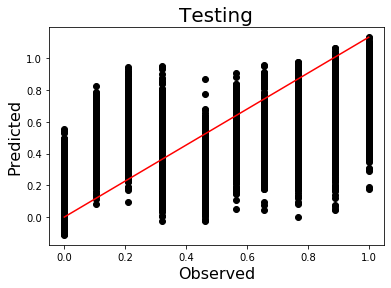

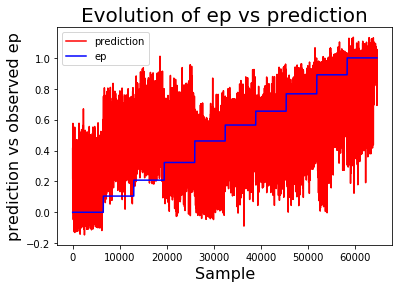

Current experiment: strains_curr_WG04_g20.txt, Completion: 60%
[[0.00000000e+00 0.00000000e+00 3.66286143e-01]
 [1.00000000e+00 0.00000000e+00 4.14596753e-01]
 [2.00000000e+00 0.00000000e+00 7.19250504e-01]
 ...
 [1.27350000e+04 1.00000000e+00 6.25385548e-01]
 [1.27360000e+04 1.00000000e+00 4.65443599e-01]
 [1.27370000e+04 1.00000000e+00 4.94780435e-01]]
Train: [50948, 0.23938220560371765, 0.43587786688306807] 
Test: [12738, 0.23861650523467418, 0.43761375354910126]


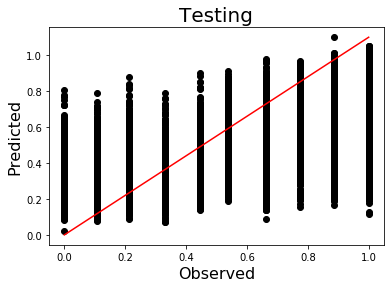

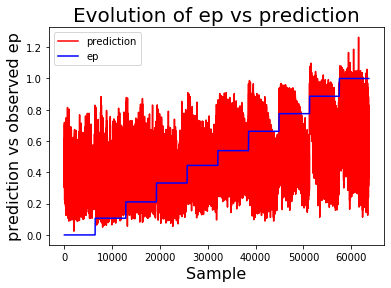

Current experiment: strains_curr_GRS02_g20.txt, Completion: 66%
[[0.00000000e+00 0.00000000e+00 2.32431035e-01]
 [1.00000000e+00 0.00000000e+00 6.16490544e-01]
 [2.00000000e+00 0.00000000e+00 3.77320982e-01]
 ...
 [1.01850000e+04 1.00000000e+00 6.75412920e-01]
 [1.01860000e+04 1.00000000e+00 5.52984828e-01]
 [1.01870000e+04 1.00000000e+00 2.66142243e-01]]
Train: [40751, 0.23743897657611285, 0.4435520170061097] 
Test: [10188, 0.243936271657204, 0.4153471752750746]


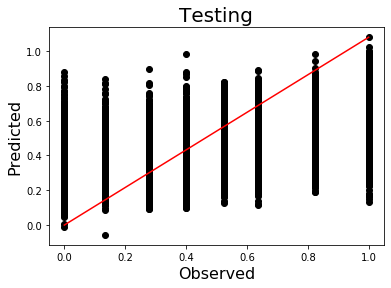

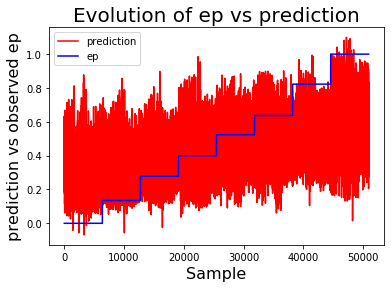

Current experiment: strains_curr_GRS03_g20.txt, Completion: 73%
[[0.00000000e+00 0.00000000e+00 3.22569823e-01]
 [1.00000000e+00 0.00000000e+00 2.63959653e-01]
 [2.00000000e+00 0.00000000e+00 1.50952028e-01]
 ...
 [9.48500000e+03 1.00000000e+00 9.54986197e-01]
 [9.48600000e+03 1.00000000e+00 8.90964364e-01]
 [9.48700000e+03 1.00000000e+00 9.85320469e-01]]
Train: [37950, 0.11892703461514342, 0.8643069044251347] 
Test: [9488, 0.12080835867077508, 0.858721087074731]


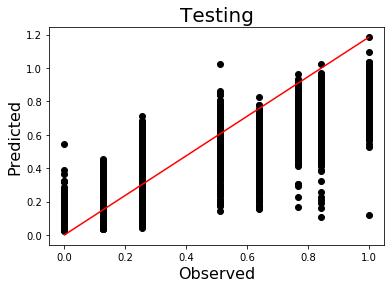

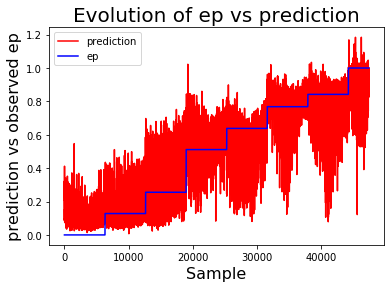

Current experiment: strains_curr_ANS02_g20.txt, Completion: 80%
[[0.00000000e+00 0.00000000e+00 3.00424414e-01]
 [1.00000000e+00 0.00000000e+00 4.16337905e-01]
 [2.00000000e+00 0.00000000e+00 3.75172223e-01]
 ...
 [1.26000000e+04 1.00000000e+00 5.82320442e-01]
 [1.26010000e+04 1.00000000e+00 4.08151319e-01]
 [1.26020000e+04 1.00000000e+00 4.93584945e-01]]
Train: [50412, 0.2785978690466739, 0.13885867686323672] 
Test: [12603, 0.28149385912330366, 0.12075433029026306]


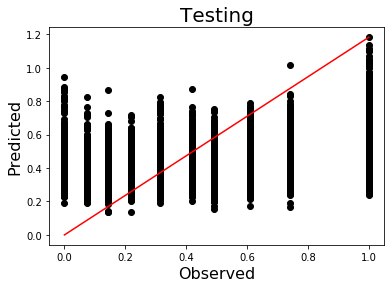

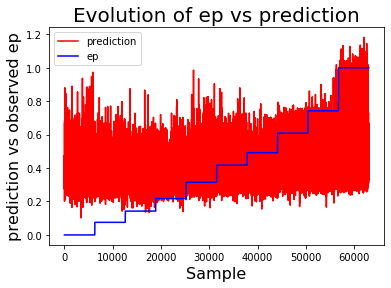

Current experiment: strains_curr_ANS03_g20.txt, Completion: 86%
[[0.00000000e+00 0.00000000e+00 3.83326780e-01]
 [1.00000000e+00 0.00000000e+00 5.45626166e-01]
 [2.00000000e+00 0.00000000e+00 3.81411598e-01]
 ...
 [1.14820000e+04 1.00000000e+00 4.06247256e-01]
 [1.14830000e+04 1.00000000e+00 4.76709057e-01]
 [1.14840000e+04 1.00000000e+00 5.69222363e-01]]
Train: [45937, 0.2801256290081312, 0.19248227456015166] 
Test: [11485, 0.28626552516437126, 0.1786241910735492]


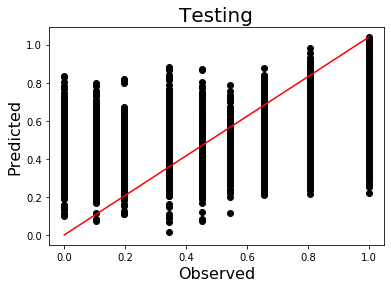

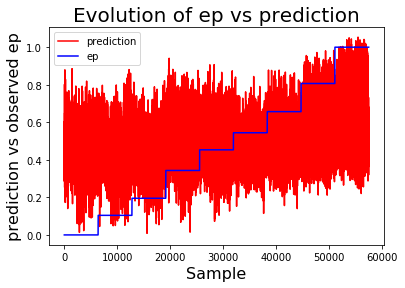

Current experiment: strains_curr_ANS04_g20.txt, Completion: 93%
[[0.00000000e+00 0.00000000e+00 1.11735436e-01]
 [1.00000000e+00 0.00000000e+00 8.95849961e-02]
 [2.00000000e+00 0.00000000e+00 1.23630188e-01]
 ...
 [2.63910000e+04 1.00000000e+00 5.34802815e-01]
 [2.63920000e+04 1.00000000e+00 2.11592511e-01]
 [2.63930000e+04 1.00000000e+00 3.03560813e-01]]
Train: [105574, 0.23342218355493088, 0.3559810288197123] 
Test: [26394, 0.2345808153806952, 0.35222168074727433]


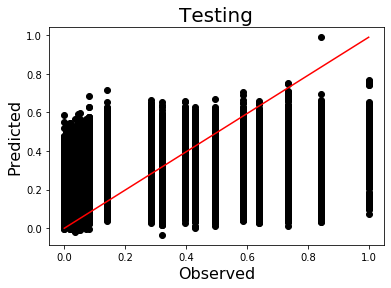

Creating legend with loc="best" can be slow with large amounts of data.


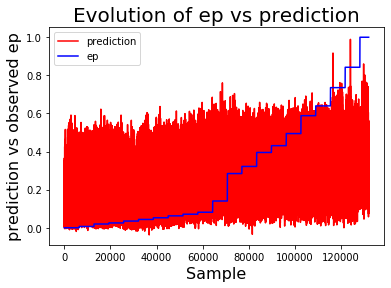

Current experiment: strains_curr_ANS05_g20.txt, Completion: 100%
[[0.00000000e+00 0.00000000e+00 5.14382892e-01]
 [1.00000000e+00 0.00000000e+00 5.03210389e-01]
 [2.00000000e+00 0.00000000e+00 5.43979013e-01]
 ...
 [8.72800000e+03 1.00000000e+00 5.50392263e-01]
 [8.72900000e+03 1.00000000e+00 3.89808187e-01]
 [8.73000000e+03 1.00000000e+00 5.17591101e-01]]
Train: [34920, 0.2743938996371279, 0.36677117080889154] 
Test: [8731, 0.28233362296890285, 0.34093161655486426]


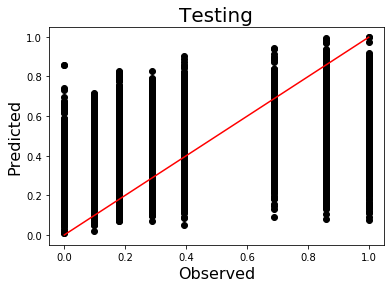

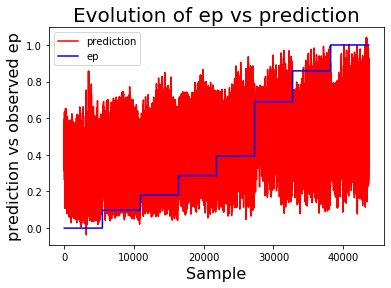

In [36]:
print(f"\nTraining nn models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

models = []
score_str = "experiment mse r2 time\n"

for i in range(num_exps):

    print("Current experiment: %s, Completion: %d%%" %(filenames[i],(100*(i+1)/num_exps)))

    dataframe, timespan = get_experiment_data(folder, filenames[i], features, target)
    #dataframe = remove_outliers(dataframe, dataframe['ep'], ['dn_p50', 'dp_p50', 'cur_p50'], threshold = 0.97, verbose=True)
    #Removing outliers
    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    train_time = time.time()
    model = train_nn_model(df_train, target, features) #other_model(df_train,target,features)
    models.append(model)
    train_time = time.time() - train_time

    train_scores = test_regression_model(model,features,target,df_train)
    test_scores = test_regression_model(model,features,target,df_test)
    
    save_test_data(model, features, target, df_test, result_folder, "TEST_prediction_dnn_"+experiments[i]+"_g"+rad+"0.txt")

    r2_train_vector[i] = train_scores[-1]
    r2_test_matrix[i,i] = test_scores[-1]

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
    np.savetxt(result_folder+nn_model_preds[i],pred_vs_observed)
    
    score_str+=(experiments[i]+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"    
    
    plot_observed_vs_predicted(df_test, target, model, features, ['Testing','Observed','Predicted'])

    plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])

save_data_by_name(score_str,result_folder,nn_model_scores)


Performing transfer learning, reprinting r2 scores 
and plotting score martix:

Train score on experiment FBL01: r2 = 0.5463575618194767
Test score: r2 = 0.5379405028260076
Train score on experiment FBL02: r2 = 0.617387706955396
Test score: r2 = 0.6119715655406672
Train score on experiment ETNA01: r2 = 0.6654732119654213
Test score: r2 = 0.6623920958577989
Train score on experiment ETNA02: r2 = 0.6289809425043009
Test score: r2 = 0.6245921757583539
Train score on experiment MONZ04: r2 = 0.3083434080379833
Test score: r2 = 0.3045748967509808
Train score on experiment MONZ05: r2 = 0.41094737380294577
Test score: r2 = 0.3975162439070026
Train score on experiment WG01: r2 = 0.46712092866437205
Test score: r2 = 0.4473676741386782
Train score on experiment WG02: r2 = 0.43401435372963526
Test score: r2 = 0.42004971650471934
Train score on experiment WG04: r2 = 0.43587786688306807
Test score: r2 = 0.43761375354910126
Train score on experiment GRS02: r2 = 0.4435520170061097
Test score: r2 = 0.

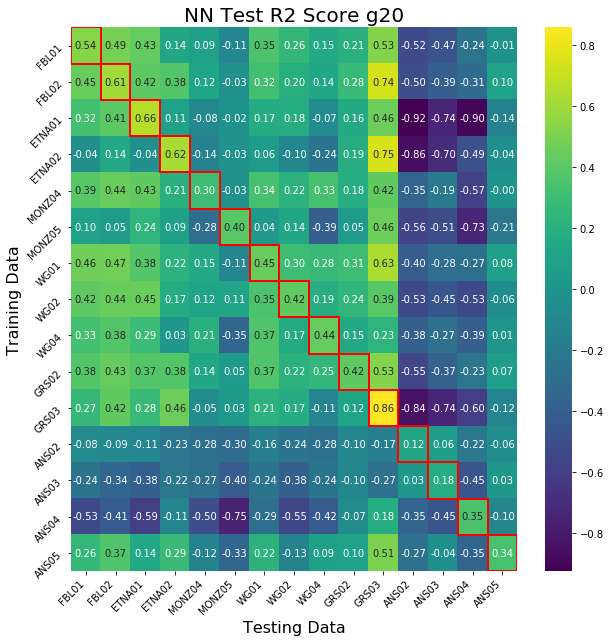

In [37]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")
for i in range(len(models)):
    for j in range(num_exps):
        if j != i:
            dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
            scores = test_regression_model(models[i], features, target,dataframe)
            r2_test_matrix[i,j] = scores[-1]


    print(f"Train score on experiment {experiments[i]}: r2 = {r2_train_vector[i]}\nTest score: r2 = {r2_test_matrix[i,i]}")

plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["NN Test R2 Score g20", "Testing Data", "Training Data"],savename='../Figures1/strain_single_transfer_dnn_g20')
np.savetxt(result_folder+nn_model_score_matrix,r2_test_matrix)

Our initial result was terrible compared to xgboost, but we could attempt using a different activation function or use regularization.

RESULTS AFTER TUNING THE NETWORK: Performance on the smaller dataset is still not that good, however testing the network on the larger g20 dataset we now see comparable results to xgboost.

More tuning led to a very reasonable performance on both datasets!


Combining datasets to evaluate effect on model and performance

Datasets used for training: ['strains_curr_FBL01_g20.txt', 'strains_curr_FBL02_g20.txt']
Train: [92436, 0.20156226997909304, 0.5834578709123861] 
Test: [23109, 0.20236510954431441, 0.5808932722800866]


Creating legend with loc="best" can be slow with large amounts of data.


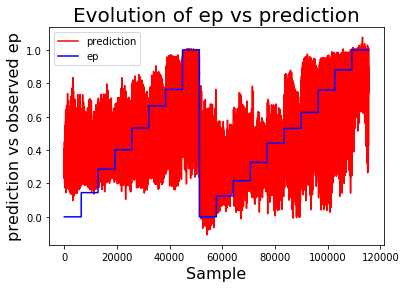


Datasets used for training: ['strains_curr_FBL01_g20.txt', 'strains_curr_ETNA01_g20.txt']
Train: [83534, 0.19898887433109472, 0.6052431930140411] 
Test: [20884, 0.19945864266533395, 0.6023675740271727]


Creating legend with loc="best" can be slow with large amounts of data.


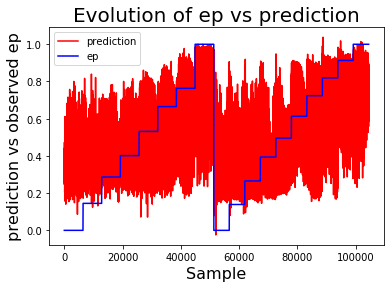


Datasets used for training: ['strains_curr_MONZ05_g20.txt', 'strains_curr_WG01_g20.txt']
Train: [94838, 0.23727557295833754, 0.4093212294702292] 
Test: [23710, 0.23894208268155864, 0.3981901515713956]


Creating legend with loc="best" can be slow with large amounts of data.


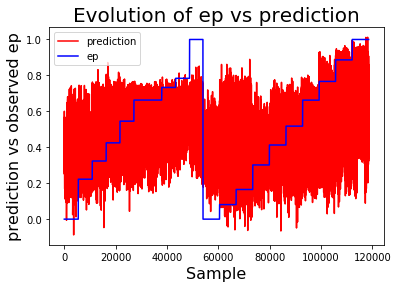


Datasets used for training: ['strains_curr_MONZ05_g20.txt', 'strains_curr_WG02_g20.txt']
Train: [94868, 0.23370746869887307, 0.4077688265534286] 
Test: [23718, 0.23465462098459464, 0.39458276071233545]


Creating legend with loc="best" can be slow with large amounts of data.


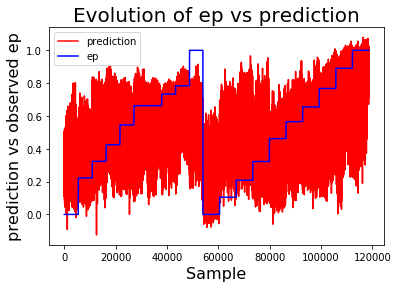


Datasets used for training: ['strains_curr_GRS02_g20.txt', 'strains_curr_GRS03_g20.txt']
Train: [78701, 0.19006582963687707, 0.6481621354422579] 
Test: [19676, 0.19479284220018347, 0.6311410226301168]


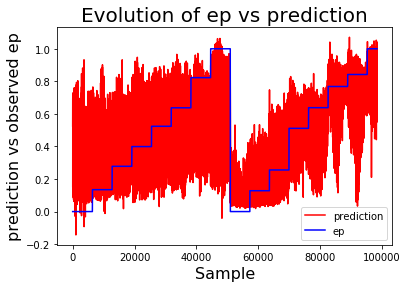


Datasets used for training: ['strains_curr_GRS03_g20.txt', 'strains_curr_ANS04_g20.txt']
Train: [143524, 0.21033042749305128, 0.5469389072072917] 
Test: [35882, 0.21119552026227678, 0.5451291662424702]


Creating legend with loc="best" can be slow with large amounts of data.


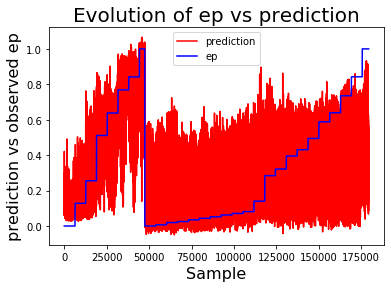


Datasets used for training: ['strains_curr_GRS03_g20.txt', 'strains_curr_ANS02_g20.txt']
Train: [88362, 0.22628519370802594, 0.4782903878873279] 
Test: [22091, 0.22976527166255145, 0.4544059119729187]


Creating legend with loc="best" can be slow with large amounts of data.


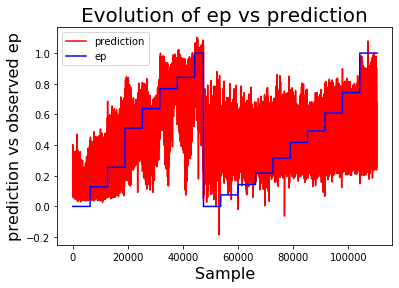


Datasets used for training: ['strains_curr_GRS03_g20.txt', 'strains_curr_ANS03_g20.txt']
Train: [83888, 0.2241566608102193, 0.5009197077654386] 
Test: [20972, 0.22863528391929405, 0.4836523178581519]


Creating legend with loc="best" can be slow with large amounts of data.


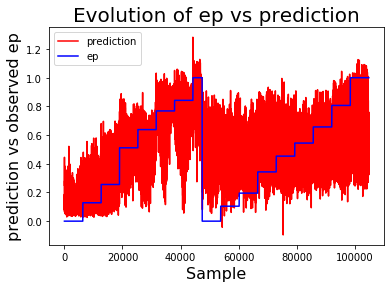


Datasets used for training: ['strains_curr_GRS02_g20.txt', 'strains_curr_GRS03_g20.txt', 'strains_curr_ANS03_g20.txt', 'strains_curr_ANS04_g20.txt']
Train: [230213, 0.23636491540078466, 0.4534015041105084] 
Test: [57554, 0.2400471166050446, 0.4359562092338558]


Creating legend with loc="best" can be slow with large amounts of data.


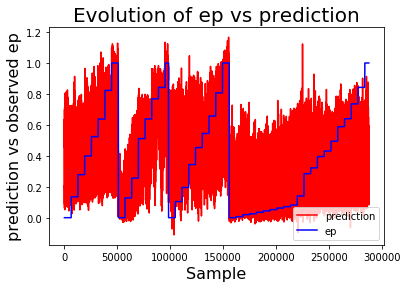

In [38]:
print("\nCombining datasets to evaluate effect on model and performance")
#['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']
filelist = [ [ filenames[0], filenames[1] ] , [ filenames[0], filenames[2] ], [ filenames[5], filenames[6] ], [ filenames[5], filenames[7] ], [ filenames[9], filenames[10] ], [ filenames[10], filenames[13] ], [ filenames[10], filenames[11] ], [ filenames[10], filenames[12] ], [ filenames[9], filenames[10], filenames[12], filenames[13] ] ] #THIS IS INEFFICIENT, BUT SUFFICIENT FOR TESTING
experimentlist = [ [ experiments[0], experiments[1] ] , [ experiments[0], experiments[2] ], [ experiments[5], experiments[6] ], [ experiments[5], experiments[7] ], [ experiments[9], experiments[10] ], [ experiments[10], experiments[13] ], [ experiments[10], experiments[11] ], [ experiments[10], experiments[12] ], [ experiments[9], experiments[10], experiments[12], experiments[13] ] ]
num_train_sets = len(filelist)

#fbl-etna
#monz-wg
#grs-ans

multi_models = []

r2_multi_test_matrix = np.zeros((num_train_sets,num_exps))

for i in range(num_train_sets):
    print(f"\nDatasets used for training: {filelist[i]}")
    dataframe, timespan = get_experiment_data(folder, filelist[i], features, target)

    df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

    multi_model = train_nn_model(df_train, target, features) #other_model(df_train,target,features)
    multi_models.append(multi_model)

    train_scores = test_regression_model(multi_model,features,target,df_train)
    test_scores = test_regression_model(multi_model,features,target,df_test)

    print(f"Train: {train_scores}", f"\nTest: {test_scores}")

    plot_feature_vs_prediction(dataframe, 'ep', multi_model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
    
    for j in range(num_exps):
        dataframe, timespan = get_experiment_data(folder, filenames[j], features, target)
        scores = test_regression_model(multi_models[i], features, target,dataframe)
        r2_multi_test_matrix[i,j] = scores[-1]

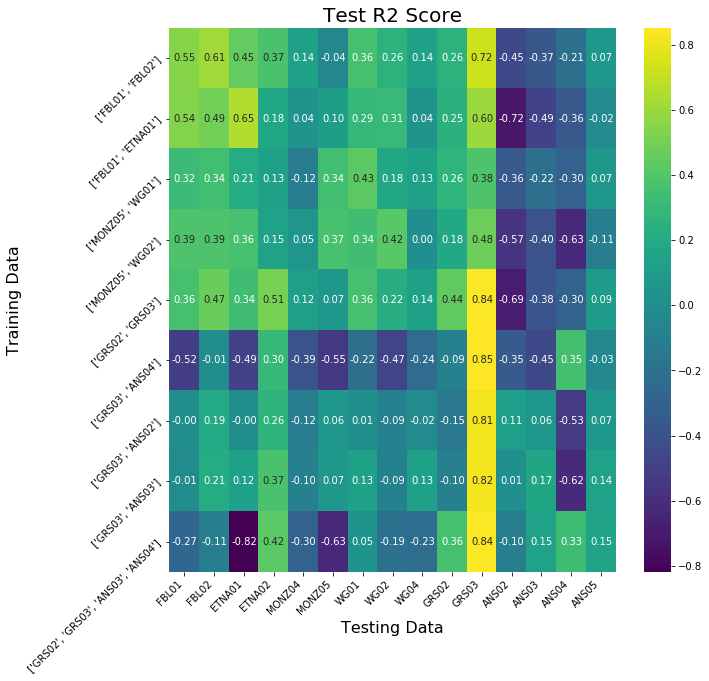

In [39]:
plot_sns_score_matrix(r2_multi_test_matrix,experimentlist,experiments,["Test R2 Score", "Testing Data", "Training Data"], diagonal=False)

First thought when reiewing the results is that the model could be very sensistive to outliers. Allthemore a good reason to find a good system for removing them.

My thought after attempting to remove outliers is that we should try something else instead.

Another thing to note is that the multiple dataset transfer learning is not as good for NN at g20 as XGB at g50, however this may be an effect of the datasets, which hould be tested.

### SVM on high resolution datasets (slow)

I am expecting a very slow and low performing method here, it did not progress after 2 hours so i terminated the process, there seems to be nothing to gain from using the method this way.

### Combining rocktypes

In this section we lookat training models on all datasets within one rock type, then training models across two rock types, looking at their test scores to see the extent of physical information about the rocks our models can pick up.

In [40]:
folder = '../strain_data_MS/' #rename experiment_folder -> add result_folder

experiments = ['FBL01', 'FBL02', 'ETNA01', 'ETNA02', 'MONZ04', 'MONZ05', 'WG01', 'WG02', 'WG04', 'GRS02', 'GRS03', 'ANS02', 'ANS03', 'ANS04', 'ANS05']

sandstone = [i for i in experiments if 'FBL' in i]
basalt = [i for i in experiments if 'ETNA' in i]
monzonite = [i for i in experiments if 'MONZ' in i]
granite = [i for i in experiments if 'WG' in i]
shale = [i for i in experiments if 'GRS' in i]
limestone = [i for i in experiments if 'ANS' in i]
rock_list = [sandstone, basalt, monzonite, granite, shale, limestone]
rock_names = ['sandstone', 'basalt', 'monzonite', 'granite', 'shale', 'limestone']
combined_names = []

#features = ['dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum']
features = ['dn_p90', 'dn_p75', 'dn_p50', 'dn_mean', 'dn_p25', 'dn_p10', 'dn_std', 'dn_num', 'dn_sum', 'dp_p90', 'dp_p75', 'dp_p50', 'dp_mean', 'dp_p25', 'dp_p10', 'dp_std', 'dp_num', 'dp_sum', 'cur_p90', 'cur_p75', 'cur_p50', 'cur_mean', 'cur_p25', 'cur_p10', 'cur_std', 'cur_num', 'cur_sum']
rad = '5' #Experiment resolutions 5 and 2
target = "ep" #"sigD2" #save as strain if ep, stress elif sigD2, else dont save NOT IMPLEMENTED


result_folder = '../strain_model_output_MS/'
model_score_matrix = 'rock_type_transfer_learning_score_matrix_xgb_g'+rad+'0.txt'
#model_preds = ['result_xgb_COMBINED'+experiment+'_g'+rad+'0.txt' for experiment in experiments] #filenames for saved data

conf = config()

model_permutations = []


Training xgb models on 21 combinations of rocktypes, testing on each dataset. 
Storing models for later transfer learning:

Training on and testing on single rock type: sandstone
['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt']


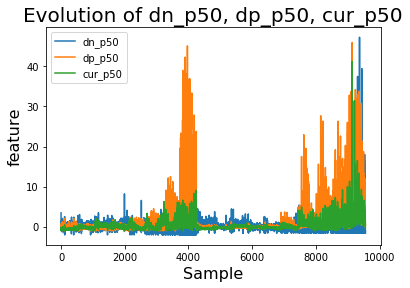

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


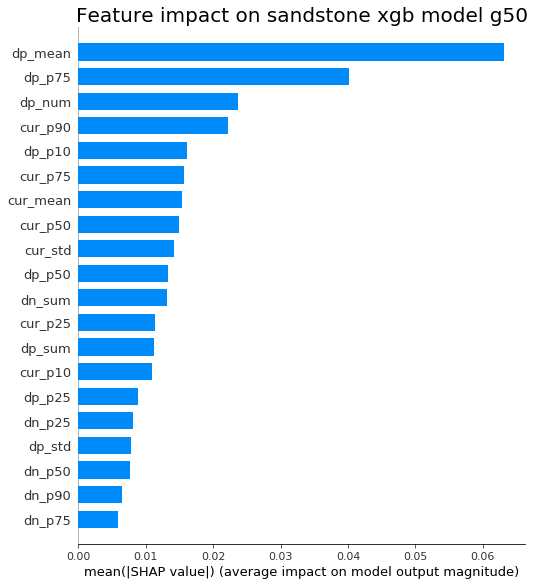

Train on sandstone with training score: 0.8381964155439198 
Test on sandstone with score: 0.7207210313467902


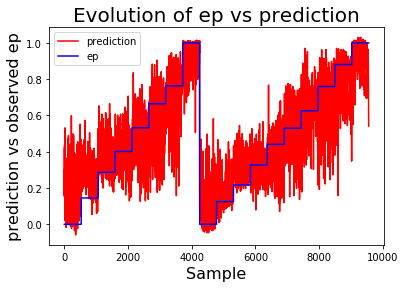

Combining experiment: sandstone and basalt
['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt', 'strains_curr_ETNA01_g50.txt', 'strains_curr_ETNA02_g50.txt']


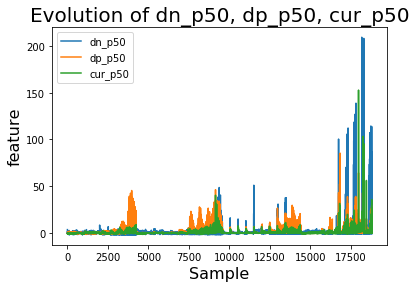

Checking train test split: Points in sandstone: 1935, Points in basalt: 1823, 
Split at 20%, Proportion of points: 0.20003193697769733
Train on sandstone and basalt with score: 0.8164514490432866 
Test on sandstone: 0.695706656229648 
Test on basalt: 0.7051770590773936


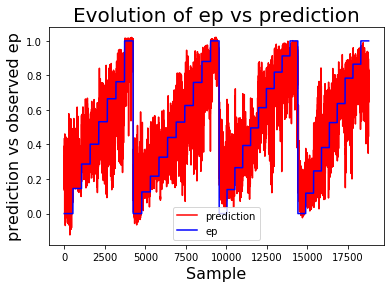

Combining experiment: sandstone and monzonite
['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt', 'strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt']


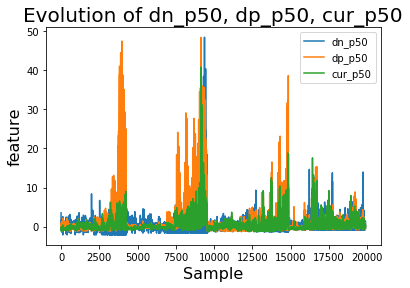

Checking train test split: Points in sandstone: 1871, Points in monzonite: 2105, 
Split at 20%, Proportion of points: 0.2
Train on sandstone and monzonite with score: 0.7444948102451885 
Test on sandstone: 0.6755064668859301 
Test on monzonite: 0.42220071457495423


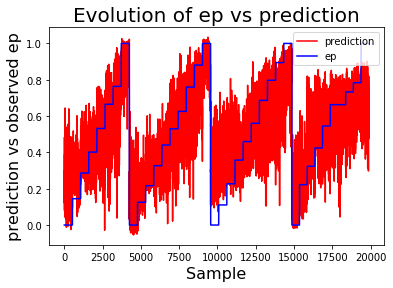

Combining experiment: sandstone and granite
['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt', 'strains_curr_WG01_g50.txt', 'strains_curr_WG02_g50.txt', 'strains_curr_WG04_g50.txt']


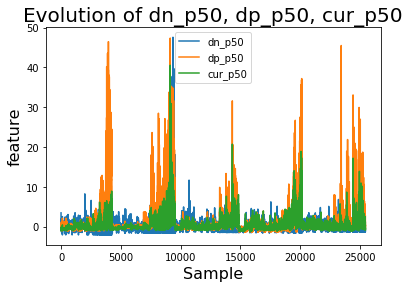

Checking train test split: Points in sandstone: 1938, Points in granite: 3158, 
Split at 20%, Proportion of points: 0.20001569981945208
Train on sandstone and granite with score: 0.7492668372686786 
Test on sandstone: 0.660037303476819 
Test on granite: 0.5495242840003962


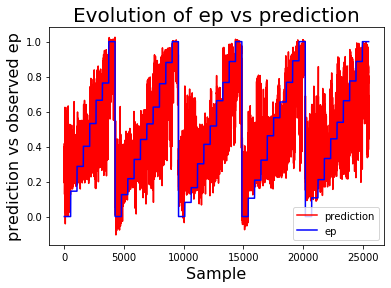

Combining experiment: sandstone and shale
['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt', 'strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']


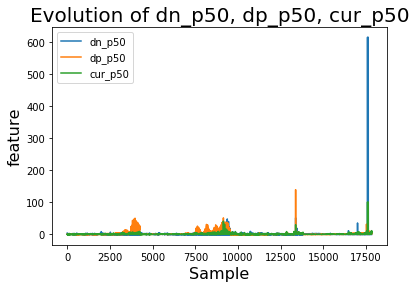

Checking train test split: Points in sandstone: 1914, Points in shale: 1651, 
Split at 20%, Proportion of points: 0.2
Train on sandstone and shale with score: 0.8603483973197632 
Test on sandstone: 0.7093151342113058 
Test on shale: 0.7905024481945573


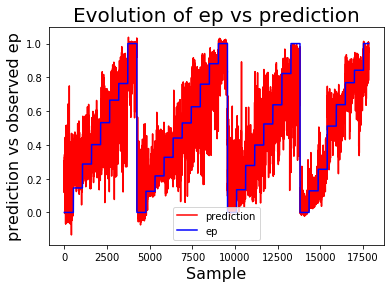

Combining experiment: sandstone and limestone
['strains_curr_FBL01_g50.txt', 'strains_curr_FBL02_g50.txt', 'strains_curr_ANS02_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt', 'strains_curr_ANS05_g50.txt']


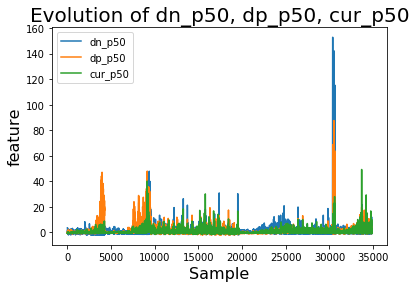

Checking train test split: Points in sandstone: 1878, Points in limestone: 5092, 
Split at 20%, Proportion of points: 0.2
Train on sandstone and limestone with score: 0.6695145575321135 
Test on sandstone: 0.6519997861350159 
Test on limestone: 0.42098748952450027


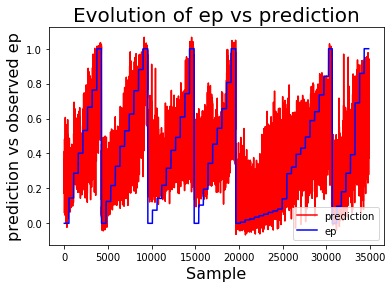

Training on and testing on single rock type: basalt
['strains_curr_ETNA01_g50.txt', 'strains_curr_ETNA02_g50.txt']


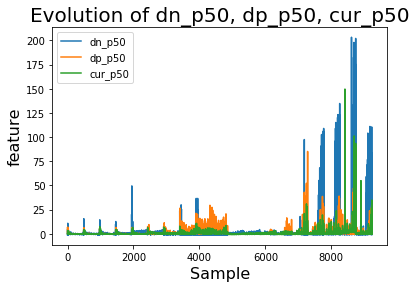

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


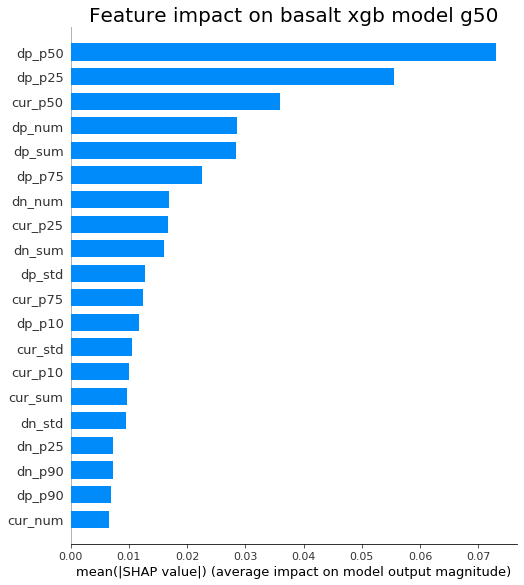

Train on basalt with training score: 0.8276813244408615 
Test on basalt with score: 0.7038751367922146


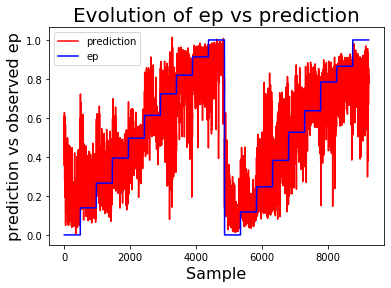

Combining experiment: basalt and monzonite
['strains_curr_ETNA01_g50.txt', 'strains_curr_ETNA02_g50.txt', 'strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt']


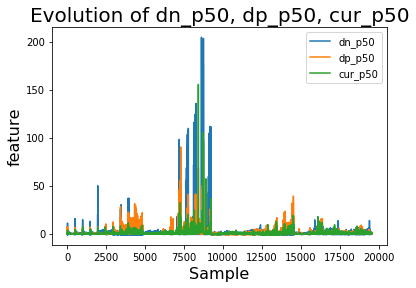

Checking train test split: Points in basalt: 1804, Points in monzonite: 2108, 
Split at 20%, Proportion of points: 0.20003067955207854
Train on basalt and monzonite with score: 0.7482333402782784 
Test on basalt: 0.6871834766453913 
Test on monzonite: 0.41028603522617524


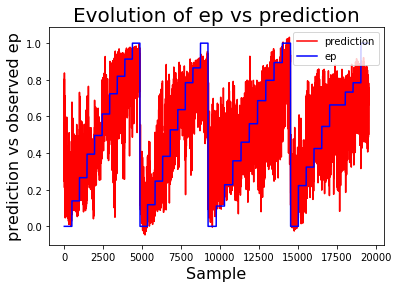

Combining experiment: basalt and granite
['strains_curr_ETNA01_g50.txt', 'strains_curr_ETNA02_g50.txt', 'strains_curr_WG01_g50.txt', 'strains_curr_WG02_g50.txt', 'strains_curr_WG04_g50.txt']


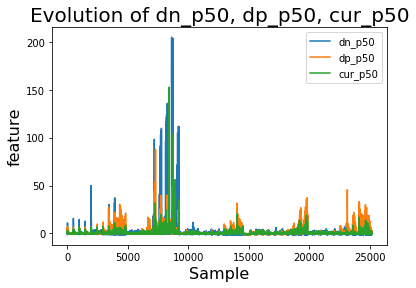

Checking train test split: Points in basalt: 1871, Points in granite: 3160, 
Split at 20%, Proportion of points: 0.2
Train on basalt and granite with score: 0.7487562077419477 
Test on basalt: 0.6559370949811905 
Test on granite: 0.5544622675263826


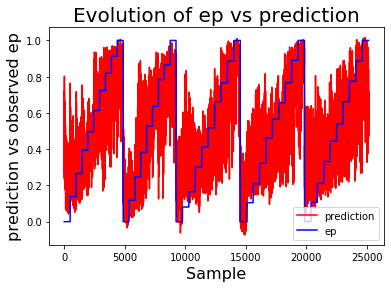

Combining experiment: basalt and shale
['strains_curr_ETNA01_g50.txt', 'strains_curr_ETNA02_g50.txt', 'strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']


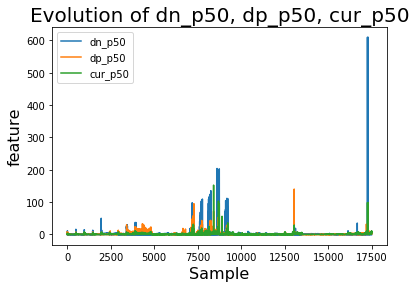

Checking train test split: Points in basalt: 1818, Points in shale: 1683, 
Split at 20%, Proportion of points: 0.20003428179636612
Train on basalt and shale with score: 0.8553493638587191 
Test on basalt: 0.7128799035443767 
Test on shale: 0.8135758159214882


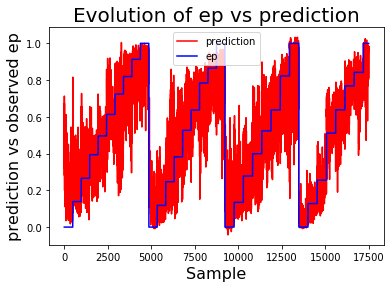

Combining experiment: basalt and limestone
['strains_curr_ETNA01_g50.txt', 'strains_curr_ETNA02_g50.txt', 'strains_curr_ANS02_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt', 'strains_curr_ANS05_g50.txt']


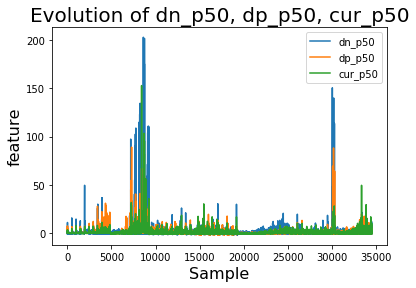

Checking train test split: Points in basalt: 1880, Points in limestone: 5026, 
Split at 20%, Proportion of points: 0.20001737770440525
Train on basalt and limestone with score: 0.6732604468070638 
Test on basalt: 0.6155541607191329 
Test on limestone: 0.41161223272494374


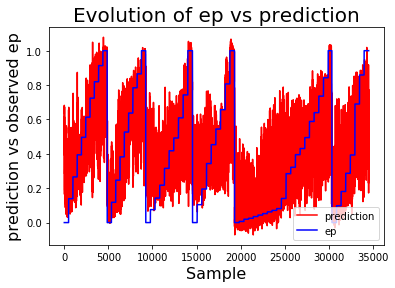

Training on and testing on single rock type: monzonite
['strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt']


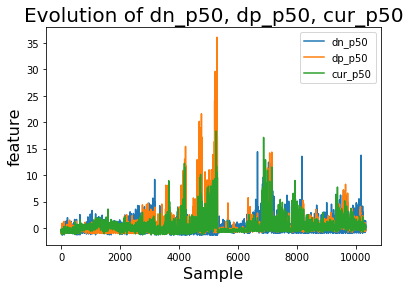

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


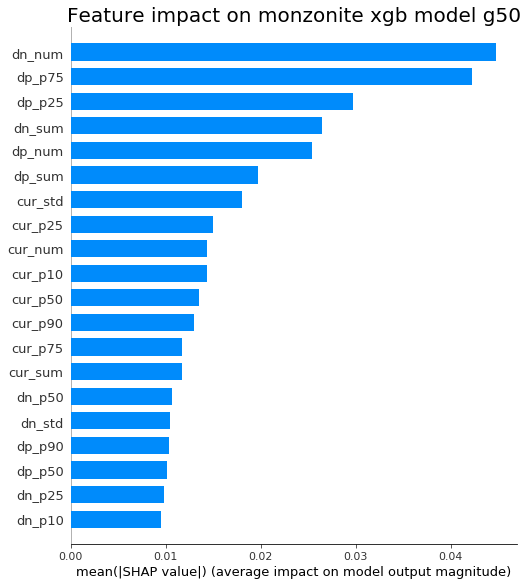

Train on monzonite with training score: 0.7282802118005639 
Test on monzonite with score: 0.49144776198575535


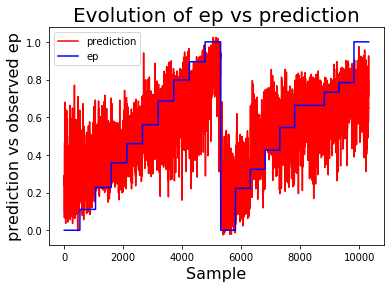

Combining experiment: monzonite and granite
['strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt', 'strains_curr_WG01_g50.txt', 'strains_curr_WG02_g50.txt', 'strains_curr_WG04_g50.txt']


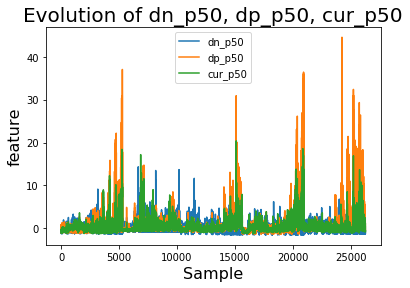

Checking train test split: Points in monzonite: 2036, Points in granite: 3214, 
Split at 20%, Proportion of points: 0.20001523925632428
Train on monzonite and granite with score: 0.6941999259287566 
Test on monzonite: 0.4123671380147782 
Test on granite: 0.5547143733764428


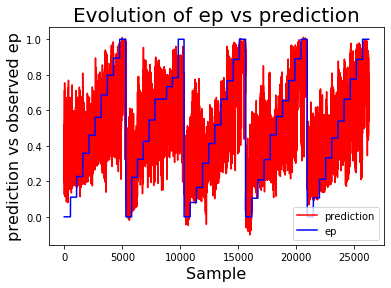

Combining experiment: monzonite and shale
['strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt', 'strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']


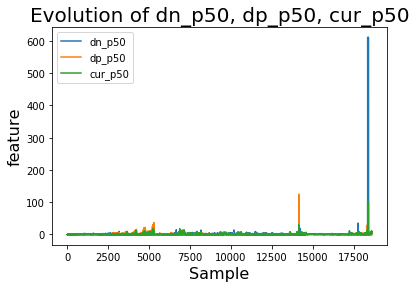

Checking train test split: Points in monzonite: 2027, Points in shale: 1692, 
Split at 20%, Proportion of points: 0.2
Train on monzonite and shale with score: 0.7831273229174618 
Test on monzonite: 0.45431861150108255 
Test on shale: 0.8139749358558648


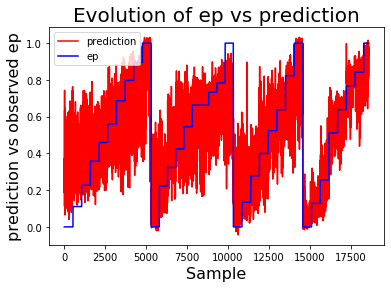

Combining experiment: monzonite and limestone
['strains_curr_MONZ04_g50.txt', 'strains_curr_MONZ05_g50.txt', 'strains_curr_ANS02_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt', 'strains_curr_ANS05_g50.txt']


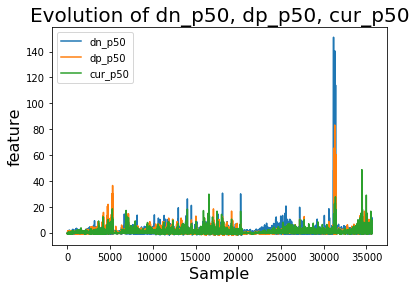

Checking train test split: Points in monzonite: 2061, Points in limestone: 5063, 
Split at 20%, Proportion of points: 0.2
Train on monzonite and limestone with score: 0.6060640617022581 
Test on monzonite: 0.3015555625900044 
Test on limestone: 0.39804639569525957


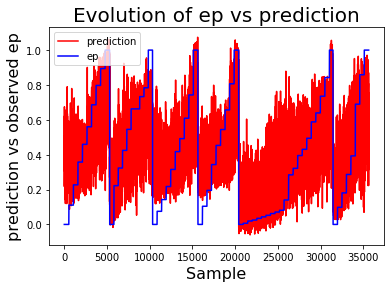

Training on and testing on single rock type: granite
['strains_curr_WG01_g50.txt', 'strains_curr_WG02_g50.txt', 'strains_curr_WG04_g50.txt']


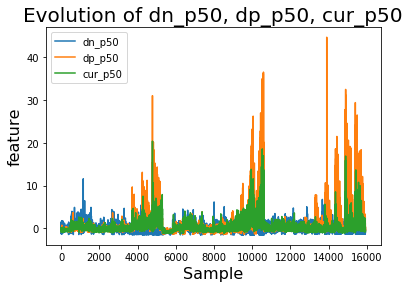

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


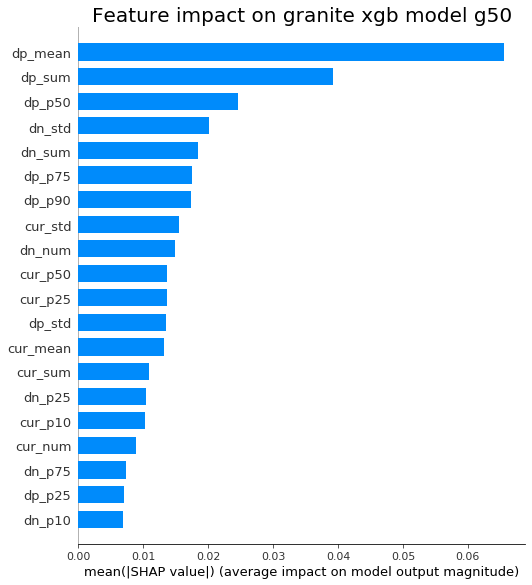

Train on granite with training score: 0.7671350750127386 
Test on granite with score: 0.5787569556258263


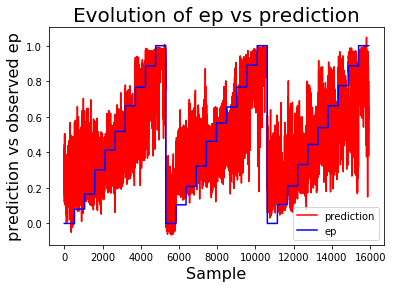

Combining experiment: granite and shale
['strains_curr_WG01_g50.txt', 'strains_curr_WG02_g50.txt', 'strains_curr_WG04_g50.txt', 'strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']


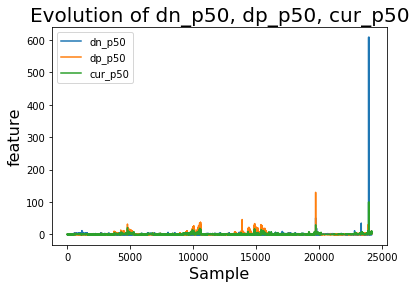

Checking train test split: Points in granite: 3171, Points in shale: 1668, 
Split at 20%, Proportion of points: 0.20001653370809738
Train on granite and shale with score: 0.7848041346964532 
Test on granite: 0.5668278411234999 
Test on shale: 0.809388433177789


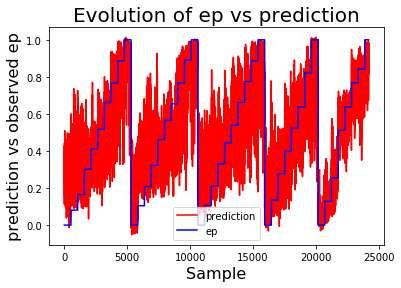

Combining experiment: granite and limestone
['strains_curr_WG01_g50.txt', 'strains_curr_WG02_g50.txt', 'strains_curr_WG04_g50.txt', 'strains_curr_ANS02_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt', 'strains_curr_ANS05_g50.txt']


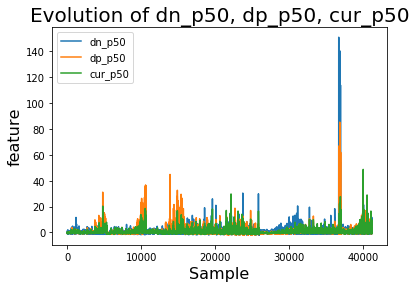

Checking train test split: Points in granite: 3205, Points in limestone: 5039, 
Split at 20%, Proportion of points: 0.20000970449803485
Train on granite and limestone with score: 0.6282567736913536 
Test on granite: 0.51740346035881 
Test on limestone: 0.4040393690574231


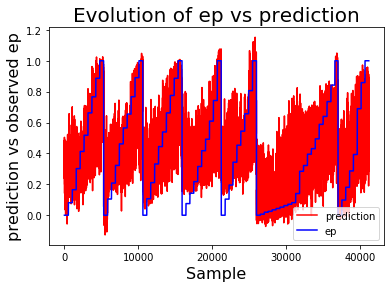

Training on and testing on single rock type: shale
['strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt']


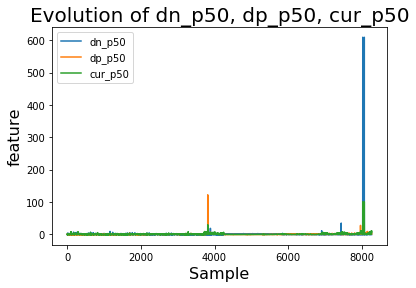

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


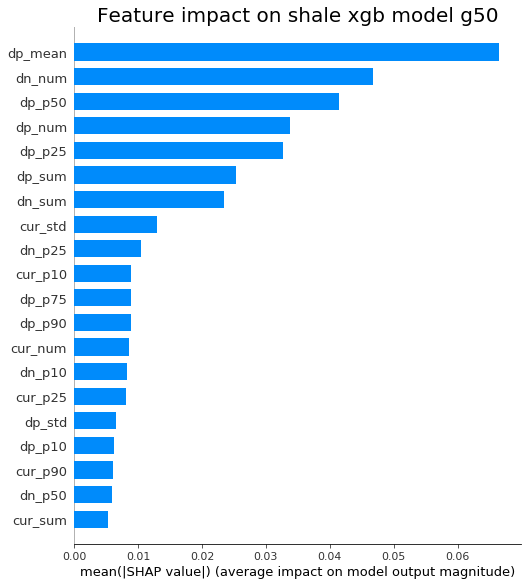

Train on shale with training score: 0.9048305567255682 
Test on shale with score: 0.8224175805059777


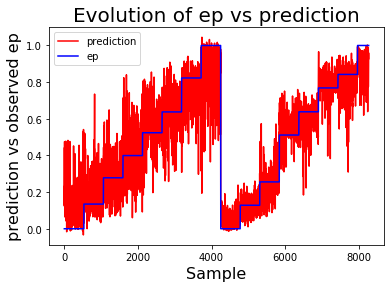

Combining experiment: shale and limestone
['strains_curr_GRS02_g50.txt', 'strains_curr_GRS03_g50.txt', 'strains_curr_ANS02_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt', 'strains_curr_ANS05_g50.txt']


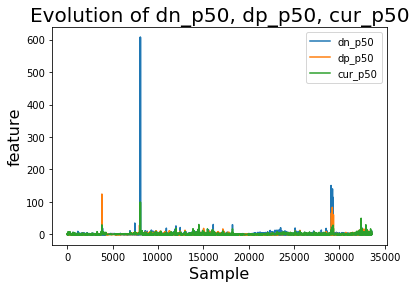

Checking train test split: Points in shale: 1638, Points in limestone: 5075, 
Split at 20%, Proportion of points: 0.2
Train on shale and limestone with score: 0.6843481101412245 
Test on shale: 0.736757820412282 
Test on limestone: 0.4209862647355517


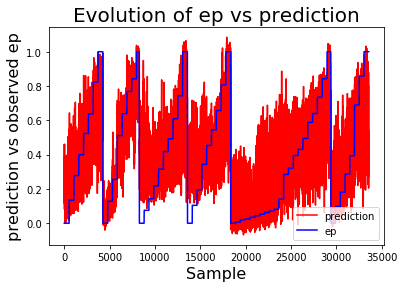

Training on and testing on single rock type: limestone
['strains_curr_ANS02_g50.txt', 'strains_curr_ANS03_g50.txt', 'strains_curr_ANS04_g50.txt', 'strains_curr_ANS05_g50.txt']


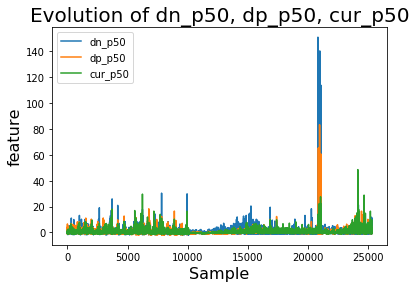

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


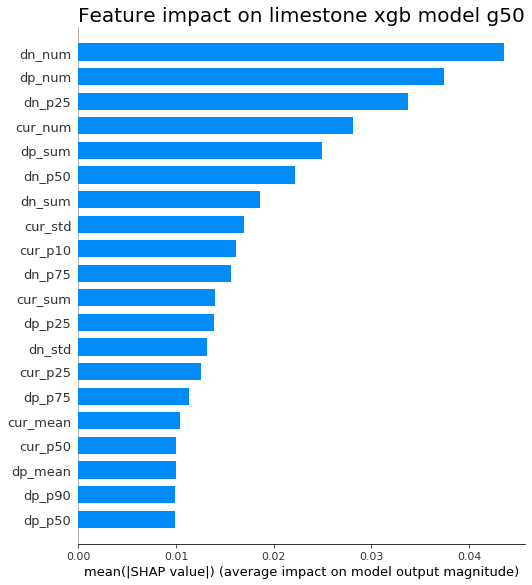

Train on limestone with training score: 0.653828338386824 
Test on limestone with score: 0.44712201172652755


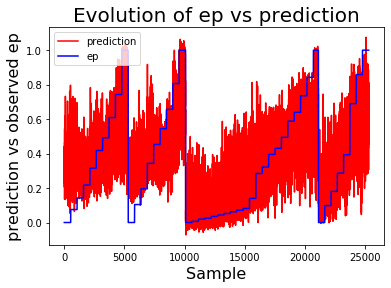

In [41]:
num_models = 0

r2_train_vector = np.zeros(len(rock_list))
#r2_test_matrix = np.zeros((len(rock_list),len(rock_list)))

comb_len = sum([len(rock_list)-i for i in range(len(rock_list))])
r2_rock_matrix = np.zeros((comb_len,len(rock_list)))

print(f"\nTraining xgb models on {comb_len} combinations of rocktypes, testing on each dataset. \nStoring models for later transfer learning:\n")

for i in range(len(rock_list)):
    for j in range(i,len(rock_list)):
        #print(i,j)
        if j == i:
            #train the model on single rock type and store test score
            print(f"Training on and testing on single rock type: {rock_names[i]}")

            
            filenames = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in rock_list[i]]
            print(filenames)
        
            dataframe, timespan = get_experiment_data(folder, filenames, features, target)
            
            combined_names.append(rock_names[i])
            
            
        else:
            #train the model on multiple rock types and store test score
            print(f"Combining experiment: {rock_names[i]} and {rock_names[j]}")
            
            filenames1 = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in rock_list[i]]
            filenames2 = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in rock_list[j]]
            print(filenames1+filenames2)

            dataframe, timespan, index_1 = get_experiment_data(folder, filenames1+filenames2, features, target, indices=True)
                        
            rock_str = rock_names[i] + " and " + rock_names[j]
            combined_names.append(rock_str)
        
        df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

        
        plot_data_time_evolutions(dataframe, [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'Sample','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
        
        train_time = time.time()
        model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
        model_permutations.append(model)
        train_time = time.time() - train_time
    
        #with open(saved_models[i], 'wb') as file:
        #    pickle.dump(model,file)
        if j == i:        
            shap_vals = represent_model_results(model,df_train,features,target,'Feature impact on '+rock_names[i]+ ' xgb model g'+rad+'0', result_folder+'rock_type_transfer_shap_vals_xgb_'+rock_names[i]+'_g'+rad+'0')
            
    
        train_scores = test_regression_model(model,features,target,df_train)
        r2_train_vector[i] = train_scores[-1]
        
        if j == i:
            test_scores = test_regression_model(model,features,target,df_test)
            r2_rock_matrix[num_models,i] = test_scores[-1]
            print(f"Train on {rock_names[i]} with training score: {r2_train_vector[i]}", f"\nTest on {rock_names[i]} with score: {r2_rock_matrix[num_models,i]}")
            
        else:
            ind_list1 = []
            ind_list2 = []
            for ind in df_test.index: #store index array which splits the test points
                if ind < index_1:
                    #print(ind)
                    ind_list1.append(ind)
                else:
                    ind_list2.append(ind)
            
            print("Checking train test split:", f"Points in {rock_names[i]}: {len(ind_list1)},", f"Points in {rock_names[j]}: {len(ind_list2)},", f"\nSplit at 20%, Proportion of points: {(len(ind_list1)+len(ind_list2))/len(dataframe)}" )
            
            df_test1 = df_test.loc[ind_list1]
            df_test2 = df_test.loc[ind_list2]
            
            test_scores1 = test_regression_model(model,features,target,df_test1)
            test_scores2 = test_regression_model(model,features,target,df_test2)

            r2_rock_matrix[num_models,i] = test_scores1[-1]
            r2_rock_matrix[num_models,j] = test_scores2[-1]
            
            print(f"Train on {rock_names[i]} and {rock_names[j]} with score: {r2_train_vector[i]}", f"\nTest on {rock_names[i]}: {r2_rock_matrix[num_models,i]}", f"\nTest on {rock_names[j]}: {r2_rock_matrix[num_models,j]}")
        
        
        num_models += 1

        plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])


An important aspect of the models to note is the fact that not all rock types have the same amount of data which means that we may suffer from a bias in our model that leads to worse scores than expected. I think we can see this in action with the Shale and Limestone combined data, where the increase in performance is a bit less than what we might expect when looking at some of our previuos results in the transfer learning with multiple datasets. Here we see that the improvement in performance is less than 

In [42]:
"""
print(f"\nTraining xgb models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")

score_str = "experiment1 experiment2 mse r2 time\n"

num_models = 0
i = 0
for data1, exp1 in zip(filenames,experiments):
    
    print("Removing dataset %s, Completion: %d%%" %(experiments2[0],(100*(i+1)/num_exps)))
    filenames2.remove(filenames2[0])
    experiments2.remove(experiments2[0])
    i += 1
    print("New list:")
    print(filenames2)
    print("\n")
    
    if len(filenames2) >= 2:
        for data2, exp2 in zip(filenames2,experiments2):
            num_models += 1
            print("Combining experiment: %s and %s" %(data1,data2))

            dataframe, timespan = get_experiment_data(folder, [data1, data2], features, target)
        
            df_train, df_test = train_test_split(dataframe, test_size=conf['model_details']['test_size'])

        
            plot_data_time_evolutions(dataframe, [features[2],features[11],features[20]], ['Evolution of '+features[2]+', '+features[11]+', '+features[20],'Sample','feature']) #This is a dumb way to do it: features[2] if we use the small featurelist
        
            train_time = time.time()
            model = train_xgb_model(df_train, target, features, conf) #other_model(df_train,target,features)
            model_permutations.append(model)
            train_time = time.time() - train_time
    
            #with open(saved_models[i], 'wb') as file:
            #    pickle.dump(model,file)
    
        
            train_scores = test_regression_model(model,features,target,df_train)
            test_scores = test_regression_model(model,features,target,df_test)

            r2_train_vector[i] = train_scores[-1]
            r2_test_matrix[i,i] = test_scores[-1]

            print(f"Train: {train_scores}", f"\nTest: {test_scores}")

            #pred_vs_observed = np.column_stack((model.predict(dataframe[features]),dataframe['ep']))
        
            score_str+=(exp1+" "+exp2+" "+str(test_scores[1])+" "+str(test_scores[2]))+" "+str(train_time)+"\n"    

            plot_feature_vs_prediction(dataframe, 'ep', model.predict(dataframe[features]), ['Evolution of '+'ep'+' vs prediction','Sample','prediction vs observed ep'])
        
save_data_by_name(score_str,result_folder,model_scores)
"""

'\nprint(f"\nTraining xgb models on {num_exps} experiments, testing on same dataset. \nStoring models for later transfer learning:\n")\n\nscore_str = "experiment1 experiment2 mse r2 time\n"\n\nnum_models = 0\ni = 0\nfor data1, exp1 in zip(filenames,experiments):\n    \n    print("Removing dataset %s, Completion: %d%%" %(experiments2[0],(100*(i+1)/num_exps)))\n    filenames2.remove(filenames2[0])\n    experiments2.remove(experiments2[0])\n    i += 1\n    print("New list:")\n    print(filenames2)\n    print("\n")\n    \n    if len(filenames2) >= 2:\n        for data2, exp2 in zip(filenames2,experiments2):\n            num_models += 1\n            print("Combining experiment: %s and %s" %(data1,data2))\n\n            dataframe, timespan = get_experiment_data(folder, [data1, data2], features, target)\n        \n            df_train, df_test = train_test_split(dataframe, test_size=conf[\'model_details\'][\'test_size\'])\n\n        \n            plot_data_time_evolutions(dataframe, [features

This is some simple but involved combinatorics! The logistical challenge of making this into a proper plot comes later!


Performing transfer learning, reprinting r2 scores 
and plotting score martix:

Trained on sandstone, Tested on ['ETNA01', 'ETNA02'] 
 score: r2 = 0.41576841279870913
Trained on sandstone, Tested on ['MONZ04', 'MONZ05'] 
 score: r2 = 0.10160515071728304
Trained on sandstone, Tested on ['WG01', 'WG02', 'WG04'] 
 score: r2 = 0.2586299093656268
Trained on sandstone, Tested on ['GRS02', 'GRS03'] 
 score: r2 = 0.4921688850679624
Trained on sandstone, Tested on ['ANS02', 'ANS03', 'ANS04', 'ANS05'] 
 score: r2 = -0.19777253871303913
1
Trained on sandstone and basalt, Tested on ['MONZ04', 'MONZ05'] 
 score: r2 = 0.12893331352545445
Trained on sandstone and basalt, Tested on ['WG01', 'WG02', 'WG04'] 
 score: r2 = 0.24921711370019495
Trained on sandstone and basalt, Tested on ['GRS02', 'GRS03'] 
 score: r2 = 0.570217302103174
Trained on sandstone and basalt, Tested on ['ANS02', 'ANS03', 'ANS04', 'ANS05'] 
 score: r2 = -0.2406520927227227
2
Trained on sandstone and monzonite, Tested on ['ETNA01'

Trained on shale and limestone, Tested on ['WG01', 'WG02', 'WG04'] 
 score: r2 = 0.1650681700316915
20
Trained on limestone, Tested on ['FBL01', 'FBL02'] 
 score: r2 = 0.23708011039583488
Trained on limestone, Tested on ['ETNA01', 'ETNA02'] 
 score: r2 = -0.015719322004561054
Trained on limestone, Tested on ['MONZ04', 'MONZ05'] 
 score: r2 = -0.2802802849841173
Trained on limestone, Tested on ['WG01', 'WG02', 'WG04'] 
 score: r2 = 0.011766269725217327
Trained on limestone, Tested on ['GRS02', 'GRS03'] 
 score: r2 = 0.32761122626337946
21
[[ 0.5379405   0.48546892  0.43235266  0.1365036   0.09132708 -0.10629324
   0.35394638  0.25821818  0.15184116  0.21006409  0.52899396 -0.52416056
  -0.4691244  -0.24448372 -0.01432123]
 [ 0.44644923  0.61197157  0.4190974   0.3761747   0.11819418 -0.02840928
   0.31540862  0.19902833  0.13845029  0.27610183  0.74426279 -0.49907931
  -0.39216209 -0.30678043  0.1039426 ]
 [ 0.32349808  0.40601314  0.6623921   0.1053932  -0.08388678 -0.01689325
   0.173

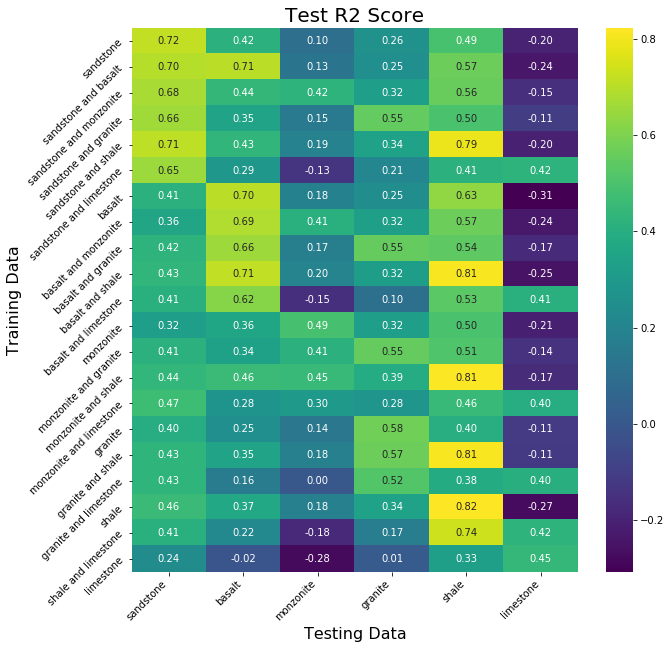

In [43]:
print("\nPerforming transfer learning, reprinting r2 scores \nand plotting score martix:\n")
counter = 0
#r2_test_matrix = np.zeros((len(model_permutations),len(rock_list)))
for i in range(len(model_permutations)):
    for j in range(len(rock_list)):
        if r2_rock_matrix[i,j] == 0:
            filenames = ['strains_curr_'+experiment+'_g'+rad+'0.txt' for experiment in rock_list[j]]
            dataframe, timespan = get_experiment_data(folder, filenames, features, target)
            scores = test_regression_model(model_permutations[i], features, target, dataframe)
            r2_rock_matrix[i,j] = scores[-1]
            
            print(f"Trained on {combined_names[i]}, Tested on {rock_list[j]} \n score: r2 = {scores[-1]}")
    counter += 1
    print(counter)
        
#plot_sns_score_matrix(r2_test_matrix,experiments,experiments,["XGB Test R2 Score g20", "Testing Data", "Training Data"], savename='../Figures1/strain_single_transfer_xgb_g20')
#np.savetxt(result_folder+model_score_matrix,r2_test_matrix)    
print(r2_test_matrix)
np.savetxt(result_folder+model_score_matrix,r2_rock_matrix)
plot_sns_score_matrix(r2_rock_matrix,combined_names,rock_names,["Test R2 Score", "Testing Data", "Training Data"], diagonal=False, savename='../Figures1/rock_type_transfer_testing_xgb_g50_score_matrix')

In [44]:
print(r2_rock_matrix)

[[ 0.72072103  0.41576841  0.10160515  0.25862991  0.49216889 -0.19777254]
 [ 0.69570666  0.70517706  0.12893331  0.24921711  0.5702173  -0.24065209]
 [ 0.67550647  0.44037675  0.42220071  0.32154279  0.56146678 -0.1538188 ]
 [ 0.6600373   0.34891118  0.15273235  0.54952428  0.49627145 -0.10518606]
 [ 0.70931513  0.43312357  0.19315702  0.34156363  0.79050245 -0.20180436]
 [ 0.65199979  0.29187127 -0.13315012  0.20920232  0.41415251  0.42098749]
 [ 0.41241048  0.70387514  0.18397849  0.24589771  0.63321206 -0.30719973]
 [ 0.35639768  0.68718348  0.41028604  0.323833    0.56684462 -0.23651223]
 [ 0.42263766  0.65593709  0.17469433  0.55446227  0.54013101 -0.17102962]
 [ 0.43212313  0.7128799   0.20315756  0.3189677   0.81357582 -0.25137503]
 [ 0.41183481  0.61555416 -0.14898589  0.10398363  0.53386674  0.41161223]
 [ 0.32365232  0.36164656  0.49144776  0.32090936  0.49674065 -0.20717212]
 [ 0.41424036  0.33691284  0.41236714  0.55471437  0.51325794 -0.14488024]
 [ 0.43501616  0.46045111

In [45]:
#print(r2_rock_matrix)
#np.savetxt(result_folder+model_score_matrix,r2_test_matrix)
#plot_sns_score_matrix(r2_test_matrix,rock_names,rock_names,["Test R2 Score", "Training Data", "Training Data"], diagonal=False, savename='../Figures1/rock_type_transfer_xgb_g50_score_matrix')